# Εργαστηριακή Άσκηση 2. Μη επιβλεπόμενη μάθηση. 
## Σύστημα συστάσεων βασισμένο στο περιεχόμενο
## Σημασιολογική απεικόνιση δεδομένων με χρήση SOM 
Ημερομηνία εκφώνησης της άσκησης: 23 Νοεμβρίου 2020



# Team Information

Team Number : 30
- Members:
  - Αναστασάκης Ζαχαρίας
    - ΑΜ : 03116675
    - email : zaxarisanastasakis@gmail.com
  - Αντωνίου Κωνσταντίνος
    -  ΑΜ : 03116169
    - email : kostas.an2016@gmail.com
  - Βάκης Μιχαήλ
   - ΑΜ : 03113137
   - email : mmvaki@hotmail.com
  

In [ ]:
!pip install --upgrade pip
!pip install --upgrade numpy
!pip install --upgrade scipy
!pip install --upgrade pandas
!pip install --upgrade nltk
!pip install --upgrade scikit-learn
!pip install --upgrade joblib

## Εισαγωγή του Dataset

Το σύνολο δεδομένων με το οποίο θα δουλέψουμε είναι βασισμένο στο [Carnegie Mellon Movie Summary Corpus](http://www.cs.cmu.edu/~ark/personas/). Πρόκειται για ένα dataset με περίπου 40.000 περιγραφές ταινιών. Η περιγραφή κάθε ταινίας αποτελείται από τον τίτλο της, μια ή περισσότερες ετικέτες που χαρακτηρίζουν το είδος της ταινίας και τέλος τη σύνοψη της υπόθεσής της. Αρχικά εισάγουμε το dataset (χρησιμοποιήστε αυτούσιο τον κώδικα, δεν χρειάζεστε το αρχείο csv) στο dataframe `df_data_1`: 

In [ ]:
import pandas as pd

dataset_url = "https://drive.google.com/uc?export=download&id=1PdkVDENX12tQliCk_HtUnAUbfxXvnWuG"
df_data_1 = pd.read_csv(dataset_url, sep='\t',  header=None, quoting=3, error_bad_lines=False)

Κάθε ομάδα θα δουλέψει σε ένα μοναδικό υποσύνολο 5.000 ταινιών (διαφορετικό dataset για κάθε ομάδα) ως εξής

1. Κάθε ομάδα έχει έναν αριθμό "seed" (φύτρο) που είναι ο ίδιος με τον αριθμό της ομάδας σας: θα τον βρείτε στην κολόνα Α/Α [εδώ](https://docs.google.com/spreadsheets/d/1CD6AtX7YnocXceCELl_XJ06kyRr0YQPhor8dpw012t0/edit?usp=sharing).

2. Το data frame `df_data_2` έχει γραμμές όσες και οι ομάδες και 5.000 στήλες. Σε κάθε ομάδα αντιστοιχεί η γραμμή του πίνακα με το `team_seed_number` της. Η γραμμή αυτή θα περιλαμβάνει 5.000 διαφορετικούς αριθμούς που αντιστοιχούν σε ταινίες του αρχικού dataset. 

3. Στο επόμενο κελί αλλάξτε τη μεταβλητή `team_seed_number` με το Seed της ομάδας σας.

4. Τρέξτε τον κώδικα. Θα προκύψουν τα μοναδικά για κάθε ομάδα  titles, categories, catbins, summaries και corpus με τα οποία θα δουλέψετε.

In [ ]:
import numpy as np

# βάλτε το seed που αντιστοιχεί στην ομάδα σας
team_seed_number = 30

movie_seeds_url = "https://drive.google.com/uc?export=download&id=1EA_pUIgK5Ub3kEzFbFl8wSRqAV6feHqD"
df_data_2 = pd.read_csv(movie_seeds_url, header=None, error_bad_lines=False)

# επιλέγεται 
my_index = df_data_2.iloc[team_seed_number,:].values

titles = df_data_1.iloc[:, [2]].values[my_index] # movie titles (string)
categories = df_data_1.iloc[:, [3]].values[my_index] # movie categories (string)
bins = df_data_1.iloc[:, [4]]
catbins = bins[4].str.split(',', expand=True).values.astype(np.float)[my_index] # movie categories in binary form (1 feature per category)
summaries =  df_data_1.iloc[:, [5]].values[my_index] # movie summaries (string)
corpus = summaries[:,0].tolist() # list form of summaries

In [ ]:
print('Shape of titles is : ', titles.shape, 'and an example of a title is : ', titles[1])
print('Shape of categories is : ', categories.shape, 'and an example of  categories for ', titles[1][0],'are : ', categories[1])
print('Shape of bin is : ', bins.shape)
print('Shape of catbins is : ', catbins.shape)
print('Shape of summaries is : ', summaries.shape)
print('Length of corpus is : ', len(corpus))

Shape of titles is :  (5000, 1) and an example of a title is :  ['Josef']
Shape of categories is :  (5000, 1) and an example of  categories for  Josef are :  ['"Action",  "War film"']
Shape of bin is :  (22302, 1)
Shape of catbins is :  (5000, 322)
Shape of summaries is :  (5000, 1)
Length of corpus is :  5000


- Ο πίνακας **titles** περιέχει τους τίτλους των ταινιών. Παράδειγμα: 'Sid and Nancy'.
- O πίνακας **categories** περιέχει τις κατηγορίες (είδη) της ταινίας υπό τη μορφή string. Παράδειγμα: '"Tragedy",  "Indie",  "Punk rock",  "Addiction Drama",  "Cult",  "Musical",  "Drama",  "Biopic \[feature\]",  "Romantic drama",  "Romance Film",  "Biographical film"'. Παρατηρούμε ότι είναι μια comma separated λίστα strings, με κάθε string να είναι μια κατηγορία.
- Ο πίνακας **catbins** περιλαμβάνει πάλι τις κατηγορίες των ταινιών αλλά σε δυαδική μορφή ([one hot encoding](https://hackernoon.com/what-is-one-hot-encoding-why-and-when-do-you-have-to-use-it-e3c6186d008f)). Έχει διαστάσεις 5.000 x 322 (όσες οι διαφορετικές κατηγορίες). Αν η ταινία ανήκει στο συγκεκριμένο είδος η αντίστοιχη στήλη παίρνει την τιμή 1, αλλιώς παίρνει την τιμή 0.
- Ο πίνακας **summaries** και η λίστα **corpus** περιλαμβάνουν τις συνόψεις των ταινιών (η corpus είναι απλά ο summaries σε μορφή λίστας). Κάθε σύνοψη είναι ένα (συνήθως μεγάλο) string. Παράδειγμα: *'The film is based on the real story of a Soviet Internal Troops soldier who killed his entire unit  as a result of Dedovschina. The plot unfolds mostly on board of the prisoner transport rail car guarded by a unit of paramilitary conscripts.'*
- Θεωρούμε ως **ID** της κάθε ταινίας τον αριθμό γραμμής της ή το αντίστοιχο στοιχείο της λίστας. Παράδειγμα: για να τυπώσουμε τη σύνοψη της ταινίας με `ID=99` (την εκατοστή) θα γράψουμε `print(corpus[99])`.

In [ ]:
ID = 99
print(titles[ID])
print(categories[ID])
print(catbins[ID])
print(corpus[ID])

['A Very Long Engagement']
['"World cinema",  "Period piece",  "Drama",  "War film",  "Romantic drama",  "Romance Film"']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0

# Εφαρμογή 1. Υλοποίηση συστήματος συστάσεων ταινιών βασισμένο στο περιεχόμενο
<img src="http://clture.org/wp-content/uploads/2015/12/Netflix-Streaming-End-of-Year-Posts.jpg" width="70%">

Η πρώτη εφαρμογή που θα αναπτύξετε θα είναι ένα [σύστημα συστάσεων](https://en.wikipedia.org/wiki/Recommender_system) ταινιών βασισμένο στο περιεχόμενο (content based recommender system). Τα συστήματα συστάσεων στοχεύουν στο να προτείνουν αυτόματα στο χρήστη αντικείμενα από μια συλλογή τα οποία ιδανικά θέλουμε να βρει ενδιαφέροντα ο χρήστης. Η κατηγοριοποίηση των συστημάτων συστάσεων βασίζεται στο πώς γίνεται η επιλογή (filtering) των συστηνόμενων αντικειμένων. Οι δύο κύριες κατηγορίες είναι η συνεργατική διήθηση (collaborative filtering) όπου το σύστημα προτείνει στο χρήστη αντικείμενα που έχουν αξιολογηθεί θετικά από χρήστες που έχουν παρόμοιο με αυτόν ιστορικό αξιολογήσεων και η διήθηση με βάση το περιεχόμενο (content based filtering), όπου προτείνονται στο χρήστη αντικείμενα με παρόμοιο περιεχόμενο (με βάση κάποια χαρακτηριστικά) με αυτά που έχει προηγουμένως αξιολογήσει θετικά.

Το σύστημα συστάσεων που θα αναπτύξετε θα βασίζεται στο **περιεχόμενο** και συγκεκριμένα στις συνόψεις των ταινιών (corpus). 


## Μετατροπή σε TFIDF

Το πρώτο βήμα θα είναι λοιπόν να μετατρέψετε το corpus σε αναπαράσταση tf-idf:

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
vectorizer.fit(corpus)
corpus_tf_idf = vectorizer.transform(corpus).toarray()

print('Number of unique words found is : ',len(vectorizer.get_feature_names()))
print('Shape of vectorized corpus is : ',corpus_tf_idf.shape)


Number of unique words found is :  48964
Shape of vectorized corpus is :  (5000, 48964)


Η συνάρτηση [TfidfVectorizer](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) όπως καλείται εδώ **δεν είναι βελτιστοποιημένη**. Οι επιλογές των μεθόδων και παραμέτρων της μπορεί να έχουν **δραματική επίδραση στην ποιότητα των συστάσεων** και είναι διαφορετικές για κάθε dataset. Επίσης, οι επιλογές αυτές έχουν πολύ μεγάλη επίδραση και στη **διαστατικότητα και όγκο των δεδομένων**. Η διαστατικότητα των δεδομένων με τη σειρά της θα έχει πολύ μεγάλη επίδραση στους **χρόνους εκπαίδευσης**, ιδιαίτερα στη δεύτερη εφαρμογή της άσκησης. Ανατρέξτε στα notebooks του εργαστηρίου και στο [FAQ](https://docs.google.com/document/d/1hou1gWXQuHAB7J2aV44xm_CtAWJ63q6Cu1V6OwyL_n0/edit?usp=sharing) των ασκήσεων.


In [ ]:
#example of words found
print(vectorizer.get_feature_names())

['00', '000', '00007693', '000th', '001', '003', '007', '008', '00pm', '01', '01565', '02', '020102', '03358', '034211', '04', '05', '052009', '0578', '06', '060304', '07', '08', '09', '09220222', '0document_id', '10', '100', '1000', '1002', '100m', '100th', '101', '101229995', '1013', '101st', '1023', '1030', '104', '104a', '105', '105743157', '106', '107', '107206', '10f', '10k', '10pm', '10s', '10th', '11', '110', '1100', '110th', '111', '111526', '112', '11343', '1134924', '1138', '1156', '117', '1186', '119', '1196', '11th', '12', '120', '1200', '1206', '1212', '1227', '123', '123562', '124', '125', '125th', '12740', '1279', '12th', '13', '130', '131', '131196016945630', '132', '133', '1337040', '134', '135', '1375', '138062', '139', '13th', '14', '1400', '141', '142', '146', '147', '1478456', '148', '14849', '149603', '14th', '15', '150', '1500', '151', '1517', '1521', '1526', '153', '1538', '155', '157', '1585', '159', '1596', '1597', '15k', '15s', '15th', '16', '160', '1600', '

## Υλοποίηση του συστήματος συστάσεων

Το σύστημα συστάσεων που θα παραδώσετε θα είναι μια συνάρτηση `content_recommender` με δύο ορίσματα `target_movie` και `max_recommendations`. Στην `target_movie` περνάμε το ID μιας ταινίας-στόχου για την οποία μας ενδιαφέρει να βρούμε παρόμοιες ως προς το περιεχόμενο (τη σύνοψη) ταινίες, `max_recommendations` στο πλήθος.
Υλοποιήστε τη συνάρτηση ως εξής: 
- για την ταινία-στόχο, από το `corpus_tf_idf` υπολογίστε την [ομοιότητα συνημιτόνου](https://en.wikipedia.org/wiki/Cosine_similarity) της με όλες τις ταινίες της συλλογής σας
- με βάση την ομοιότητα συνημιτόνου που υπολογίσατε, δημιουργήστε ταξινομημένο πίνακα από το μεγαλύτερο στο μικρότερο, με τα indices (`ID`) των ταινιών. Παράδειγμα: αν η ταινία με index 1 έχει ομοιότητα συνημιτόνου με 3 ταινίες \[0.2 1 0.6\] (έχει ομοιότητα 1 με τον εαύτό της) ο ταξινομημένος αυτός πίνακας indices θα είναι \[1 2 0\].
- Για την ταινία-στόχο εκτυπώστε: id, τίτλο, σύνοψη, κατηγορίες (categories)
- Για τις `max_recommendations` ταινίες (πλην της ίδιας της ταινίας-στόχου που έχει cosine similarity 1 με τον εαυτό της) με τη μεγαλύτερη ομοιότητα συνημιτόνου (σε φθίνουσα σειρά), τυπώστε σειρά σύστασης (1 πιο κοντινή, 2 η δεύτερη πιο κοντινή κλπ), id, τίτλο, σύνοψη, κατηγορίες (categories)


Παρακάτω δημιουργούμε την συνάρτηση $ content\ recommender$ όπως ακριβώς μας ζητείται παραπάνω. Έπειτα δίνουμε ένα παράδειγμα κλήσης της συνάρτησης που υλοποιήσαμε.

In [ ]:
import scipy as sp
from scipy.spatial.distance import cosine

END = '\033[0m'
CYAN = '\033[96m'
GREEN = '\033[92m'
UNDERLINE = '\033[4m'

def print_details(id, number):   #presentation issues
  if number > 0:
    print(UNDERLINE+'-No.'+ str(number)+END)
  print('ID :', id)
  print('Title :', titles[id][0])
  print('Categories :', categories[id][0])
  print('Summary :',corpus[id])
  print()
  


def content_recommender(target_movie, max_recommendations):

  number = 0
  cosine_similarities = []
  for i in range(len(corpus)):

    cosine_similarities.append(cosine(corpus_tf_idf[target_movie], corpus_tf_idf[i]))

  sorted_cosine = np.argsort(cosine_similarities)
  similar_movies = sorted_cosine[:max_recommendations+1]

  for movies in similar_movies:
    if movies == target_movie:
      print(CYAN+'**Target movie**'+END, '\n')
      print_details(movies, 0)
      print(GREEN+'**Recommendations**'+END, '\n')
    else:
      number += 1
      print_details(movies, number)
  
  print(' - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ')
  

In [ ]:
# lets create an example
content_recommender(12, 3)

**Target movie** 

ID : 12
Title : The Year of Getting to Know Us
Categories : "Indie",  "Family Drama",  "Comedy-drama",  "Drama",  "Comedy",  "Film adaptation"
Summary : Christopher Rocket is a man loyal to his work but unable to fulfill his girlfriend Anne or anything else in his personal life. He came back to his homeland after his estranged father Tom Rocket suffers a stroke. Jane Rocket, his mother, is a central figure in his dysfunctional past.

**Recommendations** 

-No.1
ID : 634
Title : Woodpecker in the Moon
Categories : "Short Film",  "Comedy film",  "Family Film",  "Science Fiction",  "Animation"
Summary : The cartoon opens with a narrative about man's desire to break away from Earth and explore outer space . After many unsuccessful attempts to launch rockets to the moon , Professor Dingledong becomes the first man to reach the moon, but, two years later, hasn't returned to Earth. In the present day, at the Interplanetary Rocket Society, Professor P. Cosmo Clonk asks the o

## Βελτιστοποίηση

Αφού υλοποιήσετε τη συνάρτηση `content_recommender` χρησιμοποιήστε τη για να βελτιστοποιήσετε την `TfidfVectorizer`. Συγκεκριμένα, αρχικά μπορείτε να δείτε τι επιστρέφει το σύστημα για τυχαίες ταινίες-στόχους και για ένα μικρό `max_recommendations` (2 ή 3). Αν σε κάποιες ταινίες το σύστημα μοιάζει να επιστρέφει σημασιολογικά κοντινές ταινίες σημειώστε το `ID` τους. Δοκιμάστε στη συνέχεια να βελτιστοποιήσετε την `TfidfVectorizer` για τα συγκεκριμένα `ID` ώστε να επιστρέφονται σημασιολογικά κοντινές ταινίες για μεγαλύτερο αριθμό `max_recommendations`. Παράλληλα, όσο βελτιστοποιείτε την `TfidfVectorizer`, θα πρέπει να λαμβάνετε καλές συστάσεις για μεγαλύτερο αριθμό τυχαίων ταινιών. Μπορείτε επίσης να βελτιστοποιήσετε τη συνάρτηση παρατηρώντας πολλά φαινόμενα που το σύστημα εκλαμβάνει ως ομοιότητα περιεχομένου ενώ επί της ουσίας δεν είναι επιθυμητό να συνυπολογίζονται (δείτε σχετικά το [FAQ](https://docs.google.com/document/d/1hou1gWXQuHAB7J2aV44xm_CtAWJ63q6Cu1V6OwyL_n0/edit?usp=sharing)). Ταυτόχρονα, μια άλλη κατεύθυνση της βελτιστοποίησης είναι να χρησιμοποιείτε τις παραμέτρους του `TfidfVectorizer` έτσι ώστε να μειώνονται οι διαστάσεις του Vector Space Model μέχρι το σημείο που θα αρχίσει να εμφανίζονται επιπτώσεις στην ποιότητα των συστάσεων. 




### Unoptimized examples
Παρακάτω θα δώσουμε 2 παραδείγματα της αρχικής κλήσης της συνάρτησης (μη βελτιστοποιημένης) για τα οποία τα αποτελέσματα που πήραμε είναι descent.

In [ ]:
#pretty good results
content_recommender(0,3)

**Target movie** 

ID : 0
Title : Thalaivan Irukkiraan
Categories : "Thriller"
Summary :  In the opening frame, the recently dismissed Hyderabad Police Commissioner - Eashwar Prasad  standing at the lakeshore, describes in a voice-over about his termination due to a common man walked into his life and turning everything topsy-turvy. This scene leads into the flashback. An unnamed man  is shown strategically placing a travel bag within a train in a railway station, bus and in a multiplex at Hyderabad. He proceeds to place another bag, under the false pretense of lodging an FIR, in the toilet of a police station located at Lakdi-ka-pool, Hyderabad. He then arrives on the rooftop of a building under construction near Raj Bhavan road and sets up his base of operations, equipped with various modern technology gadgets and instruments. He calls up Eashwar and informs him that 5 bombs have been placed in different locations throughout Hyderabad, which are programmed to explode simultaneously w

In [ ]:
content_recommender(4,3)

**Target movie** 

ID : 4
Title : Night Passage
Categories : "Action/Adventure",  "Western"
Summary : On the way to meet his former boss, railroad tycoon Ben Kimball , Grant McLaine  rescues a young boy, Joey Adams , from Concho . Ben informs Grant that his payroll has been robbed several times already by a gang led by Whitey Harbin  and the Utica Kid . If Ben's workers don't get paid soon, they will all leave. Grant accepts the job of taking $10,000 to them by train. When the train is held up again, Grant hides the money in a shoebox carried by Joey. The ploy works, but the young boy turns out to be friends with the Utica Kid, who takes him along with him. When the robbers cannot find the money, they take Ben's wife Verna  to hold for ransom. Concho, a member of the gang, knocks out Grant for revenge, and the train leaves without him. When Grant wakes up, he trails the gang to a ghost town. He boldly asks to join up, revealing that he is the Kid's older brother [interestingly, the Kid

### Optimization before vectorizing

In [ ]:
import nltk

Από εδώ και πέρα θα ξεκινήσουμε την επεξεργασία και την προσπάθεια βελτιστοποίσης του recommender μας. Η εξήγηση για τις επιλογές μας θα γίνει στην επόμενη ενότητα.

In [ ]:
# remove punctuation and stop words as the first step
# also we apply stemming and lemmatizing 

nltk.download('punkt') # χρειάζεται για το tokenizer
nltk.download('stopwords') # κατεβάζουμε ένα αρχείο που έχει stopwords στα αγγλικά
nltk.download('wordnet') # απαραίτητα download για τους stemmer/lemmatizer
nltk.download('rslp')
nltk.download('names')
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import names


def thorough_filter(words):     #provided by lab => further filtering for punctuation
    filtered_words = []
    for word in words:
        pun = []
        for letter in word:
            pun.append(letter in string.punctuation)
        if not all(pun):
            filtered_words.append(word)
    return filtered_words



def preprocessing(doc, technique):

  freq_words = ['movie', 'cinema', 'plot', 'film', 'story']
  words = nltk.word_tokenize(doc.lower())   #tokenize the text in each doc and transform all letter to lower case
  names_found = names.words('male.txt') + names.words('female.txt')
  names_found = [x.lower() for x in names_found]

  filtered_words = [word for word in words if word not in stopwords.words('english') + list(string.punctuation)]   #removing punctuation and stop words
  filtered_words_no_names = [word for word in filtered_words if word not in names_found]   #deleting names from the summaries that dont give any information
  
  filtered_words = thorough_filter(filtered_words_no_names)   #thorough filter in order to delete punctuation
  filtered_words = [word for word in filtered_words if word not in freq_words]   #delete some common words that dont enhance our performance

  if technique == 'stemming':
    final_words = [PorterStemmer().stem(word) for word in filtered_words]  #apply stemming

  elif technique == 'lemmatizing':
    final_words = [WordNetLemmatizer().lemmatize(word) for word in filtered_words]  #apply lemmatizing

  else:
    raise NameError("Give one of the following names for technique variable : stemming or lemmatizing")

  return ' '.join(final_words)



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Unzipping stemmers/rslp.zip.
[nltk_data] Downloading package names to /root/nltk_data...
[nltk_data]   Unzipping corpora/names.zip.


In [ ]:
#dont run this again just load the files with joblib
pre_corpus_ste = [preprocessing(doc,'stemming') for doc in corpus]
pre_corpus_lem = [preprocessing(doc, 'lemmatizing') for doc in corpus]

In [ ]:
#random example
print('Original length of corpus[3] is : ', len(corpus[3]))
print('Length of optimized stem_corpus[3] is : ', len(pre_corpus_ste[3]))
print('Length of optimized lem_corpus[3] is : ', len(pre_corpus_lem[3]))

Original length of corpus[3] is :  1289
Length of optimized stem_corpus[3] is :  769
Length of optimized lem_corpus[3] is :  834


In [ ]:
import joblib

In [ ]:
joblib.dump(pre_corpus_ste, 'corpus_ste.pkl') 

['corpus_ste.pkl']

In [ ]:
joblib.dump(pre_corpus_lem, 'corpus_lem.pkl') 

['corpus_lem.pkl']

In [ ]:
pre_corpus_ste = joblib.load('corpus_ste.pkl')

In [ ]:
pre_corpus_lem = joblib.load('corpus_lem.pkl')

### Explaning the steps of preprocessing before vectorizing

Θα εξηγήσουμε συνοπτικά τις επιλογές που κάναμε για την προεπεξεργασία των περιλήψεων πριν την εφαρμογή του vectorizer. Τα βήματα που ακολουθήσαμε έχουμε ως εξής:

- Αρχικά μετατρέψαμε κάθε λέξη σε μικρά γράμματα, ώστε να αντιμετωπίζονται με τον ίδιο τρόπο
- Χρησιμοποιώντας την βιβλιοθήκη nltk αφαιρέσαμε όλα τα stopwords που χρησιμοποιούνται συχνά στα Αγγλίκα όπως είναι οι λέξεις the, an, etc. Οι λέξεις αυτές δεν προσφέρουν τίποτα στην ερμηνεία του θέματος της κάθε ταινίας και γι' αυτό η αφαίρεση τους είναι αναγκαία. Επίσης χρησιμοποιώντας την βιβλιοθήκη string αφαιρέσαμε και τα σημεία στίξης.
- Χρησιμοποιώντας πάλι την βιβλιοθήκη nltk κατασκευάσαμε μία λίστα με αντρικά και γυναικεία ονομάτα και οποία αφαιρούμε επίσης απο το corpus. Παρατηρήσαμε ότι στις περιγραφές των ταινιών υπήρχαν αρκετα ονόματα τα οποία δεν μας έδιναν κάποια πληροφορία και γι' αυτό τα αφαιρέσαμε.
- Παρατηρήσαμε ότι δεν καταφέραμε να απαλείψουμε εντελώς τα σημεία στίξης και γι' αυτό χρησιμοποιήσαμε την συνάρτηση $thorough\_filter$ η οποία μας παρουσιάστηκε στο εργαστηρίο και η χρήση διώχνει τελείως τα σημεία στίξης.
- Κατασκευάσαμε μία λίστα με λέξεις οι οποίες παρουσιάζονται συχνά στις περιγραφές των ταινιών όπως οι λέξεις film, story etc και τις απαλείψαμε.
- Τέλος ανάλογα με το όρισμα που δίνουμε στην μεταβλητή technique αποφασίζουμε αν θα χρησιμοποιήσουμε stemming ή lemmatizing. Αρχικά επειδή δεν μπορούμε να είμαστε σίγουροι ποια τεχνική θα αποδώσει καλύτερα θα φτιάξουμε 2 αντικείμενα όπου στο ένα θα εφαρμοστεί stemming και στο άλλο lemmatizing.

### Creating and optimizing the vectorizer

In [ ]:
#fit and transform without tuning any of the parameters
vectorizer.fit(pre_corpus_ste)
corpus_tf_idf = vectorizer.transform(pre_corpus_ste).toarray()

print('Number of unique words found is : ',len(vectorizer.get_feature_names()))
print('Shape of vectorized corpus is : ',corpus_tf_idf.shape)

Number of unique words found is :  33628
Shape of vectorized corpus is :  (5000, 33628)


In [ ]:
content_recommender(0,6)

**Target movie** 

ID : 0
Title : Thalaivan Irukkiraan
Categories : "Thriller"
Summary :  In the opening frame, the recently dismissed Hyderabad Police Commissioner - Eashwar Prasad  standing at the lakeshore, describes in a voice-over about his termination due to a common man walked into his life and turning everything topsy-turvy. This scene leads into the flashback. An unnamed man  is shown strategically placing a travel bag within a train in a railway station, bus and in a multiplex at Hyderabad. He proceeds to place another bag, under the false pretense of lodging an FIR, in the toilet of a police station located at Lakdi-ka-pool, Hyderabad. He then arrives on the rooftop of a building under construction near Raj Bhavan road and sets up his base of operations, equipped with various modern technology gadgets and instruments. He calls up Eashwar and informs him that 5 bombs have been placed in different locations throughout Hyderabad, which are programmed to explode simultaneously w

In [ ]:
content_recommender(4,6)

**Target movie** 

ID : 4
Title : Night Passage
Categories : "Action/Adventure",  "Western"
Summary : On the way to meet his former boss, railroad tycoon Ben Kimball , Grant McLaine  rescues a young boy, Joey Adams , from Concho . Ben informs Grant that his payroll has been robbed several times already by a gang led by Whitey Harbin  and the Utica Kid . If Ben's workers don't get paid soon, they will all leave. Grant accepts the job of taking $10,000 to them by train. When the train is held up again, Grant hides the money in a shoebox carried by Joey. The ploy works, but the young boy turns out to be friends with the Utica Kid, who takes him along with him. When the robbers cannot find the money, they take Ben's wife Verna  to hold for ransom. Concho, a member of the gang, knocks out Grant for revenge, and the train leaves without him. When Grant wakes up, he trails the gang to a ghost town. He boldly asks to join up, revealing that he is the Kid's older brother [interestingly, the Kid

In [ ]:
content_recommender(25,6)

**Target movie** 

ID : 25
Title : Santa Fe Trail
Categories : "Historical fiction",  "Black-and-white",  "Action/Adventure",  "Western",  "Drama",  "Action"
Summary : At the West Point Military Academy in 1854, Cadet Carl Rader  , a disciple of the fanatic abolitionist John Brown, is dishonorably discharged for conspiracy. His classmates Jeb Stuart  and George Custer  become second lieutenants and are posted to Fort Leavenworth, Kansas Territory, the most dangerous duty in the army. On the way to Kansas, Custer and Stuart meet Cyrus K. Holliday, in charge of building the railroad to Santa Fe, New Mexico, and his daughter Kit , with whom both officers fall in love. The Kansas Territory is bloodstained and war-torn, a victim of John Brown's relentless crusade against slavery. Meanwhile, Rader has enlisted as a mercenary in Brown's army, which has been terrorizing the countryside with bloody raids. During Brown's attack on a freight wagon under the protection of the U.S. Army, Stuart and

In [ ]:
#fit and transform without tuning any of the parameters
vectorizer.fit(pre_corpus_lem)
corpus_tf_idf = vectorizer.transform(pre_corpus_lem).toarray()

print('Number of unique words found is : ',len(vectorizer.get_feature_names()))
print('Shape of vectorized corpus is : ',corpus_tf_idf.shape)

Number of unique words found is :  41878
Shape of vectorized corpus is :  (5000, 41878)


In [ ]:
content_recommender(0,6)

**Target movie** 

ID : 0
Title : Thalaivan Irukkiraan
Categories : "Thriller"
Summary :  In the opening frame, the recently dismissed Hyderabad Police Commissioner - Eashwar Prasad  standing at the lakeshore, describes in a voice-over about his termination due to a common man walked into his life and turning everything topsy-turvy. This scene leads into the flashback. An unnamed man  is shown strategically placing a travel bag within a train in a railway station, bus and in a multiplex at Hyderabad. He proceeds to place another bag, under the false pretense of lodging an FIR, in the toilet of a police station located at Lakdi-ka-pool, Hyderabad. He then arrives on the rooftop of a building under construction near Raj Bhavan road and sets up his base of operations, equipped with various modern technology gadgets and instruments. He calls up Eashwar and informs him that 5 bombs have been placed in different locations throughout Hyderabad, which are programmed to explode simultaneously w

In [ ]:
content_recommender(4,6)

**Target movie** 

ID : 4
Title : Night Passage
Categories : "Action/Adventure",  "Western"
Summary : On the way to meet his former boss, railroad tycoon Ben Kimball , Grant McLaine  rescues a young boy, Joey Adams , from Concho . Ben informs Grant that his payroll has been robbed several times already by a gang led by Whitey Harbin  and the Utica Kid . If Ben's workers don't get paid soon, they will all leave. Grant accepts the job of taking $10,000 to them by train. When the train is held up again, Grant hides the money in a shoebox carried by Joey. The ploy works, but the young boy turns out to be friends with the Utica Kid, who takes him along with him. When the robbers cannot find the money, they take Ben's wife Verna  to hold for ransom. Concho, a member of the gang, knocks out Grant for revenge, and the train leaves without him. When Grant wakes up, he trails the gang to a ghost town. He boldly asks to join up, revealing that he is the Kid's older brother [interestingly, the Kid

In [ ]:
content_recommender(25,6)

**Target movie** 

ID : 25
Title : Santa Fe Trail
Categories : "Historical fiction",  "Black-and-white",  "Action/Adventure",  "Western",  "Drama",  "Action"
Summary : At the West Point Military Academy in 1854, Cadet Carl Rader  , a disciple of the fanatic abolitionist John Brown, is dishonorably discharged for conspiracy. His classmates Jeb Stuart  and George Custer  become second lieutenants and are posted to Fort Leavenworth, Kansas Territory, the most dangerous duty in the army. On the way to Kansas, Custer and Stuart meet Cyrus K. Holliday, in charge of building the railroad to Santa Fe, New Mexico, and his daughter Kit , with whom both officers fall in love. The Kansas Territory is bloodstained and war-torn, a victim of John Brown's relentless crusade against slavery. Meanwhile, Rader has enlisted as a mercenary in Brown's army, which has been terrorizing the countryside with bloody raids. During Brown's attack on a freight wagon under the protection of the U.S. Army, Stuart and

Παρατηρούμε ότι είτε χρησιμοποιώντας stemming είτε lemmitization τα αποτελέσματα προς το παρόν είναι τα ίδια. Από εδώ και πέρα δεν θα παρουσιάζουμε και τις 2 τεχνικές(θα κρατήσουμε αυτή που δίνει καλύτερα αποτελέσματα ή στην περίπτωση που δίνουν ακριβώς τα ίδια θα επιλέξουμε βάσει θεωρίας). Η διαδικασία του tuning των παραμέτρων του vectorizer που θα ακολουθήσει δεν θα φανεί αναλυτικά λόγω των πολλών δοκιμών που θα επιχειρήσουμε. Θα χρησιμοποιήσουμε τα 3 παραδείγματα (και ίσως κάποια παραπάνω) που δείξαμε παραπάνω για να ελέγχουμε την απόδοση του vectorizer. 

>Γενικά θα ασχοληθούμε την βελτιστοποίηση 3 παραμέτρων του vectorizer. Οι παράμετροι αυτοί φαίνονται στην παρακάτω φωτογραφία απο την sklearn βιβλιοθήκη:
> 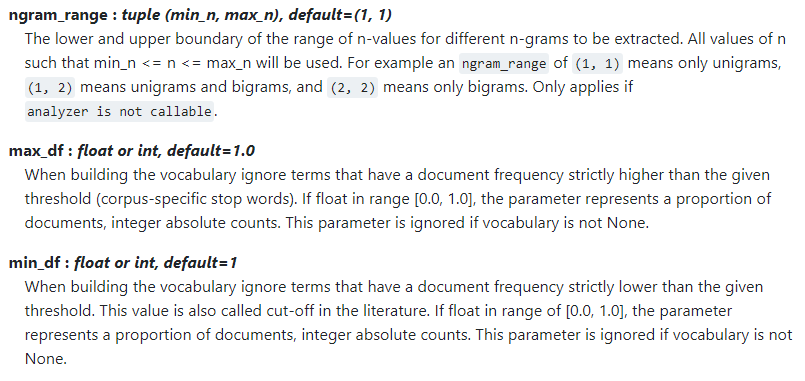

### Parameters optimization

Η διαδικασία που ακολουθήσαμε για κάθε μία εκ των παραμέτρων που αναφέρονται παραπάνω είναι η εξής:
- $ngram\_range$ : Δοκιμάσαμε αρκετούς συνδιασμούς για min_n και max_n παρόλα αυτά κανένας συνδιασμός εκτός του (1,1) που σημαίνει ότι θα υπάρχουν μόνο unigrams δεν κατάφερε να βελτιώσει την επίδοση. Πολλές φορές μάλιστα η επίδοση έπεφτε ραγδαία οποτέ δεν ασχοληθήκαμε περαιτέρω με την συγκεκριμένη παράμετρο.

- $max\_df$ : Παρατηρήσαμε ότι η παράμετρος αυτή δεν συμβάλει καθοριστικά στην μείωση των λέξεων. Αυτό συμβαίνει διότι στο στάδιο της προεπεξεργασίας είχαμε ήδη αφαιρέσει αρκετά stop words με αποτέλεσμα οι λέξεις που εμφανίζονται αρκετά συχνά σε ένα κείμενο να είναι ελάχιστες. Παρ' όλα αυτά για την max_df δοκιμάσαμε τιμές απο 0.1 έως 0.5. Οι τιμές αυτές ουσιαστικά σημαίνουν ότι θα αφαιρέσουμε τις λέξεις που εμφανίζονται στο 10% των κειμένων έως στο 50% τον κειμένων. Δοκιμάζοντας αυτές τις τιμές λοιπόν θα κρατήσουμε την τιμή 0.5 για την συγκεκριμένη παράμετρο.

- $min\_df$ : Η παράμετρος min_df είχε την μεγαλύτερη επίδραση στην μείωση των λέξεων και γι' αυτό το λόγο οι δοκιμές που κάναμε ήταν περισσότερες και πιο αναλυτικές. Χρησιμοποιήσαμε αριθμούς μεγαλύτερους απο 10 το οποίο πρακτικά σημαίνει ότι θα διαγράψουμε τις λέξεις που εμφανίζονται λιγότερες απο 10 (και παραπάνω, ανάλογα την τιμή που επιλέγουμε) φορές σε όλα τα κείμενα. Μετά απο πολλές δοκιμές καταλήξαμε στην τιμή 20 η οποία φαίνεται να δίνει αρκετά καλά αποτελέσματα. Οι τιμές μεγαλύτερες του 25 που δοκιμάστηκαν φάνηκε να χαλούν την απόδοση του recommender και αντίστοιχα ίδιες επιπτώσεις είχαν και οι τιμές μικρότερες του 10. Η τιμή που επιλέχθηκε δεν είναι απαραίτητο πως είναι η καλύτερη για όλες τις περιπτώσεις πράγμα που σημαίνει ότι ο recommender μας δεν μπορει να είναι τέλειος.

In [ ]:
vectorizer = TfidfVectorizer(max_df=0.5, stop_words='english', min_df=20)
vectorizer.fit(pre_corpus_ste)
corpus_tf_idf = vectorizer.transform(pre_corpus_ste).toarray()

print('Number of unique words found is : ',len(vectorizer.get_feature_names()))
print('Shape of vectorized corpus is : ',corpus_tf_idf.shape)

Number of unique words found is :  3480
Shape of vectorized corpus is :  (5000, 3480)


In [ ]:
#print the recommendations for the chosen movies
content_recommender(0,6)
content_recommender(4,6)
content_recommender(25,6)

**Target movie** 

ID : 0
Title : Thalaivan Irukkiraan
Categories : "Thriller"
Summary :  In the opening frame, the recently dismissed Hyderabad Police Commissioner - Eashwar Prasad  standing at the lakeshore, describes in a voice-over about his termination due to a common man walked into his life and turning everything topsy-turvy. This scene leads into the flashback. An unnamed man  is shown strategically placing a travel bag within a train in a railway station, bus and in a multiplex at Hyderabad. He proceeds to place another bag, under the false pretense of lodging an FIR, in the toilet of a police station located at Lakdi-ka-pool, Hyderabad. He then arrives on the rooftop of a building under construction near Raj Bhavan road and sets up his base of operations, equipped with various modern technology gadgets and instruments. He calls up Eashwar and informs him that 5 bombs have been placed in different locations throughout Hyderabad, which are programmed to explode simultaneously w

Γενικα παρατηρούμε ότι ο recommender μας δίνει αρκετά καλά αποτελέσματα για τις τυχαίες 3 ταινίες στόχους που του δώσαμε. Ενδεικτικά αναφέρουμε ότι για την πρώτη ταινία στόχο Thalaivan Irukkiraan όλες οι ταινίες που παρουσιάζονται έχουν να κάνουν με όργανα της τάξης(αστυνομία, FBI, DEA etc), με εκβιασμό και με βομβιστικές επιθέσεις. Επίσης η ταινία που προτείνεται ως πρώτη (Unnaipol Oruvan) είναι ακριβώς η ίδια ταινία η οποία άλλαξε τίτλο.

Δεν θα αναφέρουμε περισσότερα για τις 3 ταινίες παραπάνω καθώς στην επόμενη ενότητα θα δείξουμε πως λειτουργεί ο recommender μας για 10 άλλες ταινιές που δεν έχουμε ελέγξει μέχρι τώρα, ώστε να δούμε τελικά την αποτελεσματικότητα του.

Παρατηρούμε επίσης ότι σε σχέση με την non optimized μορφή ο τελικός recommender είναι σαφώς ανώτερος.

### 10 Recommendations + Consept analysis

Σε αυτό το σημείο θα παρουσιάσουμε 10 ταινίες και τα recommendations που δίνει το σύστημα μας γι' αυτές αναφέροντας και την κοινή θεματολογία που τις ενώνει.

$Important\ Disclaimer$ : Θεωρήσαμε πως είναι καλύτερο να καλούμε κάθε φορά ξεχωριστά την συνάρτηση content_recommender και να δείχνουμε τα αποτελέσματα αυτής σε κάθε cell ξεχωριστά. Επειδή η συνάρτηση παρουσιάζει και το summary της ταινίας αν προσπαθούσαμε να βάλουμε όλα τα αποτελέσματα σ'ένα markdown τότε το συγκεκριμένο cell θα ήταν χαοτικό. Επίσης για κάθε ταινία στόχο θα παρουσιάζουμε 7 recommendations πάλι με κύριο γνώμονα την καλύτερη αναπαράσταση των αποτελεσμάτων.

Επομένως για κάθε ταινία στόχο θα τυπώνουμε τα recommendations και ακριβώς στο κάτω cell απο αυτά θα τονίζουμε τις ομοιότητες που υπάρχουν στο θέμα των ταινιών.

In [ ]:
content_recommender(4738, 7)

**Target movie** 

ID : 4738
Title : A-Lad-In His Lamp
Categories : "Family Film",  "Comedy"
Summary : Bugs finds Aladdin's lamp while digging a rabbit hole; believing it junk, he starts to clean it, and a genie appears and tells him to make a wish. Calling him "Smokey", Bugs reluctantly starts to make multiple wishes, only to be interrupted by the genie each time; Bugs ultimately requests two carrots, which the genie produces. Smokey remarks that he wants to return to his home in Baghdad and wishes to take Bugs with him, so Bugs accepts , and the two fly off to Baghdad. Before they arrive in Baghdad , the aerial view depicts two bodies of water named Veronica Lake and Turhan Bay; when in the city, the view includes places such as "The Brown Turban", the Temple Bell telephone company with a sign for Persian to Persian calls, and Mad Man Hassan's used magic carpet lot. Bugs and the Genie in the lamp arrive in Baghdad, but Bugs' flying in the air sputters and conks out and Bugs and the l

Όλες οι ταινίες που προτείνονται παραπάνω έχουν να κάνουν με τον Bugs Bunny και επομένως ο recommender μας στην συγκεκριμένη περίπτωση βρίσκει τις λέξεις Bugs, Bunny, rabbit, carrot etc πολλές φορές στις περιγραφές των ταινιών και γι' αυτό το λόγο τις προτείνει. Παρ' όλο που μπορεί η πλοκή των συγκεκριμένων ταινίων να μην είναι παρόμοια σε όλες τις περιπτώσεις η ποιότητα των recommendations θεωρείται πολύ καλή καθώς όλες οι ταινίες είναι comedies και family films τα οποία έχουν σαν κοινό πρωταγωνιστή τον Bugs Bunny. 

In [ ]:
content_recommender(4618,7)

**Target movie** 

ID : 4618
Title : Person To Bunny
Categories : "Comedy"
Summary : In his Hollywood home Bugs Bunny is being interviewed on the TV show "People to People" with Cedric R. Burrows . As Bugs is interviewed, Daffy Duck shows up. Seeing that Bugs is being interviewed, Daffy decides to get in on the action, but Bugs doesn't want to interfere and puts him out. Burrows asks how Bugs has outsmarted Elmer Fudd over the years and Bugs answers that is far from clever and notoriously stupid. Elmer is watching the program at home and upon hearing Bugs remarks about him gets angry and decides to come to the interview. Elmer comes over and Bugs stops the interview to settle with Elmer while Daffy sings a Ted Lewis song to Mr. Burrows. Elmer gives Bugs a chance to apologise for calling him stupid or get shot, but Bugs puts a carrot in the gun and it backfires on him. Elmer puts his rifle through a crack in the door and Bugs tricks Daffy into thinking its a TV camera. Elmer shoots Daff

In [ ]:
content_recommender(1592,7)

**Target movie** 

ID : 1592
Title : Bushy Hare
Categories : "Short Film",  "Family Film",  "Animated cartoon"
Summary : Bugs pops out in Golden Gate Park and encounters a man, who asks Bugs to hold his balloons while he ties his shoelaces. Bugs complies, but soon finds himself drifting off into the ocean. Eventually he clashes with a stork delivering a joey, in which Bugs is switched with the joey and is brought to Australia, dropped into a kangaroo's arms. Bugs refuses to be the kangaroo's baby, but feels guilty after the kangaroo starts crying and agrees to be its 'baby'. After a wild ride inside the kangaroo's pouch, Bugs gets out and is then struck by a boomerang thrown by an aborigine, whom Bugs later calls "Nature Boy". Bugs throws the boomerang away but it hits him again. 'Nature Boy' confronts Bugs teases him into a yelling fit. 'Nature Boy' throws his spear at Bugs, who runs and dives into a rabbit hole. Bugs tricks 'Nature Boy' into thinking he's stabbing the rabbit down the

Για τις παραπάνω 2 περιπτώσεις δοκιμάσαμε να κάνουμε ανακύκλωση των ταινιών που μας προτάθηκαν απο την ταινία A-Lad-In His Lamp(1ο target movi), ώστε να δούμε ότι ο recommender μας είναι consistent και δεν παρουσιάζει αλλόκοτες συμπεριφορές. Πράγματι παρατηρούμε ότι με διαφορετικό target movie κάθε φορά έχουμε οι συνολικές ταινίες (target + recommendations) παραμένουν ίδιες, όπως και άλλωστε θα έπρεπε. 



Αφού ελέγξαμε αυτό το κομμάτι του recommender μας τα υπόλοιπα 7 target movies δεν θα προκύπτουν από ανακύκλωση των προηγούμενων recommendations. Έτσι θα ελέγξουμε την γενική συμπεριφορά του recommender μας σε διαφορετικές μεταξύ τους ταινίες.

In [ ]:
content_recommender(703,7)

**Target movie** 

ID : 703
Title : Karm Yudh
Categories : "Action"
Summary : Karm Yudh is an action film in starring Mithun Chakraborty in lead role supported by Asha Sachdev, Anita Raj and Amrish Puri.

**Recommendations** 

-No.1
ID : 1465
Title : Ustadi Ustad Se
Categories : "Crime Fiction",  "Action",  "Drama"
Summary : Ustadi Ustad Se is an action thriller starring Mithun Chakraborty in the lead role supported by Vinod Mehra, Ranjeeta, Jayshree T. and Jagdeep.

-No.2
ID : 3261
Title : Aar Paar
Categories : "Action"
Summary : Aar Paar is an action film in starring Nutan and Mithun Chakraborty in lead roles supported by Mandakini, Ranjeet and Sadashiv Amrapurkar and Rajesh Khanna in a Special appearance.

-No.3
ID : 3820
Title : Karishma Kudrat Ka
Categories : "Drama",  "World cinema"
Summary : Karishma Kudrat Kaa is an action film in starring Dharmendra and Mithun Chakraborty in lead roles supported by Rati Agnihotri, Anita Raj and Shakti Kapoor.

-No.4
ID : 3705
Title : Sahhas
Ca

Η παραπάνω target movie έχει αρκετό ενδιαφέρον καθώς το summary της ταινίας είναι πολύ μικρό και δεν δίνει πληροφοριές για το περιεχόμενο της. Ο recommender μας σε αυτή την περίπτωση λειτουργεί όσο το δυνατόν καλύτερα θα μπορούσε εντοπίζοντας ταινίες που έχουν τον ίδιο ηθοποιό σε πρωταγωνιστικό ρόλο (Mithun Chakraborty). Όλες οι ταινίες που προτείνονται έχουν και αυτές μικρή περιγραφή και εκτός απο τον ίδιο πρωταγωνιστή μοιράζονται και τον χαρακτηρισμό action.

In [ ]:
content_recommender(4300,7)

**Target movie** 

ID : 4300
Title : Bride of Frankenstein
Categories : "Science Fiction",  "Horror",  "Comedy",  "Black-and-white",  "Monster"
Summary : On a stormy night, Percy Bysshe Shelley  and Lord Byron  praise Mary Shelley  for her story of Frankenstein and his Monster. Reminding them that her intention was to impart a moral lesson, Mary says she has more of the story to tell. The scene shifts to the end of the 1931 Frankenstein. Villagers gathered around the burning windmill cheer the apparent death of the Monster . Their joy is tempered by the realization that Henry Frankenstein  is also apparently dead. Hans , father of the girl the creature drowned in the previous film, wants to see the Monster's bones. He falls into a flooded pit underneath the mill, where the Monster&nbsp;— having survived the fire&nbsp;— strangles him. Hauling himself from the pit, the Monster casts Hans' wife ([[Mary Gordon  into it to her death. He next encounters Minnie ([[Una O'Connor , who flees in 

Η ταινία στόχος είναι η Bride of Frankenstein η οποία αποτελεί το sequel για την πρώτη προτεινόμενη ταινία που παράγουμε, Frankenstein. Για την συγκεκριμένη ταινία στόχο τα αποτελέσματα είναι "ανάμεικτα". Πιο συγκεκριμένα:
* Όλες οι ταινίες που προτείνονται έχουν σαν κύριο θέμα τα τέρατα, τις καταστροφές, τους επιστήμονες και γενικότερα τον φόβο και τον τρόμο.
* Πέντε απο τις επτά ταινίες που προτείνονται αφορούν την δημιουργία του Frankenstein.
* Οι άλλες 2 οι οποίες δεν μιλούν για τον Frankenstein έχουν κοινή θεματική καθώς μιλούν και αυτές για τέρατα.
* Το θέμα που προκύπτει απο τα συγκεκριμένα recommendations είναι ότι συγχέονται ταινίες τρόμου με ταινίες οι οποίες προορίζονται για οικογένειες και έχουν την έννοια του καρτουν. Το πρόβλημα αυτό δεν μπορούμε να το ελέγξουμε κάπως καθώς ο recommender μας είναι βάσει της περιγραφής της ταινίας και όχι βάσει των κατηγοριών της κάθε μίας απο αυτές. Έτσι όταν στην ταινία Scooby-Doo and the Loch Ness Monster αναφέρονται οι έννοιες του φόβου, των τεράτων κλπ ο recommender επειδή δεν έχει επίγνωση των κατηγοριών της κάθε ταινίας δεν μπορεί να αντιληφθεί την διαφορά μεταξύ του τρόμου σε ένα καρτουν με τον φόβο σε ενα θριλερ.

In [ ]:
content_recommender(301,7)

**Target movie** 

ID : 301
Title : Little Criminals
Categories : "Music",  "Experimental film",  "Avant-garde"
Summary : The story is mainly about an eleven year old child named Des. Des and his friends commit a variety of illegal activities like vandalism, stealing, lighting fires, mug people and use drugs. In Canada, the age of criminal responsibility is twelve. Des takes advantage of this law because he knows that the police cannot charge him because of his young age. When Des meets Cory, they become good friends and start a crime spree, feeling like nothing can stop them. Eventually, Des's mother admits she can't handle her child, and Des ends up in an assessment centre for troubled children. In the centre he meets Rita, a psychologist who tries to understand Des's motivations, and over time gets some positive results on his behaviour. But when Rita informs Des that they are trying to find him a foster home, Des flees as soon as his friend Cory visits him. They both want to get ou

H ταινία στόχος στην συγκεκριμένη περίπτωση έχει ως γενικό θέμα τις παράνομες δραστηριότητες, την προβληματική συμπεριφορά, την αστυνομία, τις ληστείες κλπ. Οι ταινίες που προτείνονται περιλαμβάνουν όλες παράνομες δραστηριότητες  (ληστείες, ναρκωτικά). Εξαιρώντας την ταινία My Boss's Daughter η οποία αν ο recommender μας έχει επίγνωση των κατηγοριών δεν θα προτεινόταν τόσο ψηλά, όλες οι υπόλοιπες αναφέρουν περιστατικά φόνων, αντιμετώπιση απο την δικαιοσύνη (αστυνομία, δικαστήριο, κέντρα προσαρμογής συμπεριφοράς) εξαιρώντας μόνο την ταινία A Nightmare on Elm Street στην οποία κυριαρούν και σε αυτή τα αισθήματα του τρόμου και του φόβου με την μόνο διαφορά εμπλέκονται και μεταφυσικές υπάρξεις.

In [ ]:
content_recommender(3735,7)

**Target movie** 

ID : 3735
Title : Mouse Menace
Categories : "Short Film",  "Family Film",  "Comedy",  "Animation"
Summary : There is a mouse invading Porky Pig's house, but so far Porky's attempts to rid the mouse have failed. Porky gets a cat to catch the mouse, only for the cat to get bound and launched out of the house. Next Porky borrows a Mountain Lion, but the mouse has petrified and stuffed the lion. Next Porky hires a gangster cat, but he leaves straight after a bonk on the head with a bowling ball. Without any success so far, Porky constructs a robotic cat. The mouse retaliates at the robot cat, which flawless being unaffected by a bowling ball, a flamethrowing boiler, dynamite and a pistol shot. The robot cat then blocks the mouse's ways into the mouse holes. The robot cat further resists the mouse's tricks from electrocution, more flamethrowing, decapitation and battering. Finally the mouse blows up the robot cat with a dynamite laced clockwork mouse, destroying Porky's h

Για αυτή την ταινία στόχο τα πράγματα είναι πολυ ξεκάθαρα καθώς όλες οι ταινίες έχουν να κάνουν με ποντίκια και κυνηγητό αυτών είτε απο γάτες(συντριπτική πλειοψηφία) είτε από ανθρώπους(Mousehunt). Σε γενικές γραμμές οι προτάσεις που δίνονται είναι άριστες καθώς μιλάμε για ταινίες με κοινό θέμα και κοινές κατηγορίες(comedy, family film etc). 

In [ ]:
content_recommender(932,7)

**Target movie** 

ID : 932
Title : Dirty Dancing: Havana Nights
Categories : "Dance",  "Indie",  "Period piece",  "Musical",  "Coming of age",  "Drama",  "Romantic drama",  "Romance Film",  "Musical Drama",  "Teen"
Summary : Katey Miller , her parents , and her younger sister Susie  arrive in Cuba during the Cuban revolution. A self-described bookworm, Katey is not very happy about having to move to a different country during her senior year of high school, as she had been planning to attend Radcliffe College, although the rest of her family seem extremely pleased to be in Cuba. Meeting several other rich American teenagers down by the pool, including James Phelps ([[Jonathan Jackson , the son of her father's boss, Katey becomes disgusted when one of the teenagers insults a waiter when he accidentally knocks over some of their drinks. Katey attempts to talk to the waiter - Javier , who works at the hotel to support his family - because she feels awful about what had occurred but he is

Και σε αυτή τη περίπτωση οι ταινίες που προτείνονται έχουν κοινή θεματική η οποία αναφέρεται στον χορό και στην μουσική. Αρκετές απο τις ταινίες που προτείνονται έχουν ρομαντικό χαρακτήρα, ενώ κάποιες άλλες είναι πιο "σκληρές". Η μόνη ταινία η οποία πιθανόν να μην έπρεπε να υπάρχει στα παραπάνω recommendations είναι η Blood Orgy of the Leather Girls η οποία είναι αρκετά πιο "βαρία" ταινία.

In [ ]:
content_recommender(700,7)

**Target movie** 

ID : 700
Title : Mr. Vampire II
Categories : "Horror",  "Comedy",  "World cinema",  "Chinese Movies"
Summary : Archaeologist Kwok Tun-wong brings his two students with him in search of ancient artifacts. They stumble upon a cave and discover three geung sis . The vampires are immobilised because they have Chinese talismans with spells written on them stuck to their foreheads. Kwok brings the corpses back to his lab and decides to sell the child vampire in the black market. While transporting the boy vampire, Kwok accidentally strips the talisman off its forehead and breaks the charm. The creature awakens and escapes. It enters a house by chance and befriends a little girl, who mistakes the young vampire for an illegal immigrant boy. Meanwhile back in the lab, one of Kwok's students mischievously removes the talismans from the adult vampires and revives them. The vampires start to "hop" around and attack people. It took the three men much trouble to put them back to r

Όλες οι ταινίες που προτείνονται για την συγκεκριμένη ταινία στόχο έχουν να κάνουμε με βρυκόλακες. Εδώ παρουσιάζεται ξανά το πρόβλημα των κατηγοριών αλλά σε πολύ μικρότερο βαθμό σε σχέση με τα παραπάνω παραδείγματα. Συγκεκριμένα όλες οι ταινίες εκτός της Pink Plasma είναι τρομακτικές και προκαλούν φόβο. Η ταινία Pink Plasma είναι εντός του κοινού θέματος με τους βρυκόλακες, αλλά ειναι καρτούν το οποίο σου προκαλεί περισσότερο γέλιο παρά φόβο.

In [ ]:
content_recommender(1054,7)

**Target movie** 

ID : 1054
Title : The Circus Clown
Categories : "Comedy-drama",  "Comedy",  "Black-and-white"
Summary : The Circus Clown is about a man who wants to join the circus against the wishes of his ex-circus clown father.

**Recommendations** 

-No.1
ID : 4997
Title : 3 Ring Circus
Categories : "Comedy"
Summary : Peter Nelson and Jerry Hotchkiss have just gotten out of the army. Hotchkiss decides to use the G.I. Bill to become a lion tamer. He gets a job with the Clyde Brent Circus , whose owner, Jill Brent, is in financial difficulties. Nelson tags along. Hotchkiss, while learning the lion trade, also does odd jobs at the circus, including filling in for the Human Cannonball. His real dream is to become a circus clown. Nelson, meanwhile, is shown a romantic interest by Saadia, Queen of the Trapeze, and quickly gets a job as her assistant. Brent has also shown interest in Nelson and becomes jealous. Hotchkiss finds Puffo the Clown in a drunken state, so he seizes the opport

Σαν τελευταίο παράδειγμα της χρήσης του recommender μας θα παρουσιάσουμε μία περίπτωση όπου τα αποτελέσματα είναι μεν λογικά αν αναλογιστούμε το πως λειτουργεί ο recommender, αλλά η ποιότητα των recommendations είναι κακή. Πιο συγκεκριμένα επειδή η ταινία The Circus Clown έχει πολυ μικρή περιγραφή οι ταινίες που προτείνονται είναι αυτές με κοινό θέμα, δηλαδή αυτές που αφορούν είτε κλοουνς είτε κάποιο τσίρκο είτε τον συνδιασμό αυτών των δύο. Παρατηρούμε ότι εκτός από την ταινία 3 Ring Circus η οποία ειναι σχετικά κοντά με την ταινία στόχο, οι υπόλοιπες είναι ταινίες τρόμου και κάποιες μάλιστα είναι και αρκετά βίαιες.

# Εφαρμογή 2.  Τοπολογική και σημασιολογική απεικόνιση της ταινιών με χρήση SOM
<img src="https://i.imgur.com/Z4FdurD.jpg" width="60%">

Το SOM(Self Organizing Map) είναι μία unsupervised machine learning τεχνική, η οποία χρησιμοποιείται όταν το σετ έχει πολλά attributes καθώς μας δίνει χαμηλής διαστατικότητας έξοδο(στην δικιά μας περίπτωση 2 διαστάσεων). Το SOM βασίζεται στο competitive learning βάσει του οποίου τα neurons ανταγωνίζονται μεταξύ τους για το ποιος νευρώνας θα ενεργοποιηθεί για κάποια είσοδο. Η παρακάτω φωτογραφία δείχνει σχηματικά τι συμβαίνει στην πραγματικότητα πίσω απο τον απλό χάρτι που βλέπουμε εμείς στην έξοδο μας:

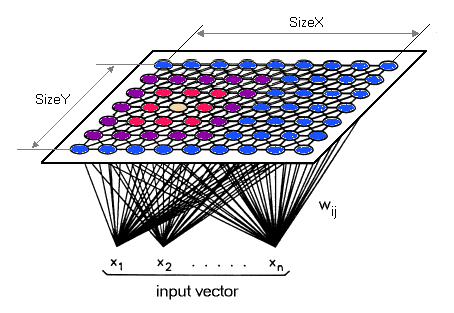

## Build the final dataset
Στη δεύτερη εφαρμογή θα βασιστούμε στις τοπολογικές ιδιότητες των Self Organizing Maps (SOM) για να φτιάξουμε ενά χάρτη (grid) δύο διαστάσεων όπου θα απεικονίζονται όλες οι ταινίες της συλλογής της ομάδας με τρόπο χωρικά συνεκτικό ως προς το περιεχόμενο και κυρίως το είδος τους (ο παραπάνω χάρτης είναι ενδεικτικός, δεν αντιστοιχεί στο dataset μας). 

Η `build_final_set` αρχικά μετατρέπει την αραιή αναπαράσταση tf-idf της εξόδου της `TfidfVectorizer()` σε πυκνή (η [αραιή αναπαράσταση](https://en.wikipedia.org/wiki/Sparse_matrix) έχει τιμές μόνο για τα μη μηδενικά στοιχεία). 

Στη συνέχεια ενώνει την πυκνή `dense_tf_idf` αναπαράσταση και τις binarized κατηγορίες `catbins` των ταινιών ως επιπλέον στήλες (χαρακτηριστικά). Συνεπώς, κάθε ταινία αναπαρίσταται στο Vector Space Model από τα χαρακτηριστικά του TFIDF και τις κατηγορίες της.

Τέλος, δέχεται ένα ορισμα για το πόσες ταινίες να επιστρέψει, με default τιμή όλες τις ταινίες (5000). Αυτό είναι χρήσιμο για να μπορείτε αν θέλετε να φτιάχνετε μικρότερα σύνολα δεδομένων ώστε να εκπαιδεύεται ταχύτερα το SOM.

In [ ]:
def build_final_set(doc_limit = 5000, tf_idf_only=False):
    # convert sparse tf_idf to dense tf_idf representation
    dense_tf_idf = corpus_tf_idf[0:doc_limit,:]
    if tf_idf_only:
        # use only tf_idf
        final_set = dense_tf_idf
    else:
        # append the binary categories features horizontaly to the (dense) tf_idf features
        final_set = np.hstack((dense_tf_idf, catbins[0:doc_limit,:]))
        # η somoclu θέλει δεδομένα σε float32
    return np.array(final_set, dtype=np.float32)

In [ ]:
final_set = build_final_set()

Τυπώνουμε τις διαστάσεις του τελικού dataset μας. Χωρίς βελτιστοποίηση του TFIDF θα έχουμε περίπου 50.000 χαρακτηριστικά.

In [ ]:
final_set.shape

(5000, 3802)

Με βάση την εμπειρία σας στην προετοιμασία των δεδομένων στην επιβλεπόμενη μάθηση, υπάρχει κάποιο βήμα προεπεξεργασίας που θα μπορούσε να εφαρμοστεί σε αυτό το dataset; 

Εφαρμόσαμε την τεχνική PCA για να επιτύχουμε περαιτέρω μείωση της διαστατικότητας. Αποφασίσαμε να κρατήσουμε το 98% τoυ variance των στοιχειων. Με αυτό τον τρόπο τα χαρακτηριστικά απο 3802 έφτασαν τα 2006

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 0.98)
pca_final = pca.fit_transform(final_set)
print(pca_final.shape)

(5000, 2006)


In [ ]:
joblib.dump(pca_final, 'pca_final.pkl')

['pca_final.pkl']

In [ ]:
joblib.dump(final_set, 'final_set.pkl')

['final_set.pkl']

## Creating all som maps

Θα δουλέψουμε με τη βιβλιοθήκη SOM ["Somoclu"](http://somoclu.readthedocs.io/en/stable/index.html). Εισάγουμε τις somoclu και matplotlib και λέμε στη matplotlib να τυπώνει εντός του notebook (κι όχι σε pop up window).

In [ ]:
# install somoclu
!pip install --upgrade somoclu
# import sompoclu, matplotlib
import somoclu
import matplotlib
# we will plot inside the notebook and not in separate window
%matplotlib inline

Requirement already up-to-date: somoclu in /usr/local/lib/python3.6/dist-packages (1.7.5.1)


In [ ]:
import numpy as np
import joblib

In [ ]:
n_rows, n_columns = 10, 10
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som.train(pca_final, epochs=100)

CPU times: user 5min 40s, sys: 609 ms, total: 5min 40s
Wall time: 2min 52s


In [ ]:
n_rows, n_columns = 20, 20
som_20 = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som_20.train(pca_final, epochs=100)

CPU times: user 30min 43s, sys: 2.83 s, total: 30min 46s
Wall time: 15min 49s


In [ ]:
n_rows, n_columns = 25, 25
som_25 = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som_25.train(pca_final, epochs=100)

CPU times: user 47min 44s, sys: 5.01 s, total: 47min 49s
Wall time: 24min 44s


In [ ]:
n_rows, n_columns = 30, 30
som_30 = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som_30.train(pca_final, epochs=100)

CPU times: user 1h 9min 56s, sys: 9.37 s, total: 1h 10min 5s
Wall time: 35min 52s


In [ ]:
joblib.dump(som, 'som_100.pkl')

['som_100.pkl']

In [ ]:
joblib.dump(som_20, 'som_20.pkl')

['som_20.pkl']

In [ ]:
joblib.dump(som_25, 'som_25.pkl')

['som_25.pkl']

In [ ]:
joblib.dump(som_30, 'som_30.pkl')

['som_30.pkl']

In [ ]:
som10 = joblib.load('som_100.pkl')

In [ ]:
som20 = joblib.load('som_20.pkl')

In [ ]:
som25 = joblib.load('som_25.pkl')

In [ ]:
som30 = joblib.load('som_30.pkl')

## Creating the functions to analyze the results

In [ ]:
def print_categories_stats(list_with_ids):
  total_categories = []
  for items in list_with_ids: #for each movie 
    categ = [category.strip().strip('""') for category in categories[items][0].split(',')] #get the categories
    total_categories.extend(categ)
  unique_cats, counts = np.unique(total_categories, return_counts=True) #find all unique categories and the count for each one
  sorted_counts = np.argsort(counts)[::-1] 

  final_result = [(unique_cats[i], counts[i]) for i in sorted_counts]  
  print(final_result)
  evaluation(final_result,len(list_with_ids)) #call the evaluation to mark the clusters
  return

In [ ]:
def print_cluster_neurons_movies_report(no_of_cluster):
  
  i, j = np.where(clusters == no_of_cluster) #coordinates
  stacked = np.column_stack((j, i)) #we stack them in the opposite way because of som.bmu
  index_neurons = [list(bmu) for bmu in stacked if bmu in ubmus]  
  
  return index_neurons

In [ ]:
def neurons_movies_report(neurons):

  idx_found = []
  for i in range(len(bmus)):   #bmus are calculated outside of this function
    for item in neurons:
      if (item[0] == bmus[i][0] and item[1] == bmus[i][1]):    #we compare the result returned from print_cluster_neurons_movies_report
        idx_found.append(i)                                    #with the bmus to find the right index
  print_categories_stats(idx_found)                            #for that index we print the stats

In [ ]:
def movies_count(neurons): #count the movies
  idx_found = []
  for i in range(len(bmus)):
    for item in neurons:
      if (item[0] == bmus[i][0] and item[1] == bmus[i][1]):
        idx_found.append(i) 
  return len(idx_found)

In [ ]:
def evaluation(final_result,total_movies):
 
  GREEN = '\033[92m'
  YELLOW = '\033[93m'
  VIOLET = '\33[95m'
  RED = '\033[91m'
  BLUE = '\033[94m'
  UNDERLINE = '\033[4m'
  END = '\033[0m'
  global scoring
  ############ criteria for marking the clusters ############ 
  if(final_result[0][1]>total_movies*0.90 and final_result[1][1]>=total_movies*0.70):
    scoring[0]+=1
    if(final_result[2][1]<=total_movies*0.70):  
      print(UNDERLINE+"Title:"+END +" " +GREEN + str(final_result[0][0]) +", " +str(final_result[1][0]) + END)
    else:
      print(UNDERLINE+"Title:"+END +" " +GREEN + str(final_result[0][0]) +", " +str(final_result[1][0]) +", " +str(final_result[2][0]) + END)
  elif(final_result[0][1]>total_movies*0.90 and final_result[1][1]<total_movies*0.20):
    scoring[1]+=1  
    print(UNDERLINE+"Title:"+END +" " +VIOLET + str(final_result[0][0])+ END)
  elif(final_result[0][1]>total_movies*0.70 and final_result[1][1]<total_movies*0.30):
    scoring[2]+=1  
    print(UNDERLINE+"Title:"+END +" " +BLUE + str(final_result[0][0])+ END) 
  elif(final_result[0][1]>total_movies*0.70 and final_result[1][1]>total_movies*0.44):
    scoring[3]+=1  
    print(UNDERLINE+"Title:"+END +" " +YELLOW + str(final_result[0][0])+ END)
  else:
    scoring[4]+=1  
    print(RED +"Bad Cluster" + END)
  return

In [ ]:
def cluster_analysis(clusters, n_clusters):    #prints the name of each cluster and the numbers of neuros each cluster has 
                                               #sorted from least neuros to most neurons
  print(clusters,'\n')
  print('Clusters sorted by increasing number of neurons\n')
  print('Cluster index')
  print('Number of neurons\n')

  report = np.zeros((2,n_clusters))
  report[0,:] = np.argsort([np.sum(clusters == no_of_clusters) for no_of_clusters in range(n_clusters)])
  report[1,:] = sorted([np.sum(clusters == no_of_clusters) for no_of_clusters in range(n_clusters)])
  print(report)

In [ ]:
def analysis(no_clusters): #main function for getting the results
  END = '\033[0m'
  CYAN = '\033[96m'
  BLUE = '\033[94m'
  GREEN = '\033[92m'
  YELLOW = '\033[93m'
  VIOLET = '\33[95m'
  RED = '\033[91m'
  UNDERLINE = '\033[4m'
  global  scoring 
  scoring=[0,0,0,0,0] #Green, Violet, Blue, Yellow, Red
  indexes = np.zeros((1,no_clusters))
  indexes = np.argsort([np.sum(clusters == no_of_clusters) for no_of_clusters in range(no_clusters)])[::-1] #get the index of the clusters sorted(most neuros -> to least neurons)
  for i in indexes:
    print(CYAN+'Cluster ' + str(i)+ ': (' + str(movies_count(print_cluster_neurons_movies_report(i))),'Total Movies)' +END)
    neurons_movies_report(print_cluster_neurons_movies_report(i))  #this functions call the chain of the functions we implemented
    print()
  print("------------------------------------------------------RESULTS------------------------------------------------------\n")
  print(GREEN+"Green Clusters: "+str(scoring[0])+END)
  print(VIOLET+"Violet Clusters: "+str(scoring[1])+END)
  print(BLUE+"Blue Clusters: "+str(scoring[2])+END)
  print(YELLOW+"Yellow Clusters: "+str(scoring[3])+END)
  print(RED+"Red Clusters: "+str(scoring[4])+END,"\n")
  print(UNDERLINE+"Scoring:"+END+" "+ str((scoring[0]+scoring[1]*0.75+scoring[2]*0.6+scoring[3]*0.4+scoring[4]*0)/no_clusters))  

##Κριτήρια αξιολόγησης

Η αξιολόγηση των clusters έχει υποκειμενικό χαρακτήρα και προκειμένου να μπορέσουμε να τα αξιολογήσουμε όσο πιο αντικειμενικά γίνεται, ως προς την ποιότητα τους, δημιουργήσαμε ορισμένα κριτήρια. Παρατηρώντας τα αποτελεσμάτα, και συγκρίνοντας τα μεταξύ τους καταλήξαμε σε μια κλίμακα 5 επιπέδων. Αυτή η κλίμακα υλοποιείται μέσω της συνάρτησης $evaluation$. 

**DISCLAIMER**: Αυτή η κλίμακα καθώς και το scoring που προκύπτει χρησιμοποιούνται σαν μια μαθηματική ένδειξη της ποιότητας και δεν είναι απόλυτα. Για την τελική αξιολόγηση ανατρέξαμε ξεχωριστά σε κάθε cluster και σε κάποιες περιπτώσεις που κρίναμε απαραίτητο δώσαμε βαρύτητα στην δική μας αξιολόγηση έναντι της $evaluation$. 


Ο διαχωρισμός σε στάδια στην $evaluation$ πραγματοποιείται ως εξής:

* Θεωρήσαμε σημαντικό τον συνολικό αριθμό των ταινιών κάθε cluster καθώς μερικές κατηγορίες επικαλύπτονται και είναι χρήσιμο να γνωρίζουμε το ποσοστό της κάθε κατηγορίας για την αξιολόγηση.  
* Αν οι περισσότερες ταινίες ανήκουν σε κάποια πολύ γενική κατηγορία (π.χ. Drama) και ταυτόχρονα οι δευτερέυουσες κατηγορίες είναι σημαντικά μικρότερες σε νούμερο δίνεται μια βαθμολογική "ποινή" στο cluster.
* Όσο μικρότερο ποσοστό από τις συνολικές ταινίες καταλαμβάνεται από τις επικρατούσες κατηγορίες τόσο αυξάνεται η βαθμολογική "ποινή".
* Χωρίσαμε τα στάδια αξιολόγησης χρωματικά και η σειρά τους από το καλύτερο προς το χειρότερο είναι: Πράσινο, Βιολετί, Μπλε, Κίτρινο, Κόκκινο.
* Για το scoring δώσαμε σε καθένα από τα επίπεδα έναν συντελεστή βαρύτητας για να βγάλουμε ένα τελικό αποτέλεσμα ανάμεσα στο 0 και το 1.
* Σαν ετικέτα του cluster χρησιμοποιείται η/οι επικρατούσα/επικρατούσες κατηγορίες (Title). 

Για την τελική αξιολόγηση χρησιμοποιήσαμε επιπλέον τα εξής κριτήρια: 
 * Υπάρχει συνάφεια στις κατηγορίες που περιέχουν την πλειοψηφία των ταινιών.
 * Στον χάρτη SOM υπάρχει απόσταση στις εννοιολογικά απόμακρες κατηγορίες (π.χ. comedy και horror).
 * Για κάθε SOM επιλέξαμε το καλύτερο K και στη συνέχεια συγκρίναμε τα καλύτερα αποτελέσματα για όλους τους SOM.
 * Με όλα τα παραπάνω καταλήμαμε σε ενα χάρτη SOM με ένα Κ στον οποίο θα παρουσιάσουμε την ανάλυση με περισσότερες λεπτομέριες. 

##Παρουσίαση αποτελεσμάτων

Για κάθε K του KMeans χρησιμοποιούμε την συνάρτηση $analysis$ η οποία παρουσιάζει τα αποτελέσματα με τον εξής τρόπο: 

* Ταξινομεί με φθίνουσα σειρά αριθμού νευρώνων και τυπώνει τα clusters. 
* Τυπώνει τον συνολικό αριθμό ταινών κάθε cluster.
* Ταξινομεί τις κατηγορίες ταινιών με βάση των αριθμό της καθεμιάς (πιο επικρατης προς λιγότερο επικρατης) και τα τυπώνει για κάθε cluster.
* Καλεί την evaluation για κάθε cluster για να δοθεί ο τίτλος και η αξιολόγηση.
* Για το συγκεκριμένο K τυπώνει τον συνολικό αριθμό clusters που ταξινομήθηκε σε καθένα απο τα επίπεδα αξιολόγησης καθώς και το scoring.   

## SOM 10x10


### BMUs

Μετά από κάθε εκπαίδευση αποθηκεύστε σε μια μεταβλητή τα best matching units (bmus) για κάθε ταινία. Τα bmus μας δείχνουν σε ποιο νευρώνα ανήκει η κάθε ταινία. Προσοχή: η σύμβαση των συντεταγμένων των νευρώνων είναι (στήλη, γραμμή) δηλαδή το ανάποδο από την Python. Με χρήση της [np.unique](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.unique.html) (μια πολύ χρήσιμη συνάρτηση στην άσκηση) αποθηκεύστε τα μοναδικά best matching units και τους δείκτες τους (indices) προς τις ταινίες. Σημειώστε ότι μπορεί να έχετε λιγότερα μοναδικά bmus από αριθμό νευρώνων γιατί μπορεί σε κάποιους νευρώνες να μην έχουν ανατεθεί ταινίες. Ως αριθμό νευρώνα θα θεωρήσουμε τον αριθμό γραμμής στον πίνακα μοναδικών bmus.


In [ ]:
bmus = som10.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[0 2]
 [2 8]
 [2 9]
 ...
 [2 0]
 [9 0]
 [4 8]]


In [ ]:
np.set_printoptions(threshold=50)
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(95, 2)
[[0 0]
 [0 1]
 [0 2]
 ...
 [9 7]
 [9 8]
 [9 9]]


In [ ]:
np.set_printoptions(threshold=50)
print(indices.shape)
print(indices)


(5000,)
[ 2 28 29 ... 20 86 47]



### Clustering

Τυπικά, η ομαδοποίηση σε ένα χάρτη SOM προκύπτει από το unified distance matrix (U-matrix): για κάθε κόμβο υπολογίζεται η μέση απόστασή του από τους γειτονικούς κόμβους. Εάν χρησιμοποιηθεί μπλε χρώμα στις περιοχές του χάρτη όπου η τιμή αυτή είναι χαμηλή (μικρή απόσταση) και κόκκινο εκεί που η τιμή είναι υψηλή (μεγάλη απόσταση), τότε μπορούμε να πούμε ότι οι μπλε περιοχές αποτελούν clusters και οι κόκκινες αποτελούν σύνορα μεταξύ clusters.

To somoclu δίνει την επιπρόσθετη δυνατότητα να κάνουμε ομαδοποίηση των νευρώνων χρησιμοποιώντας οποιονδήποτε αλγόριθμο ομαδοποίησης του scikit-learn. Στην άσκηση θα χρησιμοποιήσουμε τον k-Means. Για τον αρχικό σας χάρτη δοκιμάστε ένα k=20 ή 25. Οι δύο προσεγγίσεις ομαδοποίησης είναι διαφορετικές, οπότε περιμένουμε τα αποτελέσματα να είναι κοντά αλλά όχι τα ίδια.


#### K = 10 optimization

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 10)
som10.cluster(algorithm = kmeans)


##### UMatrix plot

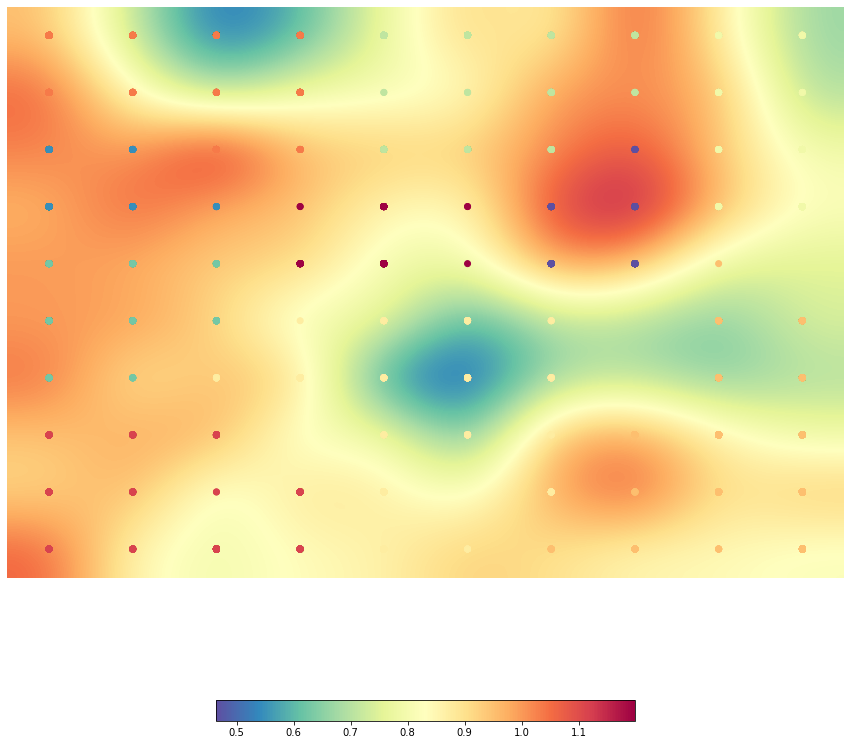

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 10)

[[7 7 7 7 3 3 3 3 4 4]
 [7 7 7 7 3 3 3 3 4 4]
 [1 1 7 7 3 3 3 0 4 4]
 [1 1 1 9 9 9 0 0 4 4]
 [2 2 2 9 9 9 0 0 6 6]
 [2 2 2 5 5 5 5 6 6 6]
 [2 2 5 5 5 5 5 6 6 6]
 [8 8 8 5 5 5 5 6 6 6]
 [8 8 8 8 5 5 5 6 6 6]
 [8 8 8 8 5 5 6 6 6 6]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 0.  1.  9.  2.  4.  7.  3.  8.  5.  6.]
 [ 5.  5.  6.  8.  8. 10. 11. 11. 18. 18.]]


In [ ]:
analysis(10)

Cluster 6: (1118 Total Movies)
[('Horror', 263), ('Short Film', 220), ('Animation', 161), ('Documentary', 127), ('Science Fiction', 125), ('Comedy film', 124), ('Family Film', 122), ('Adventure', 98), ('Japanese Movies', 69), ('Fantasy', 67), ('Silent film', 55), ('World cinema', 50), ('Slasher', 49), ('Indie', 49), ('Western', 46), ('Cult', 39), ('Action/Adventure', 38), ("Children's/Family", 30), ('Creature Film', 29), ('Black-and-white', 28), ('War film', 28), ('B-movie', 27), ('Mystery', 25), ('Chinese Movies', 25), ('Supernatural', 23), ('Biography', 20), ('Culture & Society', 20), ('Zombie Film', 18), ('Anime', 17), ('Teen', 16), ("Children's Fantasy", 15), ('Fantasy Adventure', 15), ('Musical', 15), ('Television movie', 14), ('Romantic comedy', 14), ('Comedy', 13), ("Children's", 13), ('Black comedy', 13), ('Music', 12), ('Crime Fiction', 11), ('Animated cartoon', 11), ('Monster', 11), ('Monster movie', 11), ('Psychological thriller', 11), ('Action', 11), ('Sci-Fi Horror', 10), 

#### K = 15 optimization

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 15)
som10.cluster(algorithm = kmeans)


##### UMatrix plot

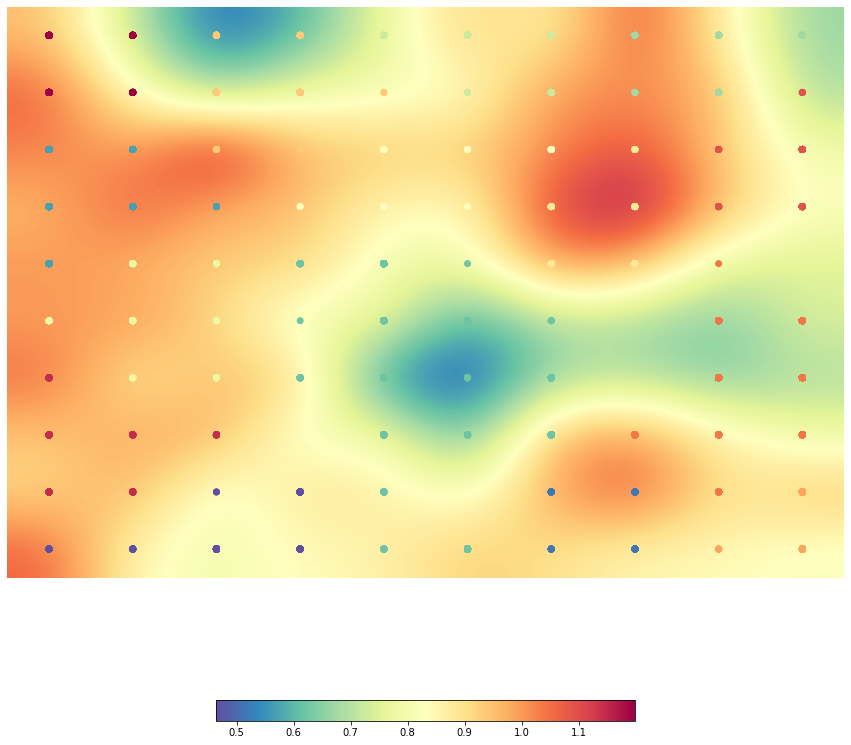

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 15)

[[14 14  9  9  5  5  5  4  4  4]
 [14 14  9  9  9  5  5  4  4 12]
 [ 2  2  9  9  7  7  7  8 12 12]
 [ 2  2  2  7  7  7  8  8 12 12]
 [ 2  6  6  3  3  3  8  8 11 11]
 [ 6  6  6  3  3  3  3 11 11 11]
 [13  6  6  3  3  3  3 11 11 11]
 [13 13 13  3  3  3  3 11 11 11]
 [13 13  0  0  3  3  1  1 11 10]
 [ 0  0  0  0  3  3  1  1 10 10]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[10.  1. 14.  4.  5.  8. 12.  0.  2.  7. 13.  6.  9. 11.  3.]
 [ 3.  4.  4.  5.  5.  5.  5.  6.  6.  6.  6.  7.  7. 12. 19.]]


In [ ]:
analysis(15)

Cluster 3: (1053 Total Movies)
[('Drama', 1005), ('World cinema', 163), ('Black-and-white', 160), ('Indie', 99), ('War film', 77), ('Adventure', 66), ('Family Drama', 63), ('Family Film', 57), ('Action/Adventure', 50), ('Period piece', 50), ('Silent film', 49), ('Biographical film', 43), ('Television movie', 32), ('Political drama', 32), ('Western', 32), ('Biopic [feature]', 32), ('Melodrama', 32), ('Comedy film', 30), ('Thriller', 29), ('Art film', 28), ('Docudrama', 27), ('Crime Fiction', 27), ('Fantasy', 27), ('Coming of age', 27), ('Biography', 24), ('Chinese Movies', 24), ('Film adaptation', 22), ('Sports', 21), ('Historical fiction', 20), ('Science Fiction', 19), ('History', 19), ('Japanese Movies', 18), ('Romantic drama', 15), ('Comedy-drama', 15), ('Romance Film', 14), ('Documentary', 14), ('Mystery', 14), ('Courtroom Drama', 13), ('Horror', 12), ('Comedy', 12), ("Children's/Family", 11), ('Action', 11), ('Costume drama', 11), ('Childhood Drama', 10), ('Ensemble Film', 10), ('B

#### K = 20 optimization

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 20)
som10.cluster(algorithm = kmeans)


##### UMatrix plot

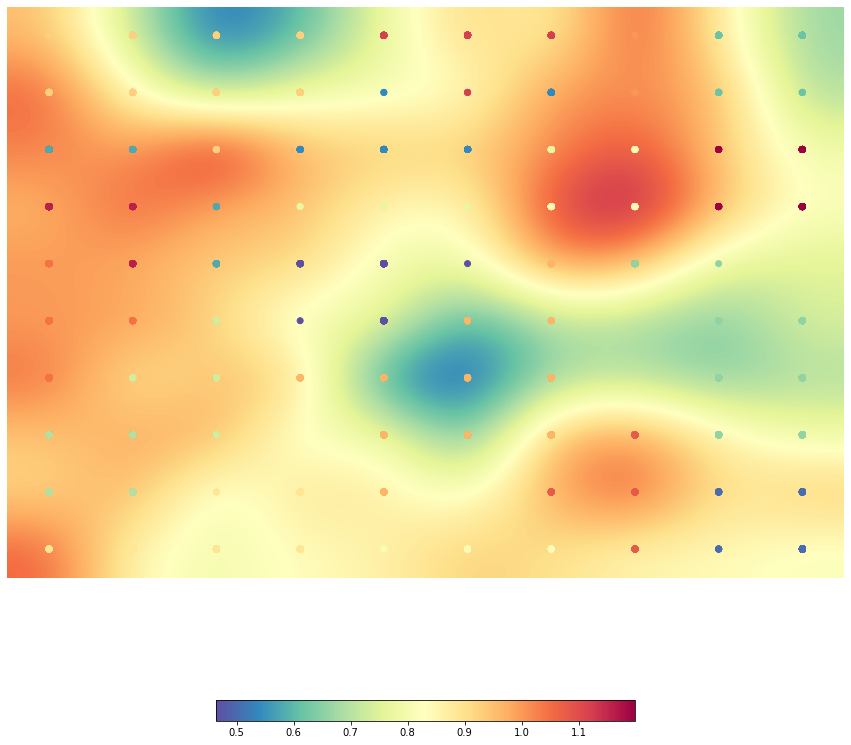

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 20)

[[12 12 12 12 17 17 17 14  4  4]
 [12 12 12 12  2 17  2 14  4  4]
 [ 3  3 12  2  2  2  8 10 19 19]
 [18 18  3  8  8  8 10 10 19 19]
 [15 18  3  0  0  0 13  5  5  5]
 [15 15  7  0  0 13 13  5  5  5]
 [15  7  7 13 13 13 13  5  5  5]
 [ 6  6  7 13 13 13 13 16  5  5]
 [ 6  6 11 11 13  9 16 16  1  1]
 [11 11 11 11  9  9  9 16  1  1]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[14. 10. 18.  9. 17. 16. 15.  8. 19.  6.  4.  3.  1.  7.  2.  0. 11. 12.
   5. 13.]
 [ 2.  3.  3.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  5.  5.  6.  9.
  11. 12.]]


In [ ]:
analysis(20)

Cluster 13: (732 Total Movies)
[('Drama', 732), ('Family Film', 58), ('War film', 54), ('Family Drama', 44), ('Adventure', 44), ('Biographical film', 42), ('Musical', 38), ('Period piece', 38), ('Television movie', 31), ('Biopic [feature]', 30), ('Comedy film', 29), ('Action/Adventure', 23), ('Biography', 23), ('Docudrama', 22), ('Political drama', 21), ('Fantasy', 19), ('Melodrama', 19), ('Historical fiction', 17), ('History', 17), ('Sports', 16), ('Western', 15), ('Science Fiction', 14), ('Film adaptation', 14), ('Coming of age', 13), ('Documentary', 12), ('Mystery', 12), ('Courtroom Drama', 11), ("Children's/Family", 11), ('Romantic drama', 9), ('Japanese Movies', 8), ('Comedy-drama', 8), ('Chinese Movies', 8), ('Costume drama', 7), ('Christian film', 7), ('Epic', 7), ('Musical Drama', 7), ('Art film', 7), ('Childhood Drama', 7), ('Music', 6), ('Horror', 6), ('Crime Fiction', 6), ('Comedy', 6), ('Disaster', 6), ('World cinema', 5), ('Road movie', 5), ('Indie', 5), ('Social problem f

#### K = 25 optimization

In [ ]:
kmeans = KMeans(n_clusters = 25)
som10.cluster(algorithm = kmeans)

##### UMatrix plot

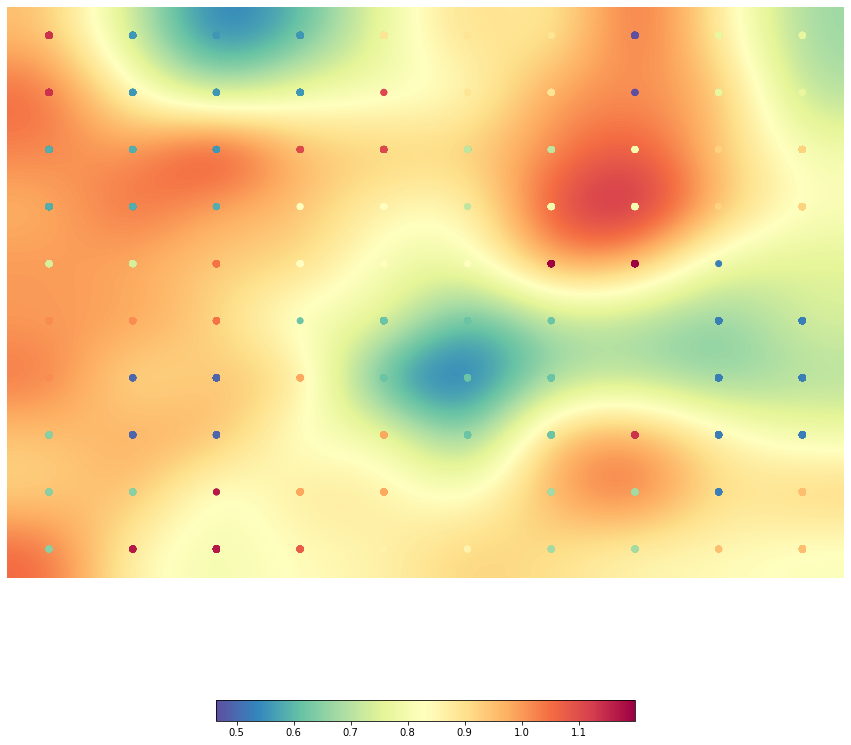

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 25)

[[22  3  3  3 14 14 14  0 10 10]
 [22  3  3  3 21 14 14  0 10 10]
 [ 4  4  3 21 21  8  8 11 15 15]
 [ 4  4  4 12 12  8 11 11 15 15]
 [ 9  9 19 12 12 12 24 24  2  2]
 [18 18 19  5  5  5  5  2  2  2]
 [18  1  1 17  5  5  5  2  2  2]
 [ 6  1  1 17 17  5  5 22  2  2]
 [ 6  6 23 17 17 13  7  7  2 16]
 [ 6 23 23 20 13 13  7  7 16 16]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[20.  0. 19.  9. 24.  8. 22. 11. 23. 13. 21. 16. 18.  6.  7. 10. 15.  1.
  14. 12. 17.  4.  3.  5.  2.]
 [ 1.  2.  2.  2.  2.  3.  3.  3.  3.  3.  3.  3.  3.  4.  4.  4.  4.  4.
   5.  5.  5.  5.  7.  9. 11.]]


In [ ]:
analysis(25)

Cluster 2: (593 Total Movies)
[('Documentary', 123), ('Comedy film', 64), ('Science Fiction', 58), ('Adventure', 57), ('Japanese Movies', 57), ('Silent film', 42), ('Western', 41), ('Fantasy', 40), ('Action/Adventure', 33), ('Animation', 31), ('War film', 26), ('World cinema', 24), ('Chinese Movies', 21), ('Biography', 20), ('Culture & Society', 19), ('Indie', 18), ('Short Film', 17), ("Children's/Family", 17), ('Anime', 15), ('Romantic comedy', 14), ('Biographical film', 10), ('Mystery', 10), ('Black comedy', 9), ("Children's Fantasy", 9), ('Comedy-drama', 9), ('Fantasy Adventure', 9), ('Bollywood', 8), ('Music', 8), ('Social issues', 7), ('Filipino Movies', 7), ('Crime Fiction', 7), ('Television movie', 7), ('History', 6), ('Historical drama', 6), ('Costume drama', 6), ('Film noir', 6), ('Historical fiction', 6), ('Political cinema', 6), ('Black-and-white', 6), ('Sports', 5), ('Martial Arts Film', 5), ('Cult', 5), ('Wuxia', 4), ('Disaster', 4), ('Horror', 4), ('Language & Literature'

###Best K=20

Μετά από εξέταση των αποτελεσμάτων της συνάρτησης $analysis$ και επαληθεύοντας τα εννοιολογικά, παρατηρούμε ότι το K=20 μας δίνει την βέλτιστη συσταδοποίηση όσον αφορά τον χάρτη SOM 10x10 γιατί:
* Για μικρότερα Κ δεν γίνεται ικανοποιητικός διαχωρισμός των κατηγοριών.
* Για μεγαλύτερα Κ χωρίζονται κατηγορίες που ίσως να μην έπρεπε να χωρίζονται (Drama, Romance film).



## SOM 20x20

### BMUs

In [ ]:
bmus = som20.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 15]
 [ 7  8]
 [ 9  7]
 ...
 [ 6  0]
 [19  2]
 [ 9 12]]


In [ ]:
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(333, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [19 17]
 [19 18]
 [19 19]]


In [ ]:
print(indices.shape)
print(indices)

(5000,)
[229 133 160 ... 110 315 163]


### Clustering

#### K = 20 optimization

In [ ]:
kmeans = KMeans(n_clusters = 20)
som20.cluster(algorithm = kmeans)

##### UMatrix plot

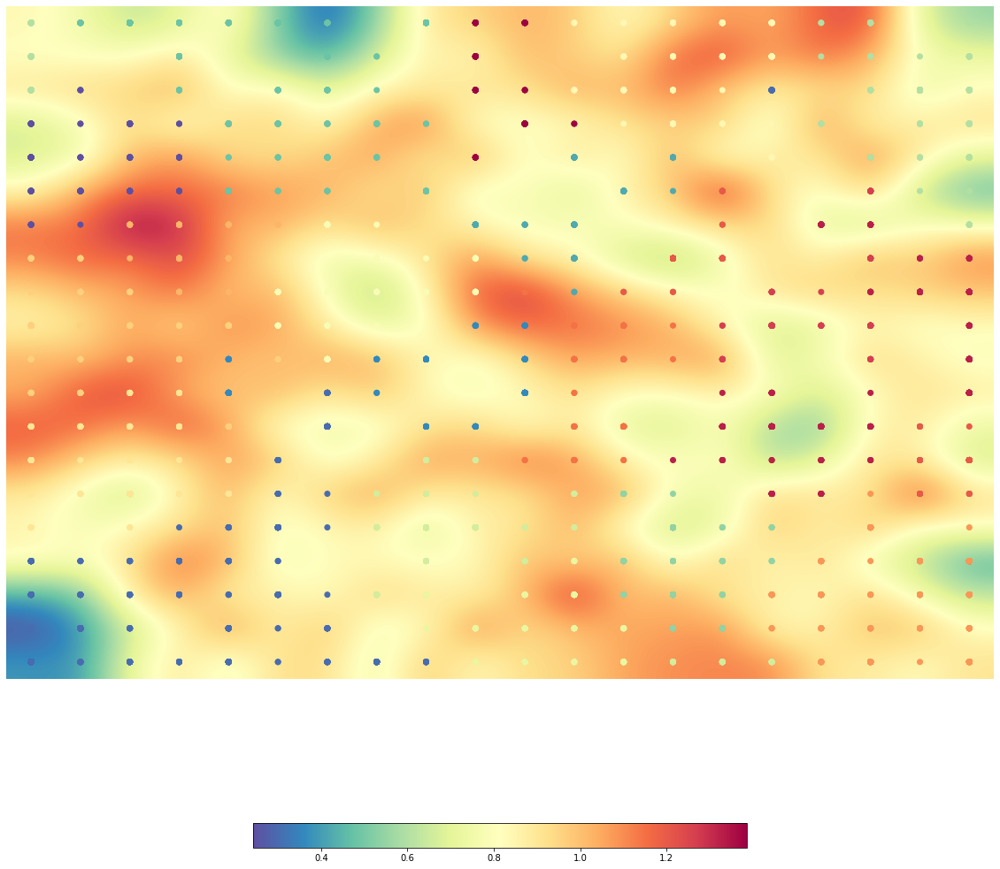

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 20)

[[ 6  4  4  4  4  4  4  4  4 19 19 10 10 10 10 10  6  6  6  6]
 [ 6  4  4  4  4  4  4  4 19 19 19 10 10 10 10 10  6  6  6  6]
 [ 6  0  0  4  4  4  4  4 19 19 19 10 10 10 10  1  1  6  6  6]
 [ 0  0  0  0  4  4  4  4  4 19 19 19 10 10 10 10  6  6  6  6]
 [ 0  0  0  0  4  4  4  4  4 19 19  3  3  3 10 10 17  6  6  6]
 [ 0  0  0  0  4  4  4  4  4  3  3  3  3  3 16 18 17 17  6  6]
 [ 0  0 13 13 13 13  9  9  3  3  3  3  3 16 16 18 18 18  6  6]
 [12 12 13 13 13 13  9  9  9  9  3  3 16 16 16 16 18 17 18 18]
 [12 12 12 13 13  9  9  9  9  9 15  3 16 16 16 17 17 18 18 18]
 [12 12 12 12 12  9  9  9  2  2  2 15 15 15 17 17 17 17 18 18]
 [12 12 12 12  2 12  9  2  2  2  2 15 15 15 17 17 17 17 18 18]
 [12 12 11 11  2 12  1  2  2  2  2 15 15 15 18 18 18 18 18 18]
 [11 11 11 11 12  1  1  1  2  2  2 15 15 18 18 18 18 18 16 16]
 [11 11 11 11 11  1  1  7  7  7 15 15 15 18 18 18 18 18 16 16]
 [11 11 11 11 11  1  1  7  7  7  7  7  5  5 18 18 18 14 16 16]
 [11 11 11  1  1  1  1  7  7  7  7  7  5  5  5  5 14 14

In [ ]:
analysis(20)

Cluster 1: (962 Total Movies)
[('Drama', 953), ('Black-and-white', 115), ('Crime Fiction', 115), ('Indie', 97), ('Action', 69), ('War film', 69), ('Biographical film', 42), ('Period piece', 40), ('Silent film', 39), ('Melodrama', 37), ('Musical', 37), ('Comedy film', 36), ('Family Film', 31), ('Biopic [feature]', 29), ('Family Drama', 28), ('Television movie', 27), ('Docudrama', 26), ('Political drama', 24), ('Biography', 24), ('Crime Drama', 23), ('Mystery', 23), ('Film adaptation', 19), ('Short Film', 19), ('Sports', 18), ('Coming of age', 17), ('Romance Film', 17), ('History', 15), ('Film noir', 15), ('Historical fiction', 13), ('Gangster Film', 13), ('Courtroom Drama', 13), ('Documentary', 13), ('Comedy-drama', 12), ('Fantasy', 12), ('Adventure', 12), ('World cinema', 12), ('Art film', 11), ('Ensemble Film', 11), ('Japanese Movies', 10), ('Horror', 10), ('Musical Drama', 10), ('Chinese Movies', 9), ('Teen', 9), ('Western', 8), ('Comedy', 8), ('Music', 7), ('Combat Films', 6), ('Cos

#### K = 25 optimization

In [ ]:
kmeans = KMeans(n_clusters = 25)
som20.cluster(algorithm = kmeans)

##### UMatrix plot

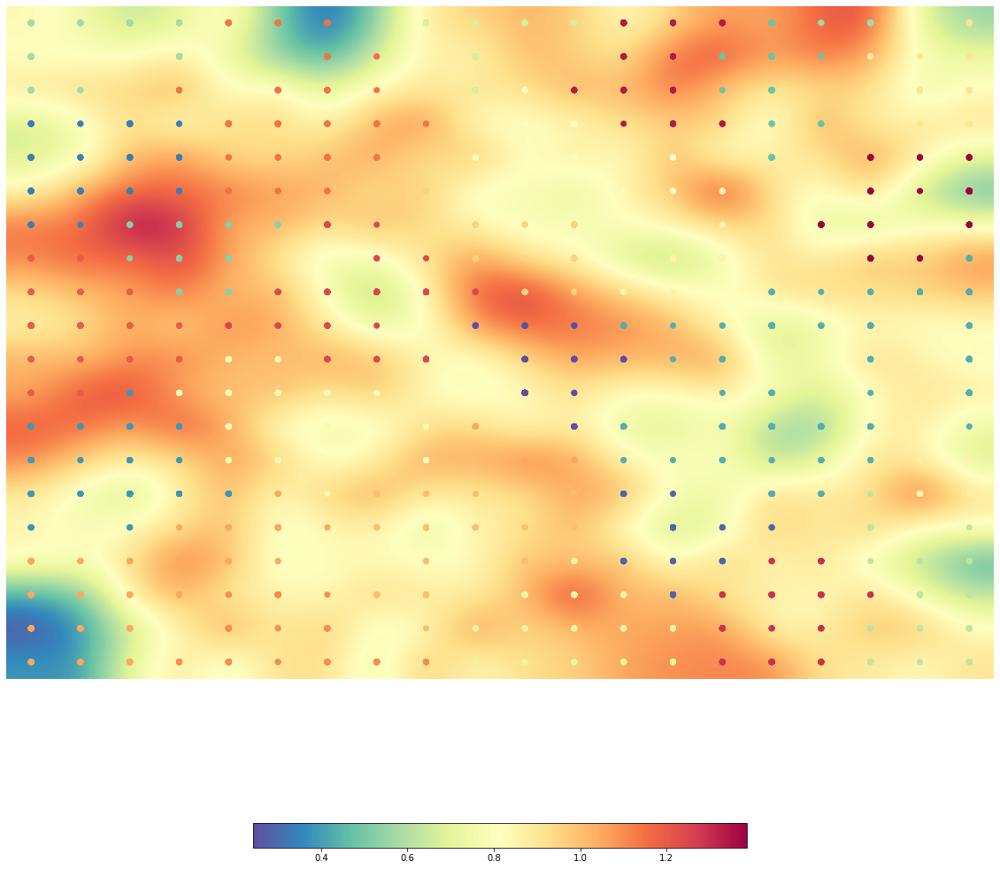

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 25)

[[ 7  7  7  7 19 19 19 19  9  9  9  9 23 23 23  5  7  7 14 14]
 [ 7  7  7  7 19 19 19 19  9  9  9 23 23 23  5  5  5 14 14 14]
 [ 7  7  2 19 19 19 19 19  9  9 12 23 23 23  5  5  5 14 14 14]
 [ 2  2  2  2 19 19 19 19 19 12 12 12 23 23 23  5  5 14 14 14]
 [ 2  2  2  2 19 19 19 19 19 12 12 12 12 12  5  5  5 24 24 24]
 [ 2  2  2  2 19 19 19 19 15 15 15 12 12 12 13  5 24 24 24 24]
 [ 2  2  6  6  6  6 21 21 15 15 15 15 12 13 13 24 24 24 24 24]
 [20 20  6  6  6  6 21 21 21 15 15 15 13 13 13 13 24 24 24  4]
 [20 20 20  6  6 21 21 21 21 21 15 15 13 13 13  4  4  4  4  4]
 [20 20 20 20 21 21 21 21 21  0  0  0  4  4  4  4  4  4  4  4]
 [20 20 20 20 11 11 21 21 21  0  0  0  0  4  4  4  4  4  4  4]
 [20 20  3 11 11 11 11 11 11  0  0  0  4  4  4  4  4  4  4  4]
 [ 3  3  3  3 11 11 11 11 11 17  0  0  4  4  4  4  4  4 13  4]
 [ 3  3  3  3 11 11 11 11 11 16 17 17  4  4  4  4  4  4 13 13]
 [ 3  3  3  3  3 17 11 16 16 16 16 16  1  1  4  4  4  8 13 13]
 [ 3  3  3 17 17 17 17 16 16 16 16 16  1  1  1  1  8  8

In [ ]:
analysis(25)

Cluster 4: (482 Total Movies)
[('Comedy film', 77), ('Silent film', 53), ('Japanese Movies', 52), ('Black-and-white', 52), ('Western', 49), ('Musical', 41), ('Science Fiction', 35), ('Action/Adventure', 26), ('Chinese Movies', 21), ('War film', 20), ('Crime Fiction', 18), ('Fantasy', 15), ('Romantic comedy', 14), ('Indie', 14), ("Children's/Family", 13), ('Anime', 10), ('Biographical film', 10), ('Mystery', 10), ('World cinema', 10), ('Bollywood', 10), ('Film noir', 9), ('Short Film', 9), ("Children's Fantasy", 9), ('Black comedy', 8), ('Comedy-drama', 8), ('Music', 6), ('Drama', 6), ('Filipino Movies', 6), ('Historical drama', 6), ('Martial Arts Film', 5), ('Historical fiction', 4), ('Psychological thriller', 4), ('Adventure', 4), ('Television movie', 4), ('Biography', 4), ('Wuxia', 4), ('Spaghetti Western', 3), ('Holiday Film', 3), ('Biopic [feature]', 3), ('Costume drama', 3), ('History', 3), ('Disaster', 3), ('Cult', 3), ('Revisionist Western', 3), ('Pre-Code', 3), ("Children's", 2

#### K = 30 optimization

In [ ]:
kmeans = KMeans(n_clusters = 30)
som20.cluster(algorithm = kmeans)

##### UMatrix plot

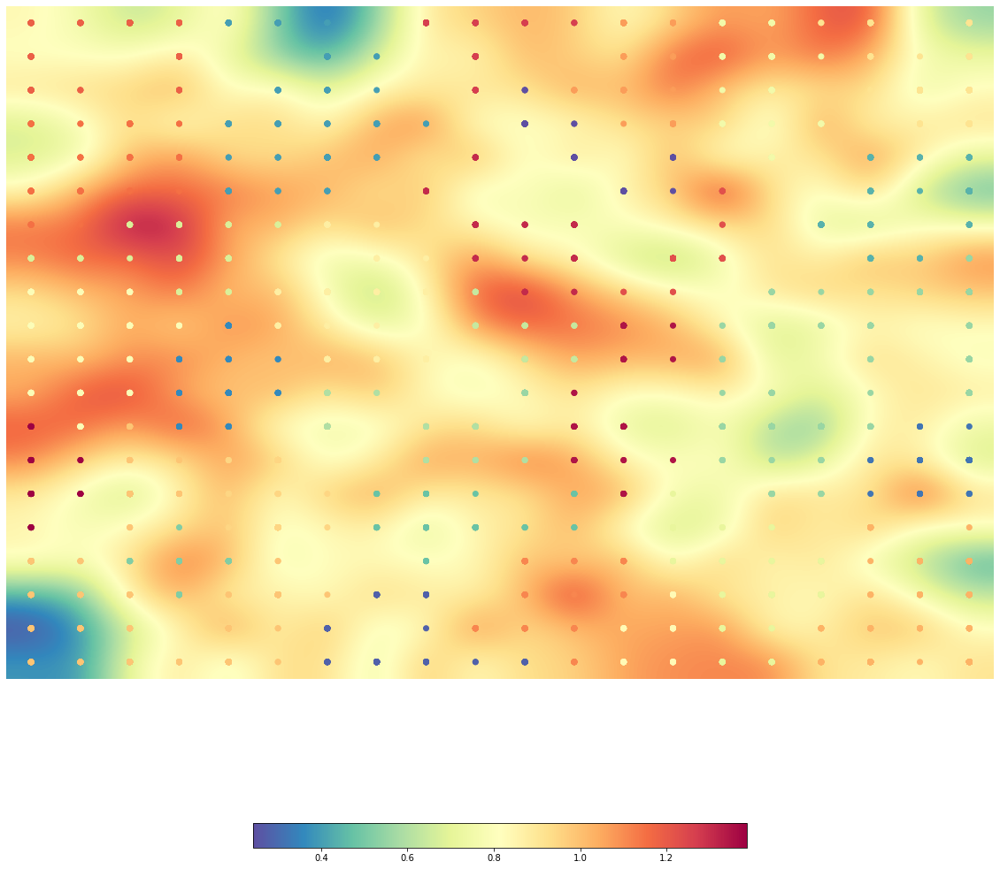

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 30)

[[24 24 24 24  4  4  4  4 26 26 26 26 21 21 13 13 17 17 17 17]
 [24 24 24 24 24  4  4  4 26 26 26 21 21 21 13 13 13 17 17 17]
 [24 24 23 24  4  4  4  4 26 26  0 21 21 21 13 13 13 17 17 17]
 [23 23 23 23  4  4  4  4  4  0  0  0 21 21 13 13 13 17 17 17]
 [23 23 23 23  4  4  4  4  4 27  0  0  0  0 13 13 13  5  5  5]
 [23 23 23 23  4  4  4  4 27 27 27  0  0  0 25 13  5  5  5  5]
 [23 23 11 11 11 11 16 16 27 27 27 27  0 25 25  5  5  5  5  5]
 [11 11 11 11 11 11 16 16 16 27 27 27 25 25 25 25  5  5  5  8]
 [14 14 14 11 11 16 16 16 16 10 27 27 25 25 25  8  8  8  8  8]
 [14 14 14 14  3 16 16 16 16 10 10 10 28 28  8  8  8  8  8  8]
 [14 14 14  3  3  3 16 16 16 10 10 10 28 28  8  8  8  8  8  8]
 [14 14 14  3  3  3  9  9  9  9  8 28 28 28  8  8  8  8  8  8]
 [29 14 19  3  3  9  9  9  9  9  9 28 28 28  8  8  8  8  2  2]
 [29 29 19 19 18 18  9  9  9  9  9 28 28 28  8  8  8  2  2  2]
 [29 29 19 19 18 18 18  6  6  6  6  6 28 12  8  8  8  2  2  2]
 [29 29 19  7 18 18 18  6  6  6  6  6 12 12 12 12 20 20

In [ ]:
analysis(30)

Cluster 8: (464 Total Movies)
[('Comedy film', 75), ('Black-and-white', 54), ('Silent film', 53), ('Western', 50), ('Japanese Movies', 49), ('Musical', 39), ('Adventure', 35), ('Action/Adventure', 28), ('War film', 21), ('Chinese Movies', 21), ('Crime Fiction', 18), ('Romantic comedy', 13), ('Indie', 11), ('Biographical film', 10), ('Bollywood', 10), ('Mystery', 9), ('Film noir', 9), ('Short Film', 9), ("Children's/Family", 9), ('Comedy-drama', 8), ('Anime', 8), ('Black comedy', 7), ('World cinema', 7), ('Music', 6), ('Drama', 6), ('Historical drama', 6), ('Filipino Movies', 6), ('Costume Adventure', 5), ('Martial Arts Film', 5), ('Historical fiction', 5), ('Wuxia', 4), ('Costume drama', 4), ("Children's Fantasy", 4), ('Psychological thriller', 4), ('Period piece', 4), ('Biopic [feature]', 3), ('Science Fiction', 3), ('Spaghetti Western', 3), ('Revisionist Western', 3), ('Swashbuckler films', 3), ('Television movie', 3), ('Holiday Film', 3), ('History', 3), ('Pre-Code', 3), ('Chase Mov

#### K = 35 optimization

In [ ]:
kmeans = KMeans(n_clusters = 35)
som20.cluster(algorithm = kmeans)

##### UMatrix plot

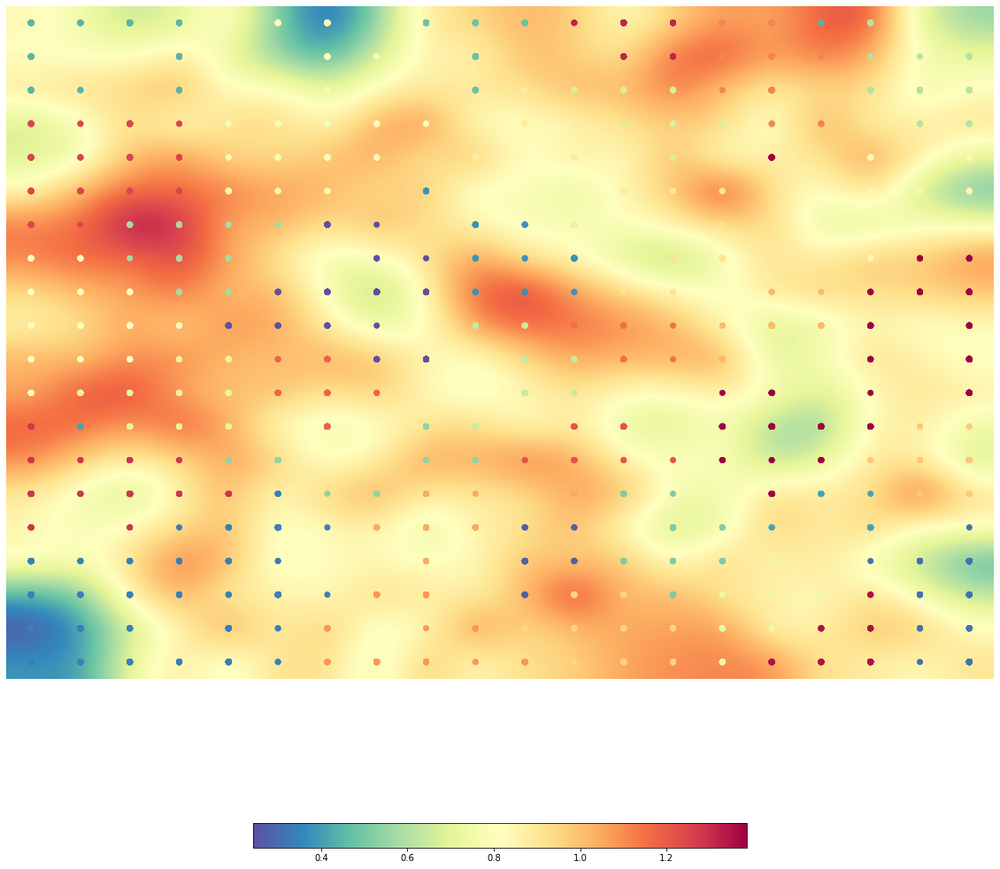

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 35)

[[ 6  6  6  6 16 16 16 16  7  7  7 32 32 32 26 26  6 11 11 11]
 [ 6  6  6  6  6 16 16 16  7  7  7 32 32 32 26 26 26 11 11 11]
 [ 6  6 30  6 16 16 16 16  7  7 19 13 13 13 26 26 26 11 11 11]
 [30 30 30 30 16 16 16 16 16 19 19 19 13 13 13 26 26 11 11 11]
 [30 30 30 30 16 16 16 16 16 19 19 19 19 13 13 34 26 18 18 18]
 [30 30 30 30 16 16 16 16  4  4  4 19 19 19 20 34 18 18 18 18]
 [30 30 10 10 10 10  0  0  4  4  4 19 19 20 20 18 18 18 18 18]
 [17 17 10 10 10 10  0  0  0  4  4  4 20 20 20 20 18 18 34 34]
 [17 17 17 10 10  0  0  0  0  4  4  4 20 20 20 23 23 34 34 34]
 [17 17 17 17  0  0  0  0  0 12 12 27 27 27 23 23 23 34 34 34]
 [17 17 17 14 14 28 28  0  0 12 12 12 27 27 23 23 23 34 34 34]
 [17 14 14 14 14 28 28 28  0 12 12 12 29 29 34 34 34 34 34 34]
 [31  5 14 14 14 28 28 28  9 12 12 29 29 29 34 34 34 34 22 22]
 [31 31 31 31  9  9 28  9  9  9 29 29 29 29 34 34 34 22 22 22]
 [31 31 31 31 31  3  9  9 24 24 24 24  8  8 34 34  5  5 22 22]
 [31 31 31  3  3  3  3 24 24 24  1  1  8  8  8  5  5  5

In [ ]:
analysis(35)

Cluster 3: (775 Total Movies)
[('Drama', 774), ('Black-and-white', 97), ('Indie', 81), ('War film', 55), ('Biographical film', 41), ('Silent film', 37), ('Period piece', 33), ('Melodrama', 32), ('Musical', 30), ('Comedy film', 29), ('Biopic [feature]', 27), ('Family Drama', 27), ('Television movie', 23), ('Biography', 22), ('Political drama', 22), ('Docudrama', 20), ('Short Film', 16), ('Documentary', 13), ('Coming of age', 13), ('Comedy-drama', 12), ('Sports', 12), ('Fantasy', 12), ('History', 12), ('Historical fiction', 12), ('Film adaptation', 12), ('Romance Film', 11), ('Courtroom Drama', 9), ('Ensemble Film', 9), ('Adventure', 8), ('Mystery', 8), ('Japanese Movies', 8), ('Musical Drama', 8), ('Art film', 8), ('Chinese Movies', 8), ('World cinema', 7), ('Comedy', 7), ('Music', 6), ('Western', 6), ('Horror', 6), ('Costume drama', 6), ('Christian film', 6), ('Crime Fiction', 5), ('Social problem film', 5), ('Road movie', 5), ('Addiction Drama', 5), ('Crime Drama', 5), ('Epic', 4), ('

###Best K=30

Μετά από εξέταση των αποτελεσμάτων της συνάρτησης $analysis$ και επαληθεύοντας τα εννοιολογικά, παρατηρούμε ότι το K=30 μας δίνει την βέλτιστη συσταδοποίηση όσον αφορά τον χάρτη SOM 20x20 γιατί:
* Για μικρότερα Κ η ποιότητα των clusters δεν ήταν ικανοποιητική είχαμε 2 και 5 Red Clusters αντίστοιχα για K=20 και K=25. 
* Για μεγαλύτερα Κ χωρίζονται κατηγορίες που ίσως να μην έπρεπε να χωρίζονται (Drama, Action/Adventure) όπως φαίνεται και στα cluster 28 και 9.



## SOM 25x25

### BMUs

In [ ]:
bmus = som25.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 17]
 [10 24]
 [ 8 22]
 ...
 [24 17]
 [ 0  0]
 [ 7  5]]


In [ ]:
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(502, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [24 22]
 [24 23]
 [24 24]]


In [ ]:
print(indices.shape)
print(indices)

(5000,)
[282 231 190 ... 494   0 153]


### Clustering

#### K = 20 optimization

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 20)
som25.cluster(algorithm = kmeans)

##### UMatrix plot

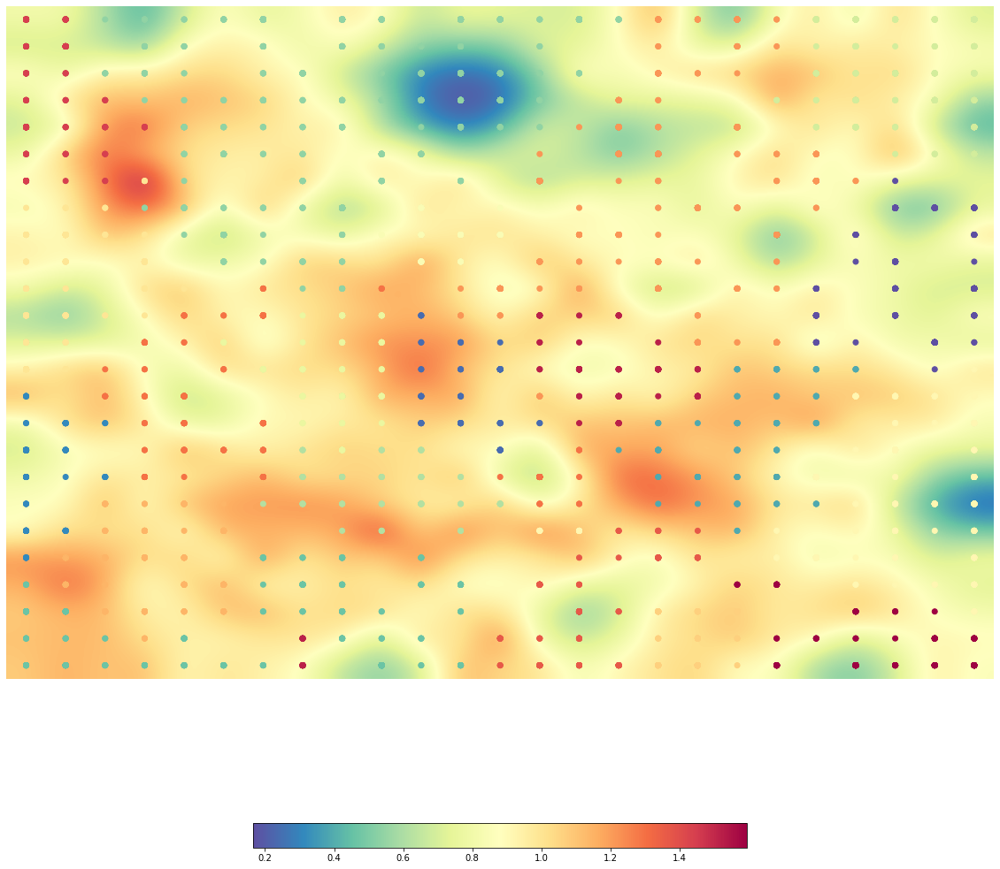

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 20)

[[17 17  5  5  5  5  5  5  5  5  5  5  5  5  5  5 14 14 14 14  7  7  7  7  7]
 [17 17 17  5  5  5  5  5  5  5  5  5  5  5  5  5 14 14 14 14  7  7  7  7  7]
 [17 17  5  5  5  5  5  5  5  5  5  5  5  5  5 14 14 14 14  7  7  7  7  7  7]
 [17 17 17  5  5  5  5  5  5  5  5  5  5  5  5 14 14 14 14  7  7  7  7  7  7]
 [17 17 17 17  5  5  5  5  5  5  5  5  5  5 14 14 14 14 14 14  7  7  7  7  7]
 [17 17 17  5  5  5  5  5  5  5  5  5  5 14 14 14 14 14 14 14 14  7  7  7  7]
 [17 17 17 11  5  5  5  5  5  5  5  5 14 14 14 14 14 14 14 14 14 14  0  0 14]
 [11 11 11  5  5  5  5  5  5  5  9  9  9 14 14 14 14 14 14 14 14  0  0  0  0]
 [11 11 11 11  5  5  5  5  5  9  9  9  9 14 14 14 14 14 14 14 14  0  0  0  0]
 [11 11 11 11 11  5  5  5  5  9  9  9 14 14 14 14 14 14 14 14 14  0  0  0  0]
 [11 11 11 11 11  5 15  5  5 15  9 14 14 14 14 14 14 14 14 14  0  0  0  0  0]
 [11 11 11 11 15 15 15  8  8  8  1 14 14 18 18 18 14 14 14 14  0  0  0  0  0]
 [11 11 11 15 15  8  8  8  8  8  1  1  1 18 18 18 18 14 14 14  0

In [ ]:
analysis(20)

Cluster 5: (1038 Total Movies)
[('Drama', 1038), ('Romance Film', 131), ('Crime Fiction', 96), ('Indie', 80), ('Black-and-white', 80), ('War film', 60), ('Family Film', 49), ('Family Drama', 45), ('Period piece', 45), ('Comedy film', 44), ('Biographical film', 43), ('Melodrama', 37), ('Adventure', 35), ('Musical', 35), ('Television movie', 32), ('Biopic [feature]', 31), ('Docudrama', 27), ('Coming of age', 25), ('Biography', 24), ('Film adaptation', 24), ('Political drama', 24), ('Short Film', 22), ('Mystery', 22), ('History', 21), ('Crime Drama', 19), ('Sports', 19), ('Historical fiction', 18), ('Fantasy', 16), ('Courtroom Drama', 15), ('Comedy-drama', 14), ('Science Fiction', 14), ('Documentary', 13), ('Action/Adventure', 12), ('Chinese Movies', 11), ('Film noir', 11), ('Romantic drama', 10), ('Musical Drama', 10), ('Teen', 10), ('Gangster Film', 9), ('Japanese Movies', 9), ('Music', 8), ('Action', 8), ('Ensemble Film', 8), ('Childhood Drama', 8), ('Silent film', 8), ('Western', 8), 

#### K = 25 optimization

In [ ]:
kmeans = KMeans(n_clusters = 25)
som25.cluster(algorithm = kmeans)

##### UMatrix plot

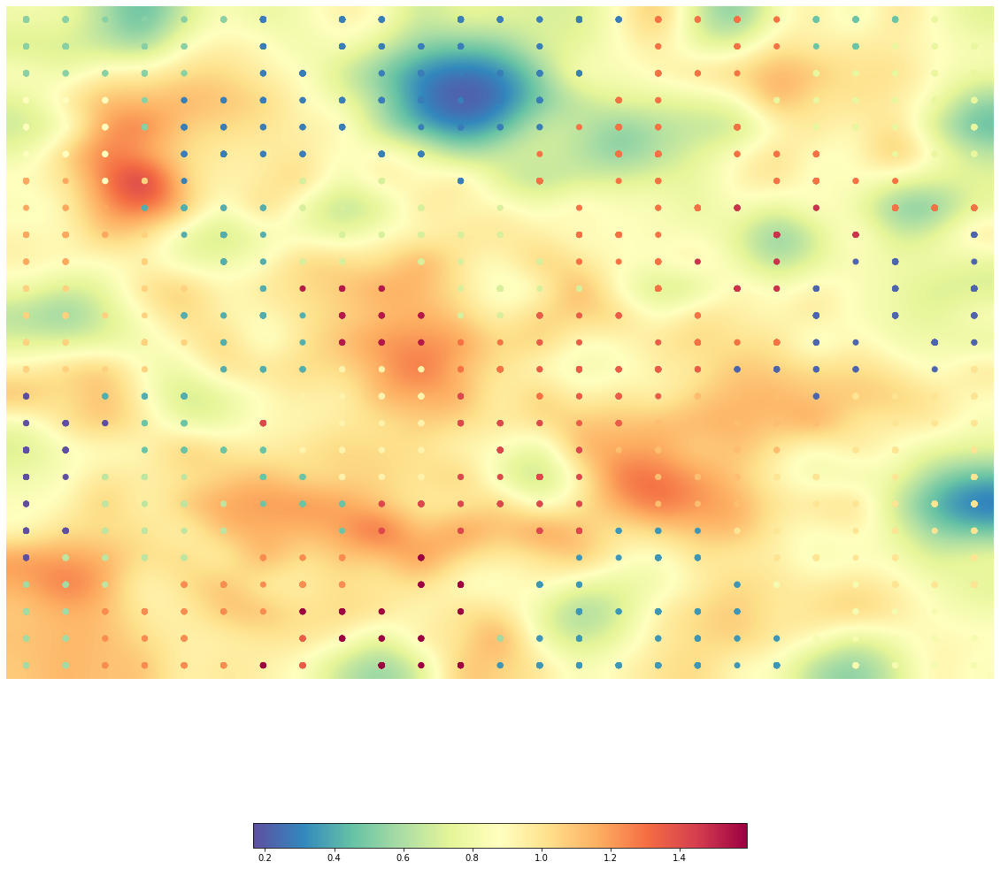

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 25)

[[ 6  6  6  6  6  6  2  2  2  2  2  2  2  2  2  2 19 19 19 19  5  5  5 10 10]
 [ 6  6  6  6  6  2  2  2  2  2  2  2  2  2  2  2 19 19 19 19  5  5 10 10 10]
 [ 6  6  6  6  6  2  2  2  2  2  2  2  2  2  2 19 19 19 19 10 10 10 10 10 10]
 [12 12 12  6  2  2  2  2  2  2  2  2  2  2  2 19 19 19 19 10 10 10 10 10 10]
 [12 12 12  6  2  2  2  2  2  2  2  2  2  2 19 19 19 19 19 19 10 10 10 10 10]
 [12 12 12  6  2  2  2  2  2  2  2  2  2 19 19 19 19 19 19 19 19 10 10 10 10]
 [17 17 12 15  2  2  2  9  9  9  9  2 19 19 19 19 19 19 22 19 19 19 19 19 19]
 [17 17 17  4  4  4  4  9  9  9  9  9  9 19 19 19 19 19 22 22 22 19 19 19 19]
 [17 17 17 15  4  4  4  9  9  9  9  9  9 19 19 19 19 19 22 22 22 22  1 19  1]
 [17 17 15 15  4  4  4  9  9  9  9  9  9  9 19 19 19 22 22 22 22  1  1  1  1]
 [15 15 15 15 15  4  4 23 23 23  9  9  9  9  9 19 19 22 22 22  1  1  1  1  1]
 [15 15 15 15  4  4  4  4 23 23 23  9  9 20 20 20 19 19 22 19  1  1  1  1  1]
 [15 15 15 15 15  4  4  4 23 23 23 19 19 20 20 20 20 19 19 19  1

In [ ]:
analysis(25)

Cluster 19: (659 Total Movies)
[('Documentary', 128), ('Short Film', 97), ('Japanese Movies', 56), ('Romance Film', 54), ('Western', 47), ('Silent film', 44), ('Musical', 44), ('Science Fiction', 43), ('Action/Adventure', 30), ('Fantasy', 28), ('War film', 26), ('Crime Fiction', 24), ('Family Film', 23), ('Chinese Movies', 22), ('Culture & Society', 22), ('Biography', 22), ('Mystery', 20), ('Indie', 17), ('World cinema', 16), ('Anime', 15), ('Romantic comedy', 14), ("Children's/Family", 13), ('Biographical film', 12), ('Music', 11), ('Bollywood', 10), ('Social issues', 9), ("Children's Fantasy", 9), ('Drama', 9), ('Animation', 9), ('Film noir', 9), ('History', 9), ('Comedy-drama', 8), ('Political cinema', 7), ('Historical drama', 7), ('Black comedy', 7), ('Black-and-white', 7), ('Filipino Movies', 6), ('Television movie', 6), ('Propaganda film', 5), ('Romantic drama', 5), ('Sports', 5), ('Costume drama', 4), ('Rockumentary', 4), ('Wuxia', 4), ('Cult', 4), ('Language & Literature', 4), 

#### K = 30 optimization

In [ ]:
kmeans = KMeans(n_clusters = 30)
som25.cluster(algorithm = kmeans)

##### UMatrix plot

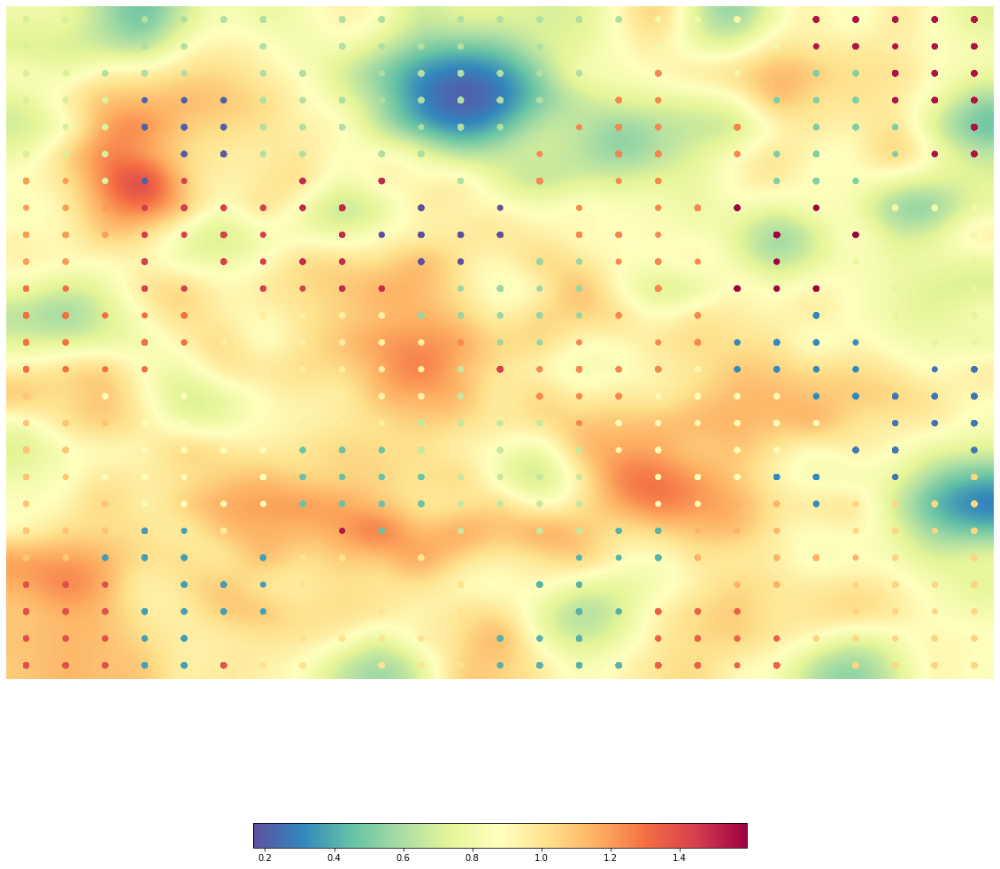

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 30)

[[11 11  9  9  9  9  9  9  9  9  9  9  9  9  9  9 13 13 13 13 28 28 28 28 28]
 [11 11 11  9  9  9  9  9  9  9  9  9  9  9  9  9 13 13 13 13 28 28 28 28 28]
 [11 11  9  9  9  9  9  9  9  9  9  9  9  9  9 22 22 13 13  7  7  7 28 28 28]
 [11 11 11  1  1  1  9  9  9  9  9  9  9  9  9 22 22 22 22  7  7  7 28 28 28]
 [11 11 11  1  1  1  9  9  9  9  9  9  9  9 22 22 22 22 22 22  7  7  7 28 28]
 [11 11 11  1  1  1  9  9  9  9  9  9  9 22 22 22 22 22 22  7  7  7  7 28 28]
 [21 21 11  1 26  1 27 27 27 27 27  9 22 22 22 22 22 22 22  7  7  7 13 13 13]
 [21 21 21 26 26 26 26 27 27 27  0  0  0 22 22 22 22 22 29 29 29 13 13 13 13]
 [21 21 21 26 26 26 26 27 27  0  0  0  0  8 22 22 22 22 29 29 29 29 12 13 13]
 [21 21 23 26 26 26 26 27 27  0  0  0  8  8  8 22 22 22 29 29 29 12 12 12 12]
 [23 23 23 26 26 26 26 26 27 27  0  8  8  8  8 22 22 22 29 29 29 12 12 12 12]
 [23 23 23 23 23 16 16 16 16 16  8  8  8  8  8 22 22 22 29  3  3 12 12 12 12]
 [23 23 23 23 23 16 16 16 16 16 16 22  8  8 22 22 22 22  3  3  3

In [ ]:
analysis(30)

Cluster 9: (838 Total Movies)
[('Drama', 838), ('Romance Film', 122), ('Indie', 64), ('War film', 49), ('Family Film', 45), ('Comedy film', 43), ('Family Drama', 42), ('Musical', 31), ('Period piece', 26), ('Adventure', 22), ('Television movie', 21), ('Melodrama', 21), ('Coming of age', 20), ('Short Film', 19), ('Docudrama', 16), ('Film adaptation', 16), ('Fantasy', 16), ('Historical fiction', 15), ('Political drama', 14), ('Comedy-drama', 14), ('History', 13), ('Science Fiction', 13), ('Mystery', 13), ('Sports', 11), ('Documentary', 11), ('Chinese Movies', 9), ('Biopic [feature]', 9), ('Crime Fiction', 9), ('Courtroom Drama', 8), ('Ensemble Film', 8), ('Japanese Movies', 8), ('Romantic drama', 8), ('Action/Adventure', 7), ('Horror', 7), ('Christian film', 7), ('Art film', 7), ('Teen', 6), ('Western', 6), ('Silent film', 6), ('Musical Drama', 6), ('Childhood Drama', 6), ('Music', 6), ('Disaster', 6), ('Biography', 6), ('Road movie', 6), ("Children's/Family", 5), ('Bollywood', 5), ('Soc

#### K = 35 optimization

In [ ]:
kmeans = KMeans(n_clusters = 35)
som25.cluster(algorithm = kmeans)

##### UMatrix plot

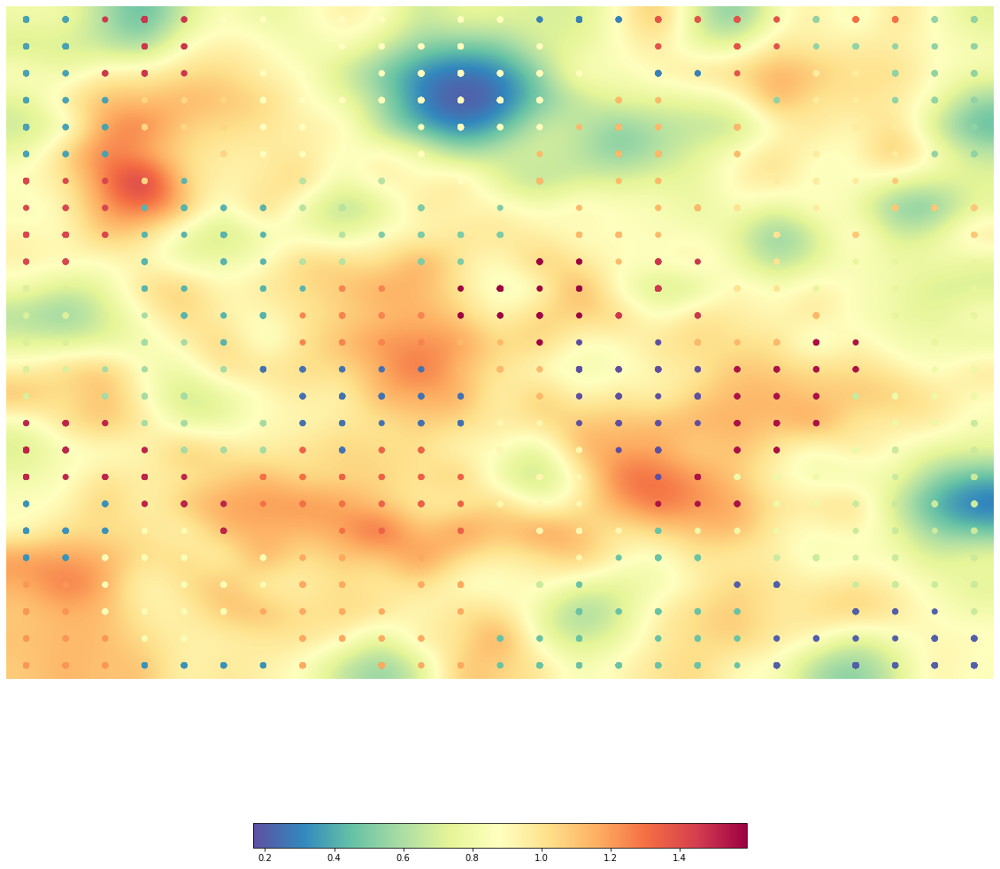

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 35)

[[ 5  5 31 31 31 17 17 17 17 17 17 17 17  3  3  3 29 29 29 29  9 27 27  9  9]
 [ 5  5  5 31 31 17 17 17 17 17 17 17 17 17  3  3 29 29 29 29  9  9  9  9  9]
 [ 5  5 31 31 31 17 17 17 17 17 17 17 17 17 17  3  3  3 29 19 19 19  9  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 17 17 23 23 23 23  9 19 19  9  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 17 23 23 23 23 23 23 19 19 19  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 23 23 23 23 23 23 19 19 19 19  9  9]
 [30 30 30 21  6 17 17 11 11 11 11 17 23 23 23 23 23 23 23 19 19 19 22 22 22]
 [30 30 30  6  6  6  6 11 11 11  8  8  8 23 23 23 23 23 20 20 19 22 22 22 22]
 [30 30 30  6  6  6  6 11 11  8  8  8  8 34 23 23 23 23 20 20 20 22 22 22 22]
 [30 30 13  6  6  6  6 11 11  8  8  8 34 34 34 23 31 31 20 20 20 14 14 14 14]
 [13 13 13  6  6  6  6  6 26 26  8 34 34 34 34 31 31 31 20 20 14 14 14 14 14]
 [13 13 13 10  6  6  6 26 26 26 26 34 34 34 34 31 31 31 20 23 23 14 14 14 14]
 [13 13 13 10 10  6  6 26 26 26 26 23 23 34  0  0  0 23 23 23 33

In [ ]:
analysis(35)

Cluster 17: (678 Total Movies)
[('Drama', 678), ('Indie', 62), ('Family Drama', 41), ('Family Film', 40), ('Comedy film', 31), ('Musical', 28), ('Period piece', 23), ('Television movie', 20), ('Melodrama', 19), ('Short Film', 18), ('Coming of age', 18), ('Adventure', 18), ('Fantasy', 14), ('Film adaptation', 13), ('Comedy-drama', 12), ('Sports', 11), ('Science Fiction', 11), ('Historical fiction', 10), ('Mystery', 10), ('Docudrama', 9), ('Romance Film', 9), ('Political drama', 8), ('Ensemble Film', 8), ('Chinese Movies', 8), ('Romantic drama', 8), ('Biopic [feature]', 7), ('Art film', 7), ('History', 7), ('Horror', 6), ('Japanese Movies', 6), ('Courtroom Drama', 6), ('Documentary', 6), ('Action/Adventure', 6), ('Silent film', 6), ('Teen', 6), ('Childhood Drama', 5), ('Western', 5), ('Road movie', 5), ("Children's/Family", 5), ('Disaster', 4), ('Black comedy', 4), ('Christian film', 4), ('Bollywood', 4), ('Addiction Drama', 4), ('Music', 4), ('Musical Drama', 4), ('Biography', 3), ('New

#### K = 40 optimization

In [ ]:
kmeans = KMeans(n_clusters = 40)
som25.cluster(algorithm = kmeans)

##### UMatrix plot

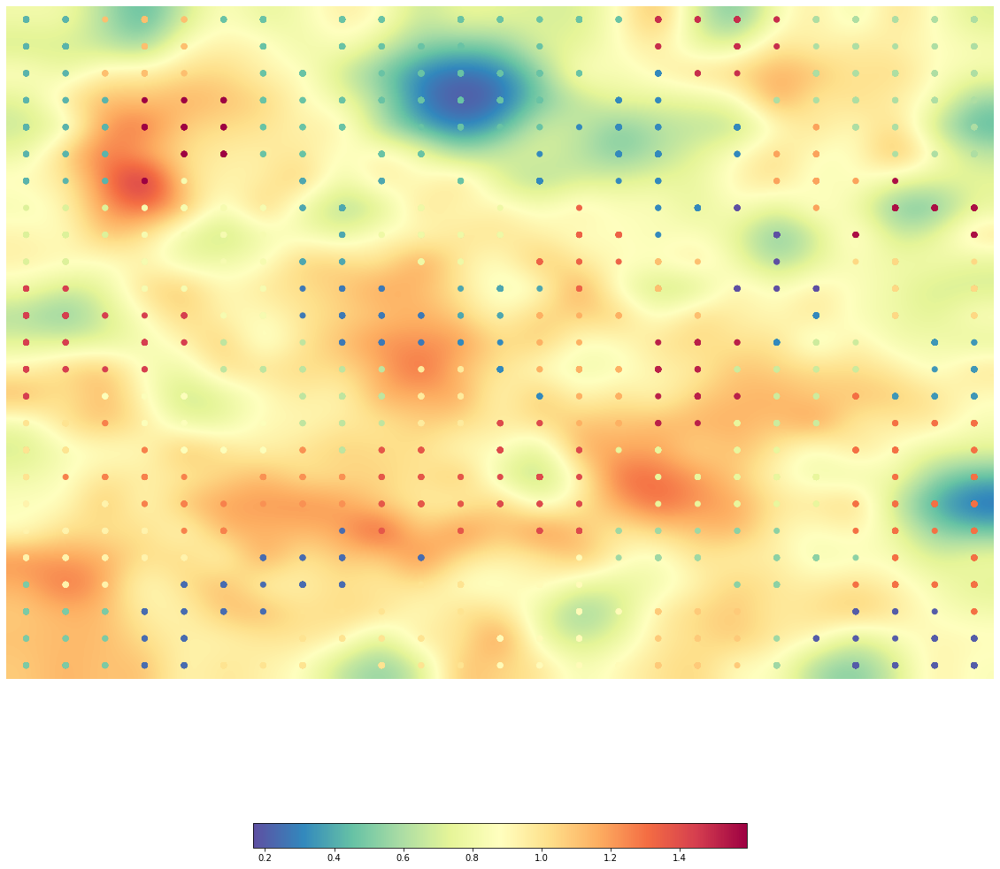

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 40)

[[ 7  7 26 26 26  8  8  8  8  8  8  8  8  8  8  8 36 36 36 36 12 12 12 12 12]
 [ 7  7 26 26 26  8  8  8  8  8  8  8  8  8  8 36 36 36 36 36 12 12 12 12 12]
 [ 7  7 26 26 26  8  8  8  8  8  8  8  8  8  8  4  4 36 36 12 12 12 12 12 12]
 [ 7  7  7 39 39 39  8  8  8  8  8  8  8  8  8  4  4  4  4 12 12 12 12 12 12]
 [ 7  7  7 39 39 39  8  8  8  8  8  8  8  8  4  4  4  4  4  4 28 12 12 12 12]
 [ 7  7  7 39 39 39  8  8  8  8  8  8  8  4  4  4  4  4  4 28 28 28 12 12 12]
 [ 7  7  7 39 18 39  8  6  6  6  6  8  4  4  4  4  4  4  4 28 28 28 38 38 38]
 [15 15 15 18 18 18 18  6  6  6 17 17 17  4 32 32  4  4  0  0 28 38 38 38 38]
 [15 15 15 18 18 18 18  6  6 17 17 17 17 32 32 32  4  4  0  0  0 38 38 38 38]
 [15 15 35 18 18 18 18  6  6 17 17 17  6 32 32 32 26 26  0  0  0 24 24 24 24]
 [35 35 35 18 18 18 18  3  3  3 17  6  6  6 32 26 26 26  0  0  0 24 24 24 24]
 [35 35 35 35 35 18 18  3  3  3  3  6  6 27 27 27 26 26  0  4  4 24 24 24 24]
 [35 35 35 35 35 13 13 13  3  3  3  4  4 27 27 27 37 37 37  4 14

In [ ]:
analysis(40)

Cluster 8: (725 Total Movies)
[('Drama', 725), ('Indie', 64), ('War film', 45), ('Family Drama', 41), ('Family Film', 40), ('Comedy film', 31), ('Musical', 29), ('Period piece', 25), ('Television movie', 21), ('Adventure', 20), ('Melodrama', 19), ('Coming of age', 18), ('Short Film', 18), ('Docudrama', 16), ('Fantasy', 15), ('Film adaptation', 15), ('Political drama', 14), ('Historical fiction', 13), ('Comedy-drama', 12), ('Science Fiction', 12), ('Sports', 11), ('Documentary', 11), ('History', 10), ('Mystery', 10), ('Romance Film', 9), ('Biopic [feature]', 9), ('Romantic drama', 8), ('Courtroom Drama', 8), ('Chinese Movies', 8), ('Ensemble Film', 8), ('Action/Adventure', 7), ('Art film', 7), ('Silent film', 6), ('Christian film', 6), ('Disaster', 6), ('Horror', 6), ('Teen', 6), ('Japanese Movies', 6), ('Road movie', 6), ('Childhood Drama', 5), ('Western', 5), ("Children's/Family", 5), ('Biography', 5), ('Music', 5), ('Social problem film', 4), ('Black comedy', 4), ('Addiction Drama', 

###Best K=35

Μετά από εξέταση των αποτελεσμάτων της συνάρτησης $analysis$ και επαληθεύοντας τα εννοιολογικά, παρατηρούμε ότι το K=35 μας δίνει την βέλτιστη συσταδοποίηση όσον αφορά τον χάρτη SOM 25x25 γιατί:
* Για μικρότερα Κ είτε η ποιότητα των clusters (αν και δεν είχαμε μεγάλο αριθμό Red Clusters είχαμε αρκετά Yellow Clusters) δεν ήταν ικανοποιητική ή/και υπάρχει μεγάλη συσσώρευση ταινιών στο Red Cluster με τις πολλές εννοιολογικά απόμακρες κατηγορίες (π.χ. Cluster 19 στο K=25). 
* Όπως φαίνεται από την επιλογή μας το scoring δεν αποτελεί τον σημαντικότερο παράγοντα για την επιλογή του Κ, αφού στο Κ=35 έχουμε λίγο μικρότερο scoring απο τα Κ=25 και Κ=40.
* Στο Κ=40 χωρίζονται κατηγορίες που ίσως να μην έπρεπε να χωρίζονται όπως το Thriller, Crime Fiction.
* Θα μπορούσαμε να διαλέξουμε ισοδύναμα τα Κ=25 και Κ=35 αλλα επιλέξαμε το δεύτερο επειδή θεωρήσαμε σημαντικότερο το να είναι μικρότερο το Cluster 19 του K=25 και η περαιτέρω συσταδοποίηση που γίνεται δίνει χρήσιμα clusters. 
 



## SOM 30x30

### BMUs

In [ ]:
bmus = som30.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[24 29]
 [21 20]
 [21 23]
 ...
 [ 0 22]
 [ 0  4]
 [16 11]]


In [ ]:
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(682, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [29 27]
 [29 28]
 [29 29]]


In [ ]:
print(indices.shape)
print(indices)

(5000,)
[578 508 511 ...  19   4 383]


### Clustering

#### K = 25 optimization

In [ ]:
kmeans = KMeans(n_clusters = 25)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

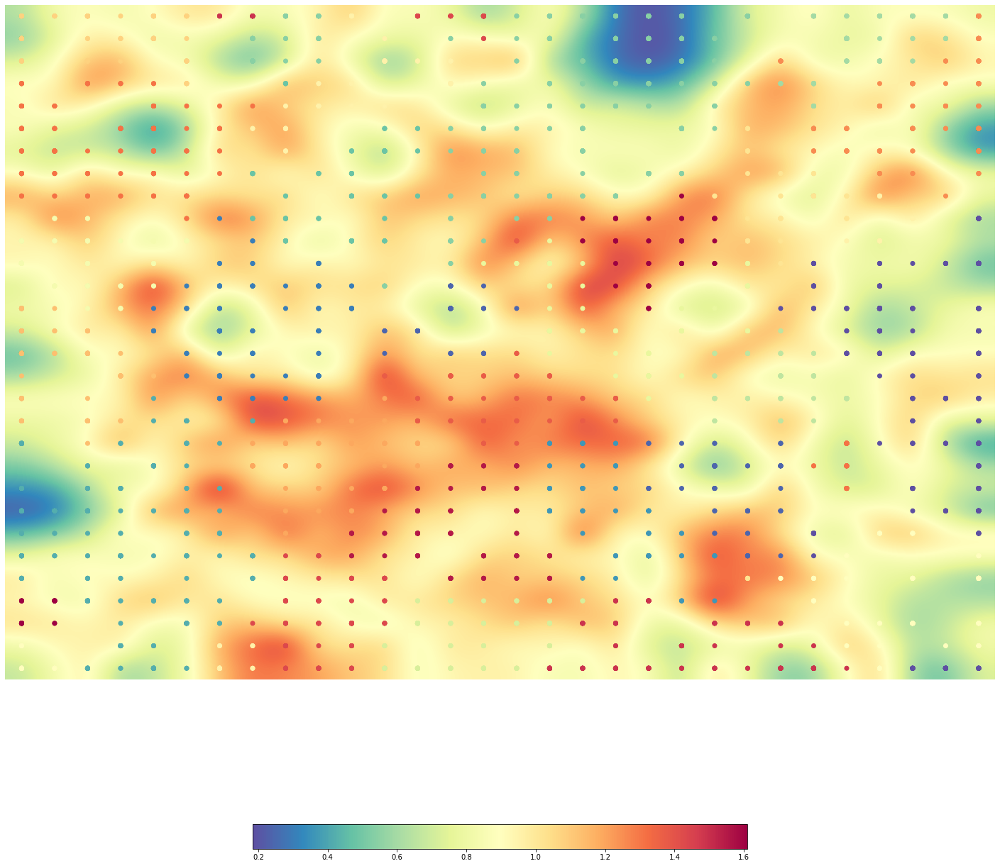

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 25)

[[15 15 15 15 15 15 22 22  6  6 13 13 21 21 21  6  6  6  6  6  6  6  6  6  7  7  7  7  7 18]
 [15 15 15 15 15 15  6  6  6  6  6 13 13  6 21  6  6  6  6  6  6  6  6  6  7  7  7  7  7 18]
 [15 15 15 15 15 15  6  6  6  6 13 13 13 13 13  6  6  6  6  6  6  6  6 18  7  7  7  7 18 18]
 [19 19 19 19 19 15 15  6  5 13 13 13 13 13  6  6  6  6  6  6  6  6  6  7  7  7 18 18 18 18]
 [19 19 19 19 19 19 19 19 13 13 13 13  5  6  6  6  6  6  6  6  6  6  6  7  7 18 18 18 18 18]
 [19 19 19 19 19 19 19 13 13 13  5  5  5  6  6  6  6  6  6  6  6  6 14 14 18 18 18 18 18 18]
 [19 19 19 19 19 19 19 19 13  5  5  5  5  6  6  6  6  6  6  6  6  6 14 14 18 18 18 18 18 18]
 [19 19 19 19 19 19 19  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6 14 14 14 14 18 18 18 18]
 [19 19 19 19 19 19 19  5  5  5  5  5  5  6  6  6  6  6  6  6 24 14 14 14 14 14 13 13 18  0]
 [11 11 11 11 19 19  2  5  5  5  5  5  6  6  6  6  6 24 24 24 24 24 14 14 14 14 13 13  0  0]
 [11 11 11 11 11 11  2  2  5  5  5  5  6  6  6 20 10 24 24 24 24 24 14

In [ ]:
analysis(25)

Cluster 6: (790 Total Movies)
[('Drama', 790), ('World cinema', 104), ('War film', 60), ('Family Film', 46), ('Biographical film', 43), ('Period piece', 40), ('Family Drama', 38), ('Musical', 35), ('Comedy film', 30), ('Biography', 28), ('Biopic [feature]', 27), ('Political drama', 27), ('Television movie', 25), ('Docudrama', 22), ('Art film', 22), ('Melodrama', 22), ('Short Film', 21), ('Chinese Movies', 19), ('History', 17), ('Coming of age', 17), ('Historical fiction', 16), ('Sports', 16), ('Crime Fiction', 16), ('Fantasy', 15), ('Documentary', 13), ('Action/Adventure', 12), ('Japanese Movies', 11), ('Film adaptation', 11), ('Mystery', 10), ('Romantic drama', 10), ('Courtroom Drama', 9), ('Music', 9), ('Childhood Drama', 8), ('Musical Drama', 8), ('Adventure', 7), ('Comedy-drama', 6), ('Horror', 6), ('Filipino Movies', 6), ('Social problem film', 6), ('Silent film', 6), ('Christian film', 6), ('Teen', 5), ('Western', 5), ('Costume drama', 5), ('Road movie', 5), ('Bollywood', 4), ('S

#### K = 30 optimization

In [ ]:
kmeans = KMeans(n_clusters = 30)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

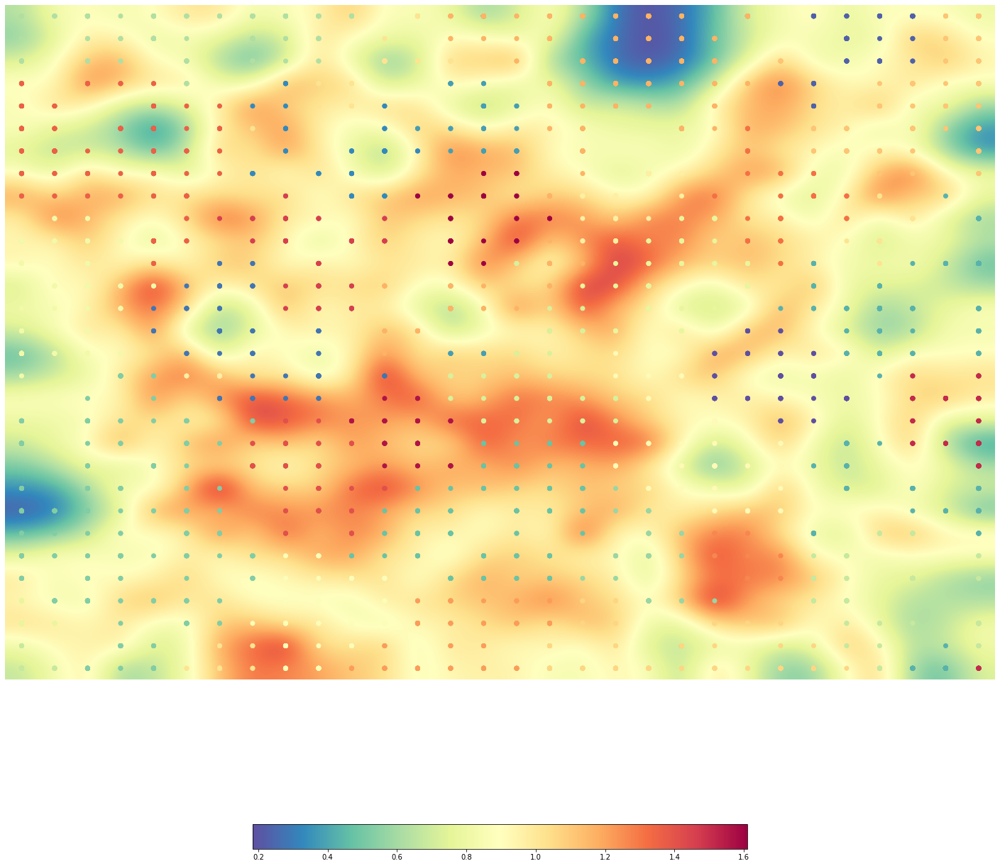

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 30)

[[ 9  9  9  9  9  9  9  9  9  9  9 17 17 20 20 20 20 20 20 20 20 20 20 20  1  1  1  1 19 19]
 [ 9  9  9  9  9  9  9  9  9  9  9 17 17 20 20 20 20 20 20 20 20 20 20 20  1  1  1  1 19 19]
 [ 9  9  9  9  9  9  9  9  9  9 17 17 17 17 17 20 20 20 20 20 20 20 20 19  1  1  1  1 19 19]
 [24 24 24 24 24  9  9  9  3 17 17 17 17  4  4 20 20 20 20 20 20 20 20  1  1  1 19 19 19 19]
 [24 24 24 24 24 24 24  3  3 17 17  3  3  4  4  4 20 20 20 20 20 20 20  1  1 19 19 19 19 19]
 [24 24 24 24 24 24 24 17  3  3  3  3  4  4  4  4 20 20 20 20 20 20 23 23 19 19 19 19 19 19]
 [24 24 24 24 24 24 24  3  3  3  3  3  3  4  4  4 20 20 20 16 20 20 23 23 19 19 19 19 19 19]
 [24 24 24 24 24 24 24  3  3  3  3  3  3 29 29 29 20 20 16 16 16 16 23 23 23 23 19 19 19 19]
 [24 24 24 24 24 24 24  3 26  3  3  3 29 29 29 29 20 16 16 16 16 23 23 23 23 23 17 17  5  5]
 [13 13 13 24 24 24 26 26 26 26 26 26 29 29 29 29 29 16 16 16 12 12 23 23 23 23 17 17  5  5]
 [13 13 13 13 24 24  2 26 26 26 26 26 20 29 29 29 20 16 16 12 12 12 23

In [ ]:
analysis(30)

Cluster 7: (494 Total Movies)
[('Comedy', 494), ('Black-and-white', 79), ('Short Film', 58), ('Family Film', 56), ('Musical', 43), ('Slapstick', 43), ('Parody', 41), ('Black comedy', 38), ('Romance Film', 37), ('Indie', 33), ('Satire', 29), ('Crime Fiction', 18), ('Fantasy', 18), ('Cult', 17), ('Comedy-drama', 17), ('Screwball comedy', 16), ('Teen', 15), ('Romantic comedy', 15), ('Sex comedy', 14), ('Adventure', 14), ('Science Fiction', 13), ('Crime Comedy', 12), ('Thriller', 12), ('Animation', 12), ('World cinema', 12), ("Children's/Family", 11), ('Buddy film', 9), ('Horror', 8), ('Fantasy Comedy', 8), ('Sports', 8), ('Gross-out film', 7), ("Children's", 7), ('Comedy of Errors', 7), ('Gross out', 7), ('Absurdism', 6), ('Adventure Comedy', 6), ('Mystery', 6), ('Comedy of manners', 6), ('Coming of age', 6), ('Mockumentary', 6), ('Political cinema', 6), ('Domestic Comedy', 6), ('Ensemble Film', 6), ('Action', 5), ('Western', 5), ('Political satire', 5), ('Musical comedy', 5), ('Media Sat

#### K = 35 optimization

In [ ]:
kmeans = KMeans(n_clusters = 35)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

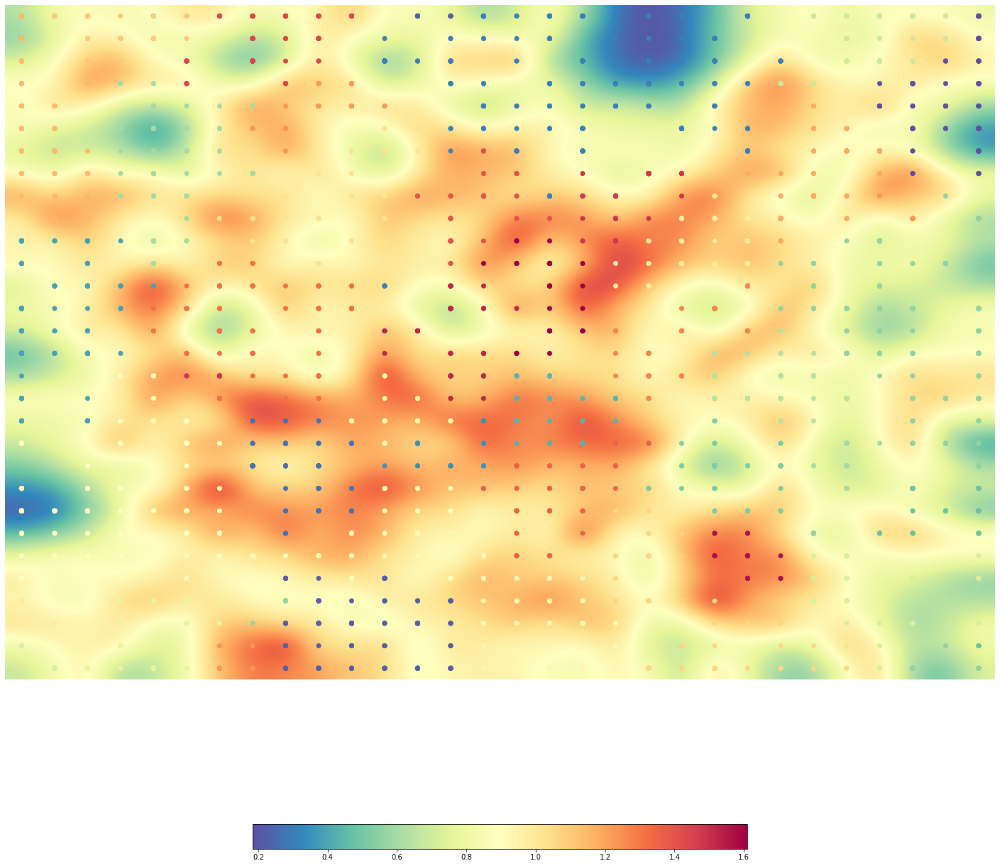

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 35)

[[23 22 22 22 22 22 30 30 30 30 30 30  1  1  3  3  3  3  3  3  3  3  3  3 12 12 12 12 12  0]
 [23 23 22 22 22 22 30 30 30 30 30  3  3  3  3  3  3  3  3  3  3  3  3  3 12 12 12 12 12  0]
 [23 23 22 22 22 30 30 30 30 30  3  3  3  3  3  3  3  3  3  3  3  3  3  3 12 12 12 12  0  0]
 [23 23 23 10 10 30 30 30 30 25 25  3  3  3  3  3  3  3  3  3  3  3  3 12 12 12  0  0  0  0]
 [23 23 23 10 10 10 10 10 25 25 25 25 20  3  3  3  3  3  3  3  3  3  3 12 24  0  0  0  0  0]
 [23 23 10 10 10 10 10 25 25 25 20 20 20  3  3  3  3  3  3  3  3  3  3 24 24 24  0  0  0  0]
 [23 23 23 10 10 10 10 10 25 20 20 20 20  3 29  3  3  3  3 31  3  3  3 24 24 24 24  0  0  0]
 [23 23 23 10 10 10 10 10 20 20 20 20 20 29 29 29  3 31 31 31 31 31 24 24 24 24 24  0  0  0]
 [23 23 23 10 10 10 10 20 20 20 20 20 29 29 29 29  3 31 31 31 31 19 24 24 24 24 25 25  9  9]
 [23 23 23 10 10 10 20 20 20 20 20 20 29 29 29 29 29 31 31 31 19 19 19 24 24 24  9 25  9  9]
 [ 5  5  5  5 10 10 27 20 20 20 20 20  3 29 29 34 34 31 31 19 19 19 19

In [ ]:
analysis(35)

Cluster 3: (718 Total Movies)
[('Drama', 718), ('Black-and-white', 59), ('Crime Fiction', 51), ('War film', 49), ('Comedy film', 30), ('Melodrama', 29), ('Musical', 25), ('Television movie', 19), ('Short Film', 18), ('Docudrama', 18), ('Mystery', 17), ('Family Drama', 15), ('Period piece', 15), ('Film adaptation', 15), ('Fantasy', 13), ('Political drama', 13), ('Courtroom Drama', 12), ('Science Fiction', 12), ('Documentary', 10), ('Historical fiction', 10), ('Horror', 9), ('Romantic drama', 9), ('Silent film', 9), ('Sports', 9), ('Biopic [feature]', 8), ('Chinese Movies', 8), ('History', 7), ('Coming of age', 7), ('Comedy-drama', 7), ('Art film', 7), ('Japanese Movies', 6), ('Biography', 5), ('Disaster', 5), ('Film noir', 5), ('Family Film', 4), ('Doomsday film', 4), ('Christian film', 4), ('Western', 4), ('Music', 4), ('Teen', 4), ('Social problem film', 4), ('Bollywood', 4), ('Childhood Drama', 3), ("Children's/Family", 3), ('Action/Adventure', 3), ('Addiction Drama', 3), ('Thriller'

#### K = 40 optimization

In [ ]:
kmeans = KMeans(n_clusters = 40)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

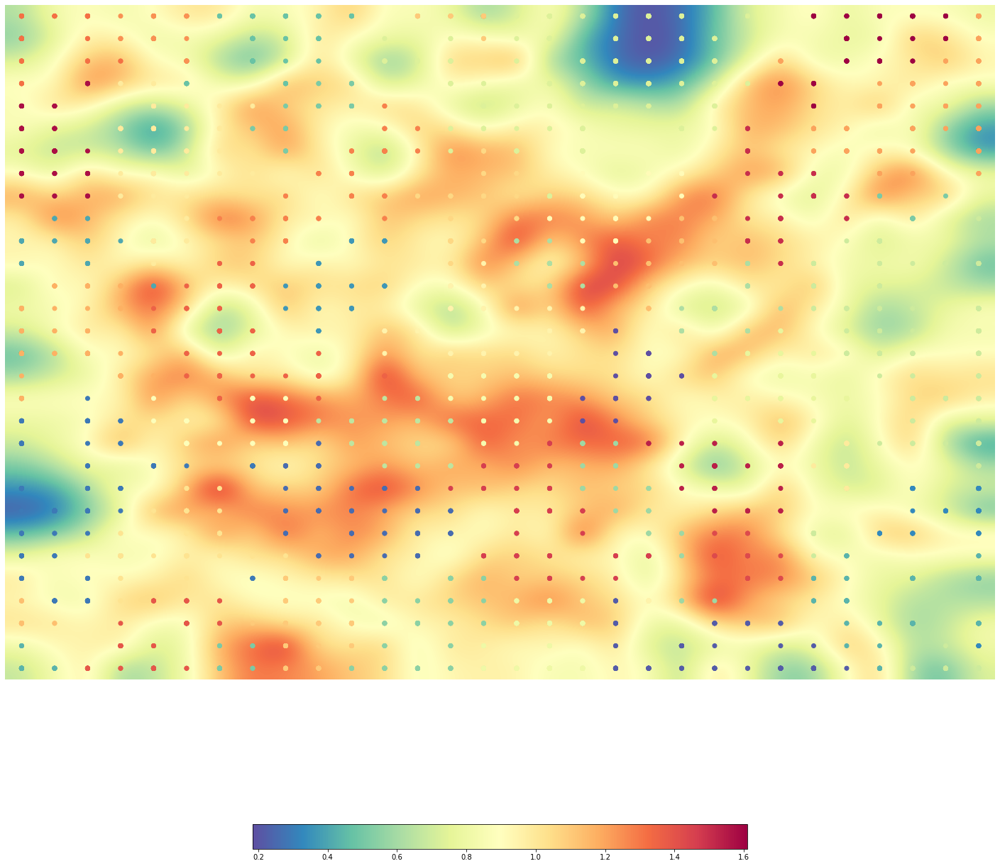

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 40)

[[31 31 31 29 29 29  8  8  8  8  8 25 25 25 25 15 15 15 15 15 15 15 15 15 39 39 39 39 39 28]
 [31 31 31 29 29 29  8  8  8  8  8 15 15 15 25 15 15 15 15 15 15 15 15 15 39 39 39 39 39 28]
 [31 31 31 31 29 29  8  8  8  8 15 15 15 15 15 15 15 15 15 15 15 15 15 28 39 39 39 39 28 28]
 [31 38 38 22 22  8  8  8  8  9  9 15 15 15 15 15 15 15 15 15 15 15 15 39 39 39 28 28 28 28]
 [38 38 38 22 22 22 22 22  9  9  9 30 30 15 15 15 15 15 15 15 15 15 15 39 39 28 28 28 28 28]
 [38 38 22 22 22 22 22  9  9  9 30 30 30 15 15 15 15 15 15 15 15 15 36 36 28 28 28 28 28 28]
 [38 38 38 22 22 22 22 22  9 30 30 30 30 15 24 15 15 15 15 20 15 15 36 36 28 28 28 28 28 28]
 [38 38 38 22 22 22 22 22 30 30 30 30 30 24 24 24 15 20 20 20 20 20 36 36 36 36 28 28 28 28]
 [38 38 38 22 22 22 22 30 30 30 30 30 24 24 24 24 15 20 20 20 20 36 36 36 36 36  9  9  9 14]
 [ 6  6  6  6 22 22 30 30 30 30 30 30 24 24 24 24 20 20 20 20 26 26 36 36 36 36  9  9 14 14]
 [ 6  6  6  6 22 22 32 30 30  5  5  5 15 24 24 12 12 20 20 26 26 26 36

In [ ]:
analysis(40)

Cluster 15: (650 Total Movies)
[('Drama', 650), ('Black-and-white', 59), ('War film', 49), ('Melodrama', 29), ('Comedy film', 29), ('Musical', 25), ('Short Film', 18), ('Television movie', 16), ('Docudrama', 15), ('Family Drama', 15), ('Period piece', 13), ('Political drama', 11), ('Film adaptation', 11), ('Historical fiction', 10), ('Fantasy', 10), ('Mystery', 10), ('Documentary', 10), ('Romantic drama', 9), ('Courtroom Drama', 9), ('Sports', 8), ('Chinese Movies', 8), ('Silent film', 7), ('Coming of age', 7), ('Biopic [feature]', 7), ('Art film', 7), ('History', 6), ('Japanese Movies', 6), ('Crime Fiction', 5), ('Film noir', 5), ('Music', 4), ('Christian film', 4), ('Bollywood', 4), ('Biography', 4), ('Western', 4), ('Social problem film', 4), ('Musical Drama', 3), ('Pre-Code', 3), ('Addiction Drama', 3), ('Thriller', 3), ('Black comedy', 3), ('Teen', 3), ('Childhood Drama', 3), ("Children's/Family", 3), ('Satire', 3), ('Crime Drama', 3), ('Medical fiction', 3), ('Disaster', 3), ('Ro

#### K = 45 optimization

In [ ]:
kmeans = KMeans(n_clusters = 45)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

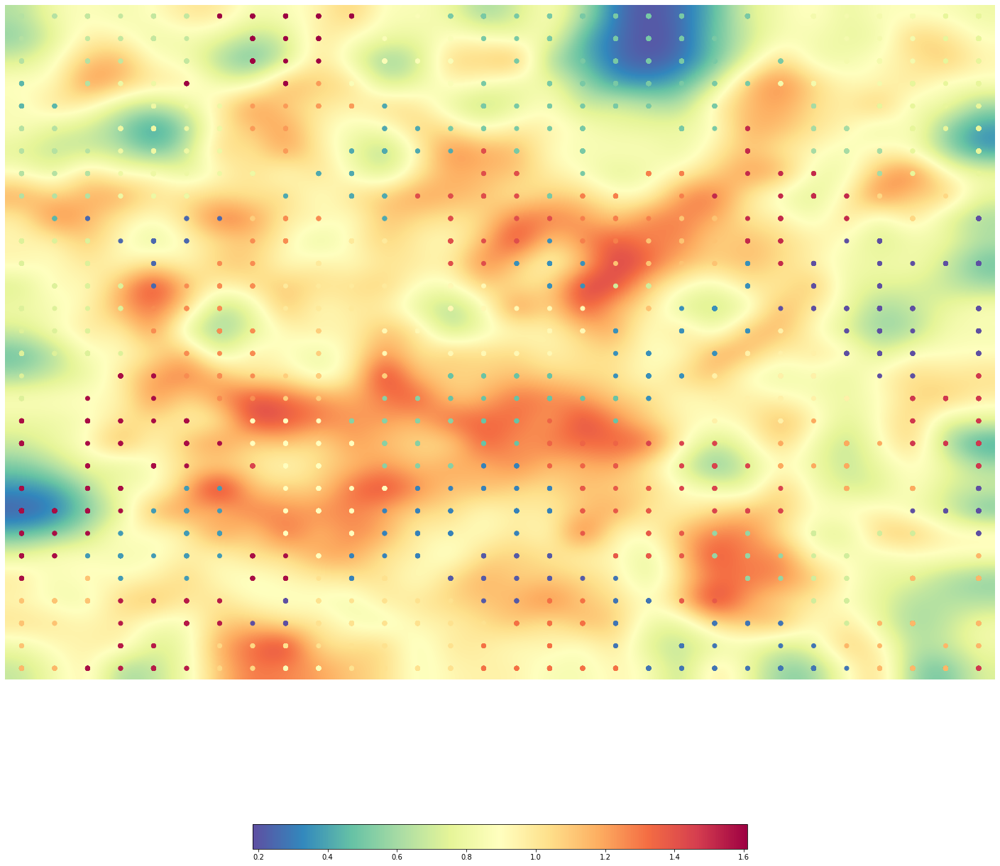

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 45)

[[14 14 15 15 15 15 44 44 44 44 44 21 21 10 10 10 10 10 10 10 10 10 10 10 20 20 20 20 18 18]
 [14 14 15 15 15 15 44 44 44 44 44 21 21 21 10 10 10 10 10 10 10 10 10 10 20 20 20 20 18 18]
 [14 14 14 15 15 15 44 44 44 44 21 21 21 21 21 10 10 10 10 10 10 10 10 10 20 20 20 20 18 18]
 [ 8  8 14 19 19 44 44 44 44 32 21 21 21 21 10 10 10 10 10 10 10 10 10 20 20 20 20 18 18 18]
 [ 8  8  8 19 19 19 19 32 32 32 32  7  7 10 10 10 10 10 10 10 10 10 10 13 13 13 18 18 18 18]
 [14 14 19 19 19 19 19 32 32 32  7  7  7 10 10 10 10 10 10 10 10 10 41 13 13 13 18 18 18 18]
 [14 14 14 19 19 19 19 19 32  7  7  7  7  7 38 10 10 10 10 34 10 10 41 41 13 13 13 18 18 18]
 [14 14 14 19 19 19 19 19  7  7  7  7  7 38 38 38 10 10 34 34 34 34 41 41 41 13 13 18 18 18]
 [14 14 14 19 19 19 19  7  7  7  7  7 38 38 38 38 10 34 34 34 34 41 41 41 41 41 27 27 27  0]
 [14  8  2  2  2  2  2 28 33 33  7  7 38 38 38 38 38 34 34 34 29 29 41 41 41 41 27 27 27  0]
 [17 17 17  2  2  2 33 33 33 25 25 25 10 38 38 38  5 34 34 29 29 29 41

In [ ]:
analysis(45)

Cluster 10: (649 Total Movies)
[('Drama', 649), ('Crime Fiction', 57), ('War film', 42), ('Comedy film', 30), ('Musical', 25), ('Television movie', 20), ('Short Film', 19), ('Melodrama', 19), ('Docudrama', 16), ('Mystery', 16), ('Family Drama', 15), ('Period piece', 14), ('Film adaptation', 13), ('Political drama', 11), ('Courtroom Drama', 11), ('Historical fiction', 10), ('Crime Drama', 10), ('Coming of age', 10), ('Fantasy', 10), ('Documentary', 9), ('Biopic [feature]', 8), ('Chinese Movies', 8), ('Silent film', 8), ('Horror', 8), ('Art film', 7), ('Romantic drama', 7), ('History', 7), ('Japanese Movies', 6), ('Sports', 6), ('Biography', 5), ('Teen', 5), ('Christian film', 4), ('Bollywood', 4), ('Music', 4), ('Western', 3), ("Children's/Family", 3), ('Childhood Drama', 3), ('Dance', 3), ('Family Film', 3), ('Medical fiction', 3), ('Juvenile Delinquency Film', 3), ('Musical Drama', 3), ('Social problem film', 3), ('Satire', 3), ('Black comedy', 3), ('New Hollywood', 3), ('Road movie',

#### K = 50 optimization

In [ ]:
kmeans = KMeans(n_clusters = 50)
som30.cluster(algorithm = kmeans)

##### UMatrix plot

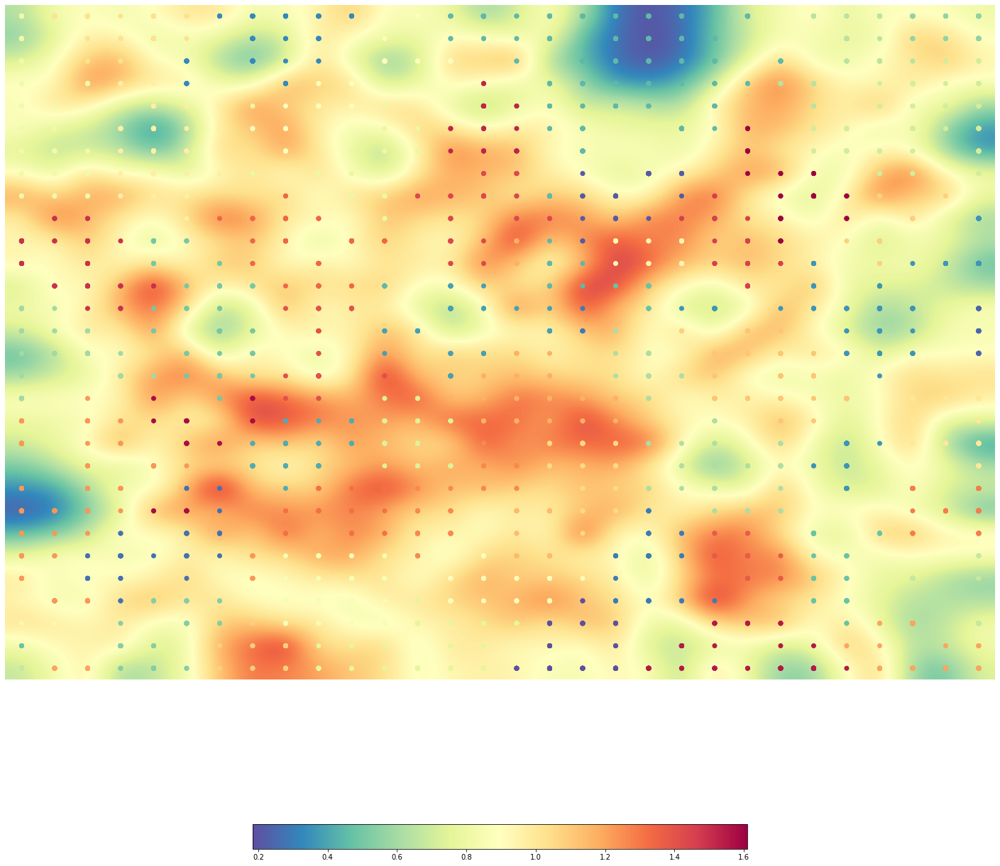

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

##### Analyzing the results

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 50)

[[22 29 29 29 29 29  5  5  5  5  5 24 24  9  9  9  9  9  9  9  9  9  9  9 16 16 16 13 13 13]
 [22 22 29 29 29 29  5  5  5  5  5 24 24  9  9  9  9  9  9  9  9  9  9  9 16 16 16 13 13 13]
 [22 22 29 29 29  5  5  5  5  5 24 24 24 24 24  9  9  9  9  9  9  9  9  9 16 16 16 16 18 18]
 [22 22 22 27 27  5  5  5  5 24 24 24 24 24 46  9  9  9  9  9  9  9  9 16 16 16 18 18 18 18]
 [22 22 22 27 27 27 27 21 24 24 24 21 21 46 46 46  9  9  9  9  9  9  9 16 16 18 18 18 18 18]
 [22 22 27 27 27 27 27 24 24 24 21 21 21 46 46 46  9  9  9  9  9  9 49 49 18 18 18 18 18 18]
 [22 22 22 27 27 27 27 27 24 21 21 21 21 46 46 46  9  9  9  1  9  9 49 49 18 18 18 18 18 18]
 [22 22 22 27 27 27 27 21 21 21 21 21 21 43 43 43  9  1  1  1  1  1 49 49 49 49 18 18 18 18]
 [22 22 22 27 27 27 27 21 40 21 21 21 43 43 43 43  9  1  1  1  1 44 49 49 49 49 31 31 31  6]
 [45 45 45 45 27 27 40 40 40 40 40 21 43 43 43 43 43  1  1  1 44 44 44 49 49 49 31 31 31  6]
 [45 45 45 45 11 11 11 40 40 40 40 40 43 43 43 34  9  1 26 26 26 44 44

In [ ]:
analysis(50)

Cluster 9: (632 Total Movies)
[('Drama', 632), ('Crime Fiction', 59), ('Comedy film', 32), ('Adventure', 25), ('Musical', 24), ('Melodrama', 20), ('Short Film', 19), ('Television movie', 18), ('Mystery', 16), ('Family Drama', 14), ('Film adaptation', 12), ('Period piece', 12), ('Crime Drama', 10), ('Fantasy', 10), ('Docudrama', 10), ('Coming of age', 10), ('Horror', 9), ('Chinese Movies', 8), ('Sports', 8), ('Silent film', 8), ('Historical fiction', 8), ('Courtroom Drama', 8), ('Japanese Movies', 7), ('Romantic drama', 7), ('Art film', 7), ('Political drama', 6), ('History', 6), ('Comedy-drama', 6), ('Biopic [feature]', 5), ('Teen', 5), ('Documentary', 5), ('Biography', 5), ('Family Film', 4), ('Black-and-white', 4), ('Bollywood', 4), ('Music', 3), ('Childhood Drama', 3), ('Action/Adventure', 3), ('Western', 3), ('Black comedy', 3), ('Dance', 3), ('Medical fiction', 3), ('Satire', 3), ('Road movie', 3), ("Children's/Family", 3), ('Christian film', 3), ('Juvenile Delinquency Film', 3), 

###Best K=35

Μετά από εξέταση των αποτελεσμάτων της συνάρτησης $analysis$ και επαληθεύοντας τα εννοιολογικά, παρατηρούμε ότι το K=35 μας δίνει την βέλτιστη συσταδοποίηση όσον αφορά τον χάρτη SOM 30x30 γιατί:
* Αν και δεν πέτυχε το μεγαλύτερο scoring υπάρχει μια λάθος κατάταξη του cluster 15 που θα έπρεπε να είναι Πράσινο, επομένως το scoring θα ήταν μεγαλύτερο.
* Για Κ=25 η ποιότητα των clusters δεν ήταν ικανοποιητική (4 Red Clusters) και για Κ=30 είχαμε ακριβώς τις ίδιες επικρατούσες κατηγορίες σε 2 clusters 14,21 (Crime Fiction και Thriller) 
* Για μεγαλύτερα Κ τα sub-clusters αυξάνονται σημαντικά.



##Best SOM-K combination

$$25x25\ K=35$$


Θα ξεκινήσουμε αναλύοντας τα clusters με βάσει τις επικρατούσες κατηγορίες που εμφανίζονται στο dataset.

$Disclaimer : $ Κάποια cluster εμφανίζονται 2 φορές καθώς εμπεριέχουν σαν επικρατέστερες κατηγορίες 2 απο τις παρακάτω κατηγορίες που αναλύουμε. Θεωρούμε ότι συμπεριλαμβάνοντας τα clusters αυτά και στις 2 κατηγορίες που μπορεί να αντιστοιχούν, η αναλύση μας θα είναι πιο ολοκληρωμένη.

1. **Drama** :
  * $Cluster\ 17\ (678\ movies)$ : η κατηγορία drama είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 678 ταινίες) και επίσης δεν υπάρχει δεύτερη ξεκάθαρη υποκατηγορία καθώς όλες οι υπόλοιπες είναι αρκετά διαφορετικές μεταξύ τους και εμφανίζονται σε πολύ μικρό ποσοστό του συνόλου των ταινιών.
  * $Cluster\ 6\ (130\ movies)$ : η κατηγορία drama εμφανίζεται σε όλες τις ταινίες όπως επίσης εμφανίζεται και η κατηγορία Crime Fiction επομένως το συγκεκριμένο cluster αφορά όλες τις ταινίες οι οποίες χαρακτηρίζονται απόλυτα από αυτές τις 2 κατηγορίες.
  * $Cluster\ 10\ (120\ movies)$ : όμοια με παραπάνω όλες οι ταινίες ανήκουν στις κατηγορίες drama και thriller 
  * $Cluster\ 1\ (201\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και comedy
  * $Cluster\ 32\ (124\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και action
  * $Cluster\ 5\ (182\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama, romantic drama και romance film
  * $Cluster\ 13\ (121\ movies)$ : 113 ταινίες απο τις 121 συνολικά ανήκουν στην κατηγορία drama η οποία στην συγκεκριμένη περίπτωση συνδιάζεται με την κατηγορία World Cinema(όλες οι ταινίες στο συγκεκριμένο cluster ανήκουν σε αυτήν)
  * $Cluster\ 11\ (75\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και black and white
  * $Cluster\ 21\ (55\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και biographical film
  * $Cluster\ 3\ (65\ movies)$ : 47 ταινίες απο τις 65 συνολικά ανήκουν στην κατηγορία drama η οποία στην συγκεκριμένη περίπτωση συνδιάζεται με την κατηγορία War film(63 απο τις 65 ταινίες στο συγκεκριμένο cluster ανήκουν σε αυτήν)
  * $Conclusion\ for\ Drama\ Category$ : Η κατηγορία Drama όπως φαίνεται και παραπάνω είναι η πολυπληθέστερη σε σχέση με όλες τις άλλες κατηγορίες. Εμφανίζεται ως κυρίαρχη σε μεγάλο αριθμό των συνολικών clusters. Παρ' όλα αυτά παρατηρούμε ότι εννοιολογικά το κάθε cluster μας παραπέμπει σε διαφορετικό είδος ταινίας. Μόνη εξαίρεση αποτελεί το cluster 17 στο οποίο έχουμε διάφορα είδη δράματος τα οποία δεν είναι διαχωρίσιμα μεταξύ τους. Η συμπεριφορά αυτή παρατηρήθηκε ανεξαρτήτου χάρτη και ανεξαρτήτου Κ και έγγυται στο γεγονός ότι πολλές ταινίες έχουν ως μοναδικό category το drama.

2. **Τhriller** :
  * $Cluster\ 10\ (120\ movies)$ : όπως αναφέρθηκε και στην κατηγορία drama, μαζί με αυτήν επικρατεί και η κατηγορία thriller
  * $Cluster\ 16\ (112\ movies)$ : όλες οι ταινίες ανήκουν στην κατηγορία thriller. Το συγκεκριμένο cluster περιέχει τις ταινίες που χαρακτηρίζονται ως thriller και action / (action/adventure).
  * $Cluster\ 18\ (89\ movies)$ : όλες οι ταινίες ανήκουν στην κατηγορία thriller. Παρ' όλα αυτά δεν υπάρχει δεύτερη επικρατούσα κατηγορία αφού στην επομένη κατηγορία ανήκουν μόλις οι 18 ταινίες πράγμα το οποίο σημαίνει ότι στο συγκεκριμένο cluster μπήκαν οι ταινίες που είχαν σαν tag μόνο το thriller ή οι ταινίες thriller που δεν μπόρεσαν να κατηγοριοποιηθούν αλλίως.
  * $Cluster\ 2\ (95\ movies)$ : όλες οι ταινίες εκτός απο μία ανήκουν στην κατηγορία thriller. Το συγκεκριμένο cluster μαζεύει τις ταινίες thriller που ανήκουν επιπλέον στην κατηγορία Crime Fiction(87 ταινίες) και στην κατηγορία Mystery(77 ταινίες)
  * $Cluster\ 28\ (51\ movies)$ : όλες οι ταινίες ανήκουν στην κατηγορία thriller. Το συγκεκριμένο cluster μαζεύει τις ταινίες thriller που ανήκουν επιπλέον στην κατηγορία Crime Thriller(44 ταινίες). Επίσης υπάρχουν και αρκετές ταινίες (31) οι οποίες ανήκουν στην κατηγορία Phycological Thriller
  * $Cluster\ 27\ (51\ movies)$ : όλες οι ταινίες ανήκουν στην κατηγορία thriller. Το συγκεκριμένο cluster μαζεύει τις ταινίες thriller που ανήκουν επιπλέον στην κατηγορία Horror(44 ταινίες).
  * $Conclusion\ for\ Thriller\ Category$ : Η κατηγορία Thriller εμφανίζεται σε πολλά cluster παρ' όλα αυτά θεωρήσαμε πως το clustering που έγινε είναι θεμιτό καθώς το κάθε cluster αποτελείται απο διαφορετικού είδους ταινίες thriller.

3. **Comedy** : 
  * $Cluster\ 12\ (358\ movies)$ : η κατηγορία comedy είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 358 ταινίες) και επίσης δεν υπάρχει δεύτερη ξεκάθαρη υποκατηγορία καθώς όλες οι υπόλοιπες είναι αρκετά διαφορετικές μεταξύ τους και εμφανίζονται σε πολύ μικρό ποσοστό του συνόλου των ταινιών.
  * $Cluster\ 7\ (220\ movies)$ : 217 απο τις 220 ταινίες ανήκουν στην κατηγορία comedy. Το συγκεκριμένο cluster έχει επίσης επικρατούσες κατηγόριες την Romance Film(219 ταινιες) και Romantic Comedy(187 ταινίες)
  * $Cluster\ 15\ (124\ movies)$ : η κατηγορία comedy είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 124 ταινίες). Η δεύτερη υποκατηγορία είναι η Family Film η οποία εμφανίζεται σε 73 ταινίες.
  * $Cluster\ 1\ (201\ movies)$ : όπως αναφέρθηκε στην κατηγορία drama
  * $Cluster\ 20\ (79\ movies)$ : η κατηγορία comedy είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 79 ταινίες)
  * $Conclusion\ for\ Comedy\ Category$ : η κατηγορία comedy εμφανίζει τα "χειρότερα" clusters σε σχέση με αυτά που είδαμε στις προηγούμενες 2 κατηγορίες καθώς εντοπίσαμε 3 cluster στα οποία κυριαρχούσε η κατηγορία comedy χωρίς να υπάρχει δεύτερη ξεκάθαρη επικρατούσα κατηγορία.

4. **Action + Action/Adventure** : 
  * $Cluster\ 24\ (187\ movies)$ : η κατηγορία action είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 187 ταινίες).
  * $Cluster\ 16\ (112\ movies)$ : όπως το αναφέραμε στην κατηγορία thriller
  * $Cluster\ 32\ (124\ movies)$ : όπως το αναφέραμε στην κατηγορία drama
  * $Cluster\ 4\ (108\ movies)$ : οι δύο επικρατέστερες κατηγορίες είναι η action(104 ταινίες) και η action/adventure(100 ταινίες)
  * $Cluster\ 25\ (94\ movies)$ : οι δύο επικρατέστερες κατηγορίες είναι η action(90 ταινίες) και η action/adventure(92 ταινίες). To συγκεκριμένο cluster διαφέρει με το παραπάνω (cluster 4) καθώς περίεχει πολλές ταινίες οι οποίες χαρακτηρίζονται και ως κωμωδίες.
  * $Conclusion\ for\ Action, Action/Adventure\ Categories$ : όλα τα cluster που περιέχουν σαν επικρατέστερες τις συγκεκριμένες κατηγορίες μπορούν να διαφοροποιηθούν σημασιολογικά με αποτέλεσμα να μας δίνουν πολύ καλά clusters.

$$General\ Conclusion$$

Η παραπάνω αναλύση έγινε με σκοπό να δείξουμε ότι παρ' όλο τον μεγάλο αριθμό απο clusters τα οποία έχουν την ίδια βασική κατηγορία, τα clusters αυτά είναι θεμιτά. Βλέπουμε λοιπόν πως οι 4 μεγαλύτερες κατηγορίες που αναλύσαμε παραπάνω χρησιμοποιώντας Κ=35 για τον χάρτη 25x25 παράγουν clusters στα οποία ο συνδιασμός κύριων και δευτερευουσών κατηγοριών είναι διαφορετικός.

Στο επόμενο markdown θα απαντήσουμε πιο συγκεκριμένα στα ερωτήματα που ζητούνται καθώς και θα αναλύσουμε κάποια clusters τα οποία δεν αναφέρθηκαν παραπάνω.





***Απαντήσεις στις ερωτήσεις που αφορούν τον τελικό χάρτη SOM***

1. Δεδομένα που έχουν μεγαλύτερη πυκνότητα πιθανότητας στο χώρο εισόδου τείνουν να απεικονίζονται με περισσότερους νευρώνες στο χώρο μειωμένης διαστατικότητας. Δώστε παραδείγματα από συχνές και λιγότερο συχνές κατηγορίες ταινιών. Χρησιμοποιήστε τις στατιστικές των κατηγοριών στη συλλογή σας και τον αριθμό κόμβων που χαρακτηρίζουν.

Ο αριθμός των κατηγοριών που υπάρχουν στο dataset μας παρουσιάστηκαν παραπάνω. Βάσει των αποτελεσμάτων αυτών, για κάποιες εκ των κατηγοριών, οι οποίες εμφανίζονται τις περισσότερες φορές σε αυτό έχουμε:

* Το $cluster 17$ περιέχει τον μεγαλύτερο αριθμό ταινιών από όλα τα clusters, οι οποίες όλες ανήκουν στην κατηγορία Drama που είναι η πολυπληθέστερη του dataset. Στο cluster αυτό ανήκουν οι περισσότεροι νευρώνες, σε σχέση με τα υπόλοιπα clusters, οι οποίοι είναι ίσοι με $54$

* Το $cluster12$ περιέχει 358 ταινίες,που ανήκουν στην κατηγορία comedy, η οποία είναι από τις πολυπληθέστερες κατηγορίες. Παρατηρούμε ότι σε αυτό το cluster εχει ανατεθεί ο τρίτος μεγαλύτερος αριθμός νευρώνων ο οποίος είαν ίσος με $34$. 

* Το $cluster7$ περιέχει 220 ταινίες, όπου οι κύριες επικρατούσες κατηγορίες είναι οι comedy, romance film. Στο συγκεκριμένο cluster εχει ανατεθεί ο τέταρτος μεγαλύτερος αριθμός νευρώνων ο οποίος είναι ίσος με $29$.

Ομοίως, όσον αφορά τις κατηγορίες οι οποίες εμφανίζονται με την λιγότερη συχνότητα στο dataset μας έχουμε:

* Το $cluster29$ περιέχει 109 ταινίες, όπου οι 108 ανήκουν στην κατηγορία documentary. Στο προαναφερθέν cluster έχει ανατεθεί ο μικρότερος αριθμός νευρώνων ο οποίος είναι ίσος με $9$.

* Το $cluster26$ περιέχει 41 συνολικές ταινίες, όπου οι 40 ανήκουν στην κατηγορία film noir. Στο συγκεκριμένο cluster εχει ανατεθεί ο δεύτερος μικρότερος αριθμός νευρώνων ο οποίος είναι ίσος με $10$.

* Το $cluster22$ περιέχει 109 συνολικές ταινίες, όπου  και οι 109 ανήκουν στην κατηγορία short film. Στο συγκεκριμένο cluster εχει ανατεθεί ο τρίτος μικρότερος αριθμός νευρώνων ο οποίος είναι ίσος με $11$.

Ενδιαφέρον παρουσιάζει το $cluster23$ το οποίο έχει 364 ταινίες,καθώς δεν υπερτερεί σαφώς κάποια κατηγορία. Το συγκεκριμένο cluster εμφανιζόταν ανεξαρτήτου K και διαστάσεων του χάρτη SOM, με τη μόνη διαφορά πως όσο αυξανόταν το Κ μειωνόταν ο αριθμός των ταινιών. Ακόμα το cluster αυτό, παρατηρούμε πως είναι με διαφορά το χειρότερο cluster καθώς δεν υπερτερεί κάποια κατηγορία ενώ ταυτόχρονα περιλαμβάνει πολλά διαφορετικά είδη κατηγοριών.

2. Μακρινά πρότυπα εισόδου τείνουν να απεικονίζονται απομακρυσμένα στο χάρτη. Υπάρχουν χαρακτηριστικές κατηγορίες ταινιών που ήδη από μικρούς χάρτες τείνουν να τοποθετούνται σε διαφορετικά ή απομονωμένα σημεία του χάρτη.

3. Κοντινά πρότυπα εισόδου τείνουν να απεικονίζονται κοντά στο χάρτη. Σε μεγάλους χάρτες εντοπίστε είδη ταινιών και κοντινά τους υποείδη.

Τοπολογικό ενδιαφέρον στο χάρτη SOM που επιλέξαμε εμφανίζουν τα εξής:

* Οι γενικότερες κατηγορίες που βρίσκονται πιο απομακρυσμένα στον χάρτη μας, είναι οι Romance-drama (πάνω αριστερά-cluster5),horror(πάνω δεξιά-cluster9), comedy(κάτω δεξιά-cluster12), και action (κάτω αριστερά-cluster4) πράγμα το οποίο περιμέναμε καθώς οι κατηγορίες αυτές είναι εννοιολογικά απόμακρες μεταξύ τους.

* Το cluster 1 το οποίο βρίσκεται στην κάτω δεξία γωνία του χάρτη και το οποίο έχει τις ταινίες οι οποίες χαρακτηρίζονται και ως comedy και ως drama, είναι αρκετά απομακρυσμένο απο το cluster 17 το οποίο περιέχει την πλειοψηφία των drama. Αυτό μάλλον συμβαίνει γιατι οι ταινίες αυτές ειναι εννοιολογικό πιο κοντά στην κατηγορία comedy παρά στην κατηγορία drama. Το ίδιο συμβαίνει και με το cluster 7 το οποίο περιέχει πολλές Romance Comedy ταινίες και το οποίο είναι αρκετά απομακρυσμένο με το cluster 5 το οποίο περιέχει πολλές Romance Drama ταινίες.
* To cluster 29 το οποίο έχει τις ταινίες με κύρια κατηγορία το documentanry, όπως φαίνεται απο τον χάρτη αντιστοιχεί μικρό, πυκνό κομμάτι αυτού το οποίο απομονώνεται από τα υπόλοιπα clusters.

* Το cluster 17 το οποίο περιέχει τον μεγαλύτερο αριθμό απο την κατηγορία drama παρουσιάζει και την πιο "πυκνή" (μικρότερη απόσταση μεταξύ νευρώνων - σκούρο μπλε) περιοχή στον χάρτη μας. Όλα τα γειτονικά clusters σε αυτό περιέχουν και αυτά την κατηγορία drama η οποία όμως χαρακτηρίζεται πιο συγκεκριμένα από μία δεύτερη κατηγορία. Αναλυτικότερα για τους γείτονες του cluster 17 έχουμε:
  * cluster 3 : Warfilm + Drama
  * cluster 31 : Romance + Drama 
  * cluster 21 : Biographical + Drama
  * cluster 11 : Black and white + Drama etc.

* Αντίστοιχα η κατηγορία thriller μοιράζεται στα cluster 10, 27, 28, 18, 2, 16 τα οποία είναι γειτονικά στον χάρτη και το καθένα τοποθετείται ανάλογα και με την δεύτερη κατηγορία που το χαρακτηρίζει πχ. το cluster 16 είναι πιο κοντά στο cluster 25 που χαρακτηρίζεται απο την κατηγορία Action/Adventure.

> Σε όλους τους χάρτες SOM που κατασκευάσαμε εμφανίζεται ένα cluster (στην προκειμένη περίπτωση το cluster 23) που περιέχει τον μεγαλύτερο αριθμό απο διαφορετικές κατηγορίες οι οποίες δεν έχουν κάποια άμεση σχέση μεταξύ τους. Παρατηρήσαμε ότι όσο μεγαλώνουμε των αριθμό των clusters ο συνολικός αριθμός ταινίων και κατά επέκταση κατηγοριών μικραίνει καθώς τα νέα clusters ομαδοποιούν τμήματα του συγκεκριμένου cluster. Το cluster αυτό είναι κατάλληλο για data exploration καθώς δεν υπάρχει σαφής λόγος ο οποίος να δικαιολογεί αυτή την συμπεριφορά. Η δική μας εικασία είναι ότι σε αυτό το cluster μπαίνουν όλες οι ταινίες των οποίων οι κατηγορίες ή η περιγραφή δεν μπόρεσε να ταιρίαξει και να ομαδοποιηθεί με κάποιο από τα υπόλοιπα clusters. 


![GoodBrain](https://media1.tenor.com/images/8835adf25c767ff4a46b21f6c73e01f5/tenor.gif?itemid=4511650 "goodbrain")

**Παράθεση αποτελεσμάτων**




Παρακάτω ξαναδείχνουμε τα αποτελέσματα που έδωσε ο χάρτης που επιλέξαμε για διευκόλυνση

In [ ]:
#we print the categories and the counts of them 
#in order to see which categories are dominant in our dataset

split_data = np.char.split(categories.astype(np.str), sep =',  ') 
all_words = np.sum(split_data)
unique_words ,counts = np.unique(all_words,return_counts=True)
print(len(unique_words))
count_sort_ind = np.argsort(-counts)
print(np.asarray((unique_words[count_sort_ind], counts[count_sort_ind])).T)


275
[['"Drama"' '2327']
 ['"Comedy"' '1216']
 ['"Thriller"' '811']
 ['"Romance Film"' '772']
 ['"Action"' '704']
 ['"World cinema"' '578']
 ['"Crime Fiction"' '530']
 ['"Horror"' '468']
 ['"Action/Adventure"' '440']
 ['"Black-and-white"' '437']
 ['"Indie"' '399']
 ['"Adventure"' '395']
 ['"Family Film"' '376']
 ['"Short Film"' '366']
 ['"Musical"' '305']
 ['"Science Fiction"' '284']
 ['"Romantic drama"' '281']
 ['"Mystery"' '268']
 ['"Animation"' '264']
 ['"Romantic comedy"' '236']
 ['"Fantasy"' '229']
 ['"Comedy film"' '221']
 ['"Crime Thriller"' '213']
 ['"War film"' '197']
 ['"Documentary"' '150']
 ['"Comedy-drama"' '145']
 ['"Period piece"' '139']
 ['"Japanese Movies"' '138']
 ['"Western"' '135']
 ['"Silent film"' '134']
 ['"Psychological thriller"' '132']
 ['"Black comedy"' '129']
 ['"Bollywood"' '129']
 ['"Film adaptation"' '124']
 ['"Chinese Movies"' '121']
 ['"Television movie"' '91']
 ['"Family Drama"' '91']
 ['"Martial Arts Film"' '89']
 ['"Teen"' '85']
 ['"Coming of age"' '8

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 35)

[[ 5  5 31 31 31 17 17 17 17 17 17 17 17  3  3  3 29 29 29 29  9 27 27  9  9]
 [ 5  5  5 31 31 17 17 17 17 17 17 17 17 17  3  3 29 29 29 29  9  9  9  9  9]
 [ 5  5 31 31 31 17 17 17 17 17 17 17 17 17 17  3  3  3 29 19 19 19  9  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 17 17 23 23 23 23  9 19 19  9  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 17 23 23 23 23 23 23 19 19 19  9  9]
 [ 5  5  5 21 21 21 17 17 17 17 17 17 17 23 23 23 23 23 23 19 19 19 19  9  9]
 [30 30 30 21  6 17 17 11 11 11 11 17 23 23 23 23 23 23 23 19 19 19 22 22 22]
 [30 30 30  6  6  6  6 11 11 11  8  8  8 23 23 23 23 23 20 20 19 22 22 22 22]
 [30 30 30  6  6  6  6 11 11  8  8  8  8 34 23 23 23 23 20 20 20 22 22 22 22]
 [30 30 13  6  6  6  6 11 11  8  8  8 34 34 34 23 31 31 20 20 20 14 14 14 14]
 [13 13 13  6  6  6  6  6 26 26  8 34 34 34 34 31 31 31 20 20 14 14 14 14 14]
 [13 13 13 10  6  6  6 26 26 26 26 34 34 34 34 31 31 31 20 23 23 14 14 14 14]
 [13 13 13 10 10  6  6 26 26 26 26 23 23 34  0  0  0 23 23 23 33

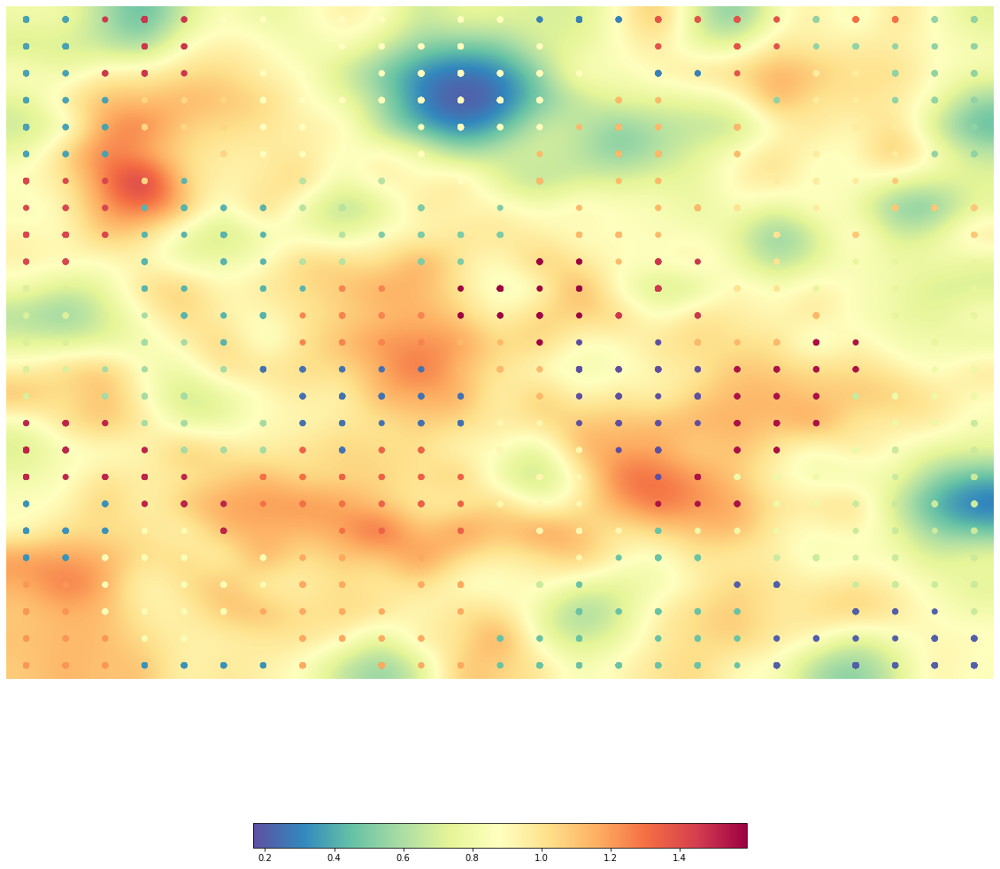

<module 'matplotlib.pyplot' from 'c:\\users\\michalis\\appdata\\local\\programs\\python\\python39\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

In [ ]:
analysis(35)

Cluster 17: (678 Total Movies)
[('Drama', 678), ('Indie', 62), ('Family Drama', 41), ('Family Film', 40), ('Comedy film', 31), ('Musical', 28), ('Period piece', 23), ('Television movie', 20), ('Melodrama', 19), ('Short Film', 18), ('Coming of age', 18), ('Adventure', 18), ('Fantasy', 14), ('Film adaptation', 13), ('Comedy-drama', 12), ('Sports', 11), ('Science Fiction', 11), ('Historical fiction', 10), ('Mystery', 10), ('Docudrama', 9), ('Romance Film', 9), ('Political drama', 8), ('Ensemble Film', 8), ('Chinese Movies', 8), ('Romantic drama', 8), ('Biopic [feature]', 7), ('Art film', 7), ('History', 7), ('Horror', 6), ('Japanese Movies', 6), ('Courtroom Drama', 6), ('Documentary', 6), ('Action/Adventure', 6), ('Silent film', 6), ('Teen', 6), ('Childhood Drama', 5), ('Western', 5), ('Road movie', 5), ("Children's/Family", 5), ('Disaster', 4), ('Black comedy', 4), ('Christian film', 4), ('Bollywood', 4), ('Addiction Drama', 4), ('Music', 4), ('Musical Drama', 4), ('Biography', 3), ('New

# Εκφώνηση


## Αποθήκευση του SOM

Επειδή η αρχικοποίηση του SOM γίνεται τυχαία και το clustering είναι και αυτό στοχαστική διαδικασία, οι θέσεις και οι ετικέτες των νευρώνων και των clusters θα είναι διαφορετικές κάθε φορά που τρέχετε τον χάρτη, ακόμα και με τις ίδιες παραμέτρους. Για να αποθηκεύσετε ένα συγκεκριμένο som και clustering χρησιμοποιήστε και πάλι την `joblib`. Μετά την ανάκληση ενός SOM θυμηθείτε να ακολουθήσετε τη διαδικασία για τα bmus.




## Οπτικοποίηση U-matrix, clustering και μέγεθος clusters

Για την εκτύπωση του U-matrix χρησιμοποιήστε τη `view_umatrix` με ορίσματα `bestmatches=True` και `figsize=(15, 15)` ή `figsize=(20, 20)`. Τα διαφορετικά χρώματα που εμφανίζονται στους κόμβους αντιπροσωπεύουν τα διαφορετικά clusters που προκύπτουν από τον k-Means. Μπορείτε να εμφανίσετε τη λεζάντα του U-matrix με το όρισμα `colorbar`. Μην τυπώνετε τις ετικέτες (labels) των δειγμάτων, είναι πολύ μεγάλος ο αριθμός τους.

Για μια δεύτερη πιο ξεκάθαρη οπτικοποίηση του clustering τυπώστε απευθείας τη μεταβλητή `clusters`.

Τέλος, χρησιμοποιώντας πάλι την `np.unique` (με διαφορετικό όρισμα) και την `np.argsort` (υπάρχουν και άλλοι τρόποι υλοποίησης) εκτυπώστε τις ετικέτες των clusters (αριθμοί από 0 έως k-1) και τον αριθμό των νευρώνων σε κάθε cluster, με φθίνουσα ή αύξουσα σειρά ως προς τον αριθμό των νευρώνων. Ουσιαστικά είναι ένα εργαλείο για να βρίσκετε εύκολα τα μεγάλα και μικρά clusters. 

Ακολουθεί ένα μη βελτιστοποιημένο παράδειγμα για τις τρεις προηγούμενες εξόδους:

<img src="https://image.ibb.co/i0tsfR/umatrix_s.jpg" width="35%">
<img src="https://image.ibb.co/nLgHEm/clusters.png" width="35%">




## Σημασιολογική ερμηνεία των clusters

Προκειμένου να μελετήσουμε τις τοπολογικές ιδιότητες του SOM και το αν έχουν ενσωματώσει σημασιολογική πληροφορία για τις ταινίες διαμέσου της διανυσματικής αναπαράστασης με το tf-idf και των κατηγοριών, χρειαζόμαστε ένα κριτήριο ποιοτικής επισκόπησης των clusters. Θα υλοποιήσουμε το εξής κριτήριο: Λαμβάνουμε όρισμα έναν αριθμό (ετικέτα) cluster. Για το cluster αυτό βρίσκουμε όλους τους νευρώνες που του έχουν ανατεθεί από τον k-Means. Για όλους τους νευρώνες αυτούς βρίσκουμε όλες τις ταινίες που τους έχουν ανατεθεί (για τις οποίες αποτελούν bmus). Για όλες αυτές τις ταινίες τυπώνουμε ταξινομημένη τη συνολική στατιστική όλων των ειδών (κατηγοριών) και τις συχνότητές τους. Αν το cluster διαθέτει καλή συνοχή και εξειδίκευση, θα πρέπει κάποιες κατηγορίες να έχουν σαφώς μεγαλύτερη συχνότητα από τις υπόλοιπες. Θα μπορούμε τότε να αναθέσουμε αυτήν/ές την/τις κατηγορία/ες ως ετικέτες κινηματογραφικού είδους στο cluster.

Μπορείτε να υλοποιήσετε τη συνάρτηση αυτή όπως θέλετε. Μια πιθανή διαδικασία θα μπορούσε να είναι η ακόλουθη:

1. Ορίζουμε συνάρτηση `print_categories_stats` που δέχεται ως είσοδο λίστα με ids ταινιών. Δημιουργούμε μια κενή λίστα συνολικών κατηγοριών. Στη συνέχεια, για κάθε ταινία επεξεργαζόμαστε το string `categories` ως εξής: δημιουργούμε μια λίστα διαχωρίζοντας το string κατάλληλα με την `split` και αφαιρούμε τα whitespaces μεταξύ ετικετών με την `strip`. Προσθέτουμε τη λίστα αυτή στη συνολική λίστα κατηγοριών με την `extend`. Τέλος χρησιμοποιούμε πάλι την `np.unique` για να μετρήσουμε συχνότητα μοναδικών ετικετών κατηγοριών και ταξινομούμε με την `np.argsort`. Τυπώνουμε τις κατηγορίες και τις συχνότητες εμφάνισης ταξινομημένα. Χρήσιμες μπορεί να σας φανούν και οι `np.ravel`, `np.nditer`, `np.array2string` και `zip`.

2. Ορίζουμε τη βασική μας συνάρτηση `print_cluster_neurons_movies_report` που δέχεται ως όρισμα τον αριθμό ενός cluster. Με τη χρήση της `np.where` μπορούμε να βρούμε τις συντεταγμένες των bmus που αντιστοιχούν στο cluster και με την `column_stack` να φτιάξουμε έναν πίνακα bmus για το cluster. Προσοχή στη σειρά (στήλη - σειρά) στον πίνακα bmus. Για κάθε bmu αυτού του πίνακα ελέγχουμε αν υπάρχει στον πίνακα μοναδικών bmus που έχουμε υπολογίσει στην αρχή συνολικά και αν ναι προσθέτουμε το αντίστοιχο index του νευρώνα σε μια λίστα. Χρήσιμες μπορεί να είναι και οι `np.rollaxis`, `np.append`, `np.asscalar`. Επίσης πιθανώς να πρέπει να υλοποιήσετε ένα κριτήριο ομοιότητας μεταξύ ενός bmu και ενός μοναδικού bmu από τον αρχικό πίνακα bmus.

3. Υλοποιούμε μια βοηθητική συνάρτηση `neuron_movies_report`. Λαμβάνει ένα σύνολο νευρώνων από την `print_cluster_neurons_movies_report` και μέσω της `indices` φτιάχνει μια λίστα με το σύνολο ταινιών που ανήκουν σε αυτούς τους νευρώνες. Στο τέλος καλεί με αυτή τη λίστα την `print_categories_stats` που τυπώνει τις στατιστικές των κατηγοριών.

Μπορείτε βέβαια να προσθέσετε οποιαδήποτε επιπλέον έξοδο σας βοηθάει. Μια χρήσιμη έξοδος είναι πόσοι νευρώνες ανήκουν στο cluster και σε πόσους και ποιους από αυτούς έχουν ανατεθεί ταινίες.

Θα επιτελούμε τη σημασιολογική ερμηνεία του χάρτη καλώντας την `print_cluster_neurons_movies_report` με τον αριθμός ενός cluster που μας ενδιαφέρει. 

Παράδειγμα εξόδου για ένα cluster (μη βελτιστοποιημένος χάρτης, ωστόσο βλέπετε ότι οι μεγάλες κατηγορίες έχουν σημασιολογική  συνάφεια):

```
Overall Cluster Genres stats:  
[('"Horror"', 86), ('"Science Fiction"', 24), ('"B-movie"', 16), ('"Monster movie"', 10), ('"Creature Film"', 10), ('"Indie"', 9), ('"Zombie Film"', 9), ('"Slasher"', 8), ('"World cinema"', 8), ('"Sci-Fi Horror"', 7), ('"Natural horror films"', 6), ('"Supernatural"', 6), ('"Thriller"', 6), ('"Cult"', 5), ('"Black-and-white"', 5), ('"Japanese Movies"', 4), ('"Short Film"', 3), ('"Drama"', 3), ('"Psychological thriller"', 3), ('"Crime Fiction"', 3), ('"Monster"', 3), ('"Comedy"', 2), ('"Western"', 2), ('"Horror Comedy"', 2), ('"Archaeology"', 2), ('"Alien Film"', 2), ('"Teen"', 2), ('"Mystery"', 2), ('"Adventure"', 2), ('"Comedy film"', 2), ('"Combat Films"', 1), ('"Chinese Movies"', 1), ('"Action/Adventure"', 1), ('"Gothic Film"', 1), ('"Costume drama"', 1), ('"Disaster"', 1), ('"Docudrama"', 1), ('"Film adaptation"', 1), ('"Film noir"', 1), ('"Parody"', 1), ('"Period piece"', 1), ('"Action"', 1)]```
   


## Tips για το SOM και το clustering

- Για την ομαδοποίηση ένα U-matrix καλό είναι να εμφανίζει και μπλε-πράσινες περιοχές (clusters) και κόκκινες περιοχές (ορίων). Παρατηρήστε ποια σχέση υπάρχει μεταξύ αριθμού ταινιών στο final set, μεγέθους grid και ποιότητας U-matrix.
- Για το k του k-Means προσπαθήστε να προσεγγίζει σχετικά τα clusters του U-matrix (όπως είπαμε είναι διαφορετικοί μέθοδοι clustering). Μικρός αριθμός k δεν θα σέβεται τα όρια. Μεγάλος αριθμός θα δημιουργεί υπο-clusters εντός των clusters που φαίνονται στο U-matrix. Το τελευταίο δεν είναι απαραίτητα κακό, αλλά μεγαλώνει τον αριθμό clusters που πρέπει να αναλυθούν σημασιολογικά.
- Σε μικρούς χάρτες και με μικρά final sets δοκιμάστε διαφορετικές παραμέτρους για την εκπαίδευση του SOM. Σημειώστε τυχόν παραμέτρους που επηρεάζουν την ποιότητα του clustering για το dataset σας ώστε να τις εφαρμόσετε στους μεγάλους χάρτες.
- Κάποια τοπολογικά χαρακτηριστικά εμφανίζονται ήδη σε μικρούς χάρτες. Κάποια άλλα χρειάζονται μεγαλύτερους χάρτες. Δοκιμάστε μεγέθη 20x20, 25x25 ή και 30x30 και αντίστοιχη προσαρμογή των k. Όσο μεγαλώνουν οι χάρτες, μεγαλώνει η ανάλυση του χάρτη αλλά μεγαλώνει και ο αριθμός clusters που πρέπει να αναλυθούν.




## Ανάλυση τοπολογικών ιδιοτήτων χάρτη SOM

Μετά το πέρας της εκπαίδευσης και του clustering θα έχετε ένα χάρτη με τοπολογικές ιδιότητες ως προς τα είδη των ταίνιών της συλλογής σας, κάτι αντίστοιχο με την εικόνα στην αρχή της Εφαρμογής 2 αυτού του notebook (η συγκεκριμένη εικόνα είναι μόνο για εικονογράφιση, δεν έχει καμία σχέση με τη συλλογή δεδομένων και τις κατηγορίες μας).

Για τον τελικό χάρτη SOM που θα παράξετε για τη συλλογή σας, αναλύστε σε markdown με συγκεκριμένη αναφορά σε αριθμούς clusters και τη σημασιολογική ερμηνεία τους τις εξής τρεις τοπολογικές ιδιότητες του SOM: 

1. Δεδομένα που έχουν μεγαλύτερη πυκνότητα πιθανότητας στο χώρο εισόδου τείνουν να απεικονίζονται με περισσότερους νευρώνες στο χώρο μειωμένης διαστατικότητας. Δώστε παραδείγματα από συχνές και λιγότερο συχνές κατηγορίες ταινιών. Χρησιμοποιήστε τις στατιστικές των κατηγοριών στη συλλογή σας και τον αριθμό κόμβων που χαρακτηρίζουν.
2. Μακρινά πρότυπα εισόδου τείνουν να απεικονίζονται απομακρυσμένα στο χάρτη. Υπάρχουν χαρακτηριστικές κατηγορίες ταινιών που ήδη από μικρούς χάρτες τείνουν να τοποθετούνται σε διαφορετικά ή απομονωμένα σημεία του χάρτη.
3. Κοντινά πρότυπα εισόδου τείνουν να απεικονίζονται κοντά στο χάρτη. Σε μεγάλους χάρτες εντοπίστε είδη ταινιών και κοντινά τους υποείδη.

Προφανώς τοποθέτηση σε 2 διαστάσεις που να σέβεται μια απόλυτη τοπολογία δεν είναι εφικτή, αφενός γιατί δεν υπάρχει κάποια απόλυτη εξ ορισμού για τα κινηματογραφικά είδη ακόμα και σε πολλές διαστάσεις, αφετέρου γιατί πραγματοποιούμε μείωση διαστατικότητας.

Εντοπίστε μεγάλα clusters και μικρά clusters που δεν έχουν σαφή χαρακτηριστικά. Εντοπίστε clusters συγκεκριμένων ειδών που μοιάζουν να μην έχουν τοπολογική συνάφεια με γύρω περιοχές. Προτείνετε πιθανές ερμηνείες.



Τέλος, εντοπίστε clusters που έχουν κατά την άποψή σας ιδιαίτερο ενδιαφέρον στη συλλογή της ομάδας σας (data exploration / discovery value) και σχολιάστε.



# Τελική παράδοση άσκησης

- Θα παραδώσετε στο eclass το παρόν notebook επεξεργασμένο ή ένα νέο με τις απαντήσεις σας για τα ζητούμενα και των δύο εφαρμογών. 
- Θυμηθείτε ότι η ανάλυση του χάρτη στο markdown με αναφορά σε αριθμούς clusters πρέπει να αναφέρεται στον τελικό χάρτη με τα κελιά ορατά που θα παραδώσετε αλλιώς ο χάρτης που θα προκύψει θα είναι διαφορετικός και τα labels των clusters δεν θα αντιστοιχούν στην ανάλυσή σας. 
- Μην ξεχάσετε στην αρχή ένα κελί markdown με **τα στοιχεία της ομάδας σας**.
- Στο **zip** που θα παραδώσετε πρέπει να βρίσκονται **2 αρχεία (το .ipynb και το .py του notebook σας)**.

<table>
  <tr><td align="center">
    <font size="4">Παρακαλούμε διατρέξτε βήμα-βήμα το notebook για να μην ξεχάσετε παραδοτέα!</font>
</td>
  </tr>
</table>